In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from torch_geometric.data import Data
from torch_geometric.utils import from_networkx
import torch
from torch_geometric.nn import GCNConv
from torch_geometric.nn import GATConv
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import balanced_accuracy_score, f1_score, confusion_matrix
from scipy.stats import norm
from scipy.stats import ttest_ind
import itertools
from tqdm import tqdm

### **1. 데이터 불러오기**

- yahoo finance를 통해 글로벌 인덱스 지수의 종가 데이터 크롤링 하였음
- 기간 : 2005.01.01 ~ 2024.12.31 (20년치)
- 전처리 : 결측치는 drop과 backfill로 처리
- 최종 데이터 : 248 * 26


In [3]:

index_close = pd.read_csv('data/global_indices.csv')
index_volume = pd.read_csv('data/global_indices_volume.csv')

index_close = index_close.iloc[1003:6288]
index_volume = index_volume.iloc[1003:6288]

# 삭제하려는 컬럼 리스트
columns_to_drop = [ 'MSCI World', 'Euro Stoxx 50', 'Nifty 50', 'MOEX Russia',
    'South Africa Top 40', 'Saudi Tadawul', 'Israel TA-125', 'Vietnam VN-Index', 'Philippine PSEi',
    'Colombia COLCAP', 'Chile IPSA', 'Peru S&P/BVL', 'Pakistan KSE 100', 'Bangladesh DSE General',
    'UAE ADX General', 'Qatar QE Index'
]

index_close = index_close.drop(columns=columns_to_drop, errors='ignore')
index_volume = index_volume.drop(columns=columns_to_drop, errors='ignore')

index_close = index_close.fillna(method='bfill')
index_volume = index_volume.fillna(method = 'bfill')


date_column = index_close.iloc[:, 0]  # 첫 번째 열

close_data = index_close.iloc[:, 1:]  # 두 번째 열부터
volume_data = index_volume.iloc[:, 1:]  # 두 번째 열부터

market_cap_data = close_data * volume_data
market_cap = pd.concat([date_column, market_cap_data], axis=1)

total_market_cap = market_cap.iloc[:, 1:].sum()
top_15_columns = total_market_cap.nlargest(15).index
top_15_market_cap = market_cap[["Date"] + list(top_15_columns)]

top_15_columns = top_15_market_cap.columns[1:]  # 날짜 열 제외

index = index_close[["Date"] + list(top_15_columns)]
index



,Date,Turkey BIST 100,Hang Seng,NASDAQ 100,S&P 500,Mexican IPC,FTSE 100,Dow Jones,Russell 2000,S&P/TSX,Nikkei 225,IBEX 35,DAX,Bovespa,Straits Times,CAC 40
1003,2003-12-31 00:00:00,18625.000000,12575.940430,1467.920044,1111.920044,8795.280273,4476.899902,10453.919922,556.909973,8220.900391,10825.169922,7879.192383,4018.500000,22445.0,1764.520020,3557.899902
1004,2004-01-02 00:00:00,19147.699219,12801.480469,1463.569946,1108.479980,8818.190430,4510.200195,10409.849609,560.849976,8293.700195,10825.169922,7879.192383,4018.500000,22445.0,1791.349976,3596.800049
1005,2004-01-05 00:00:00,19696.599609,13005.330078,1496.579956,1122.219971,9054.110352,4513.299805,10544.070312,568.919983,8381.700195,10825.169922,7911.392090,4035.899902,23532.0,1828.660034,3608.290039
1006,2004-01-06 00:00:00,19013.800781,13036.320312,1501.260010,1123.670044,9038.459961,4505.200195,10538.660156,569.890015,8405.099609,10813.990234,7913.692383,4035.439941,23576.0,1828.719971,3595.820068
1007,2004-01-07 00:00:00,19382.800781,13157.679688,1514.260010,1126.329956,9098.219727,4473.000000,10529.030273,574.619995,8388.500000,10757.820312,7913.692383,4004.399902,23320.0,1835.959961,3563.510010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6283,2024-12-23 00:00:00,9626.599609,19883.130859,21503.169922,5974.069824,49450.890625,8102.700195,42906.949219,2237.439941,24749.000000,39161.339844,11435.700195,19848.769531,120767.0,3752.330078,7272.319824
6284,2024-12-24 00:00:00,9672.799805,20098.289062,21797.650391,6040.040039,49316.621094,8137.000000,43297.031250,2259.850098,24846.800781,39036.851562,11473.900391,19984.320312,121078.0,3769.550049,7282.689941
6285,2024-12-26 00:00:00,9949.000000,20090.460938,21768.310547,6037.589844,49535.578125,8149.799805,43325.800781,2280.189941,24796.400391,39568.058594,11531.599609,19984.320312,121078.0,3761.449951,7355.370117
6286,2024-12-27 00:00:00,10025.500000,20090.460938,21473.019531,5970.839844,49290.578125,8149.799805,42992.210938,2244.590088,24796.400391,40281.160156,11531.599609,19984.320312,120269.0,3771.629883,7355.370117


### **2. 수익률 데이터로 변환**

- 종가 데이터를 1일 수익률 데이터로 변환

In [4]:
# 날짜를 인덱스에서 칼럼으로 변환
prices = index.copy()
prices = prices.set_index('Date')

# 숫자로 변환
prices = prices.apply(pd.to_numeric, errors='coerce')

prices = prices.reset_index()
prices['Date'] = pd.to_datetime(prices['Date']).dt.strftime('%Y-%m-%d')

returns = prices.set_index('Date').pct_change().reset_index()

returns = returns.dropna()
returns.set_index('Date', inplace = True)
returns


,Turkey BIST 100,Hang Seng,NASDAQ 100,S&P 500,Mexican IPC,FTSE 100,Dow Jones,Russell 2000,S&P/TSX,Nikkei 225,IBEX 35,DAX,Bovespa,Straits Times,CAC 40
Date,,,,,,,,,,,,,,,
2004-01-02,0.028064,0.017934,-0.002963,-0.003094,0.002605,0.007438,-0.004216,0.007075,0.008855,0.000000,0.000000,0.000000,0.000000,0.015205,0.010933
2004-01-05,0.028667,0.015924,0.022554,0.012395,0.026754,0.000687,0.012894,0.014389,0.010610,0.000000,0.004087,0.004330,0.048429,0.020828,0.003195
2004-01-06,-0.034666,0.002383,0.003127,0.001292,-0.001729,-0.001795,-0.000513,0.001705,0.002792,-0.001033,0.000291,-0.000114,0.001870,0.000033,-0.003456
2004-01-07,0.019407,0.009309,0.008659,0.002367,0.006612,-0.007147,-0.000914,0.008300,-0.001975,-0.005194,0.000000,-0.007692,-0.010859,0.003959,-0.008985
2004-01-08,0.001140,0.003489,0.010824,0.004963,0.007869,0.004740,0.006022,0.008701,-0.000250,0.007421,0.003753,0.010246,0.017024,0.003116,0.008200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-23,-0.010067,0.008237,0.010053,0.007287,-0.002729,0.002239,0.001557,-0.002199,0.006077,0.011871,-0.002756,-0.001809,-0.010933,0.008710,-0.000297
2024-12-24,0.004799,0.010821,0.013695,0.011043,-0.002715,0.004233,0.009091,0.010016,0.003952,-0.003179,0.003340,0.006829,0.002575,0.004589,0.001426
2024-12-26,0.028554,-0.000389,-0.001346,-0.000406,0.004440,0.001573,0.000664,0.009001,-0.002028,0.013608,0.005029,0.000000,0.000000,-0.002149,0.009980


In [5]:
# returns.to_csv("returns.csv")

### **3. 각 지수를 노드로, 지수간 상관관계를 엣지로 설정**

- 상관관계를 계산해서 절댓값이 0.3 이상인 것들에 대해서만 노드와 엣지로 구성
- 총 노드 수 : 26, 엣지 수 : 216

In [6]:
test_periods = [
    ("2004-01-01", "2004-06-30", "2004-07-01", "2004-12-31"),
    ("2004-07-01", "2004-12-31", "2005-01-01", "2005-06-30"),
    ("2005-01-01", "2005-06-30", "2005-07-01", "2005-12-31"),
    ("2005-07-01", "2005-12-31", "2006-01-01", "2006-06-30"),
    ("2006-01-01", "2006-06-30", "2006-07-01", "2006-12-31"),
    ("2006-07-01", "2006-12-31", "2007-01-01", "2007-06-30"),
    ("2007-01-01", "2007-06-30", "2007-07-01", "2007-12-31"),
    ("2007-07-01", "2007-12-31", "2008-01-01", "2008-06-30"),
    ("2008-01-01", "2008-06-30", "2008-07-01", "2008-12-31"),
    ("2008-07-01", "2008-12-31", "2009-01-01", "2009-06-30"),
    ("2009-01-01", "2009-06-30", "2009-07-01", "2009-12-31"),
    ("2009-07-01", "2009-12-31", "2010-01-01", "2010-06-30"),
    ("2010-01-01", "2010-06-30", "2010-07-01", "2010-12-31"),
    ("2010-07-01", "2010-12-31", "2011-01-01", "2011-06-30"),
    ("2011-01-01", "2011-06-30", "2011-07-01", "2011-12-31"),
    ("2011-07-01", "2011-12-31", "2012-01-01", "2012-06-30"),
    ("2012-01-01", "2012-06-30", "2012-07-01", "2012-12-31"),
    ("2012-07-01", "2012-12-31", "2013-01-01", "2013-06-30"),
    ("2013-01-01", "2013-06-30", "2013-07-01", "2013-12-31"),
    ("2013-07-01", "2013-12-31", "2014-01-01", "2014-06-30"),
    ("2014-01-01", "2014-06-30", "2014-07-01", "2014-12-31"),
    ("2014-07-01", "2014-12-31", "2015-01-01", "2015-06-30"),
    ("2015-01-01", "2015-06-30", "2015-07-01", "2015-12-31"),
    ("2015-07-01", "2015-12-31", "2016-01-01", "2016-06-30"),
    ("2016-01-01", "2016-06-30", "2016-07-01", "2016-12-31"),
    ("2016-07-01", "2016-12-31", "2017-01-01", "2017-06-30"),
    ("2017-01-01", "2017-06-30", "2017-07-01", "2017-12-31"),
    ("2017-07-01", "2017-12-31", "2018-01-01", "2018-06-30"),
    ("2018-01-01", "2018-06-30", "2018-07-01", "2018-12-31"),
    ("2018-07-01", "2018-12-31", "2019-01-01", "2019-06-30"),
    ("2019-01-01", "2019-06-30", "2019-07-01", "2019-12-31"),
    ("2019-07-01", "2019-12-31", "2020-01-01", "2020-06-30"),
    ("2020-01-01", "2020-06-30", "2020-07-01", "2020-12-31"),
    ("2020-07-01", "2020-12-31", "2021-01-01", "2021-06-30"),
    ("2021-01-01", "2021-06-30", "2021-07-01", "2021-12-31"),
    ("2021-07-01", "2021-12-31", "2022-01-01", "2022-06-30"),
    ("2022-01-01", "2022-06-30", "2022-07-01", "2022-12-31"),
    ("2022-07-01", "2022-12-31", "2023-01-01", "2023-06-30"),
    ("2023-01-01", "2023-06-30", "2023-07-01", "2023-12-31"),
    ("2023-07-01", "2023-12-31", "2024-01-01", "2024-06-30"),
    ("2024-01-01", "2024-06-30", "2024-07-01", "2024-12-31")
]

Processing Test 1: Train (2004-01-01 to 2004-06-30), Test (2004-07-01 to 2004-12-31)


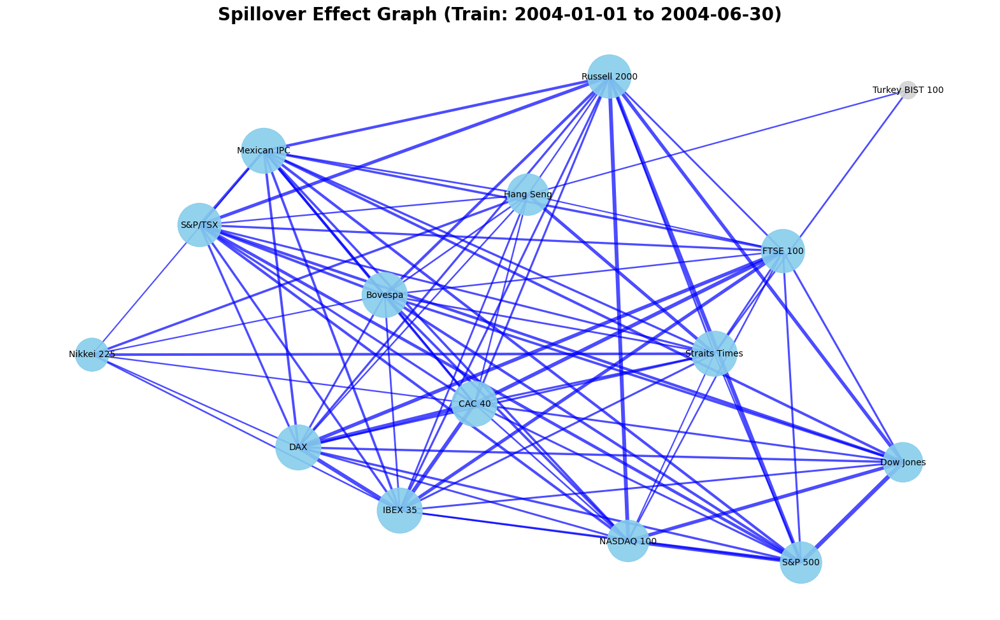

Processing Test 2: Train (2004-07-01 to 2004-12-31), Test (2005-01-01 to 2005-06-30)


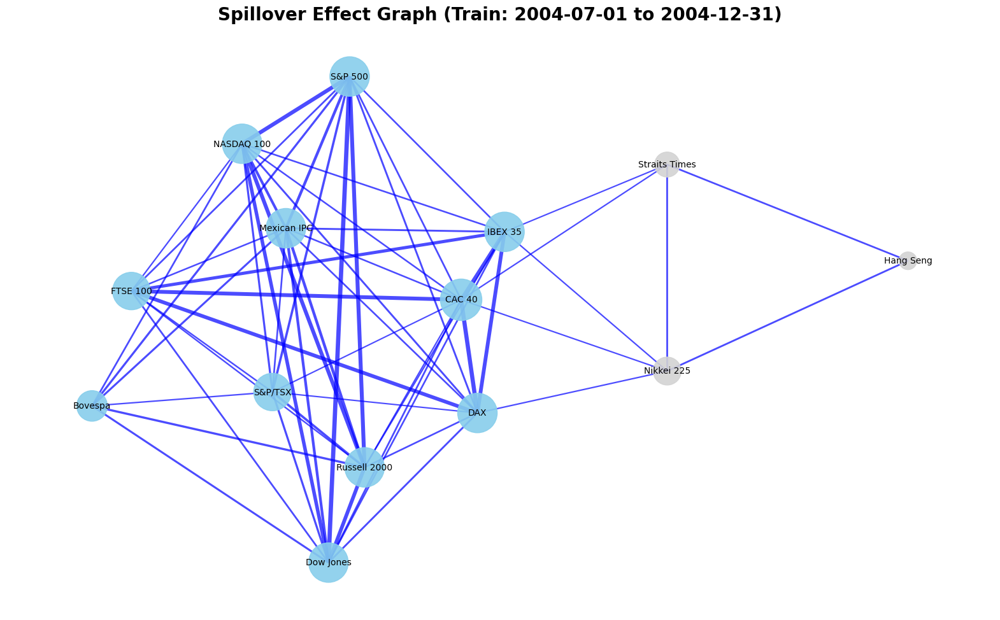

Processing Test 3: Train (2005-01-01 to 2005-06-30), Test (2005-07-01 to 2005-12-31)


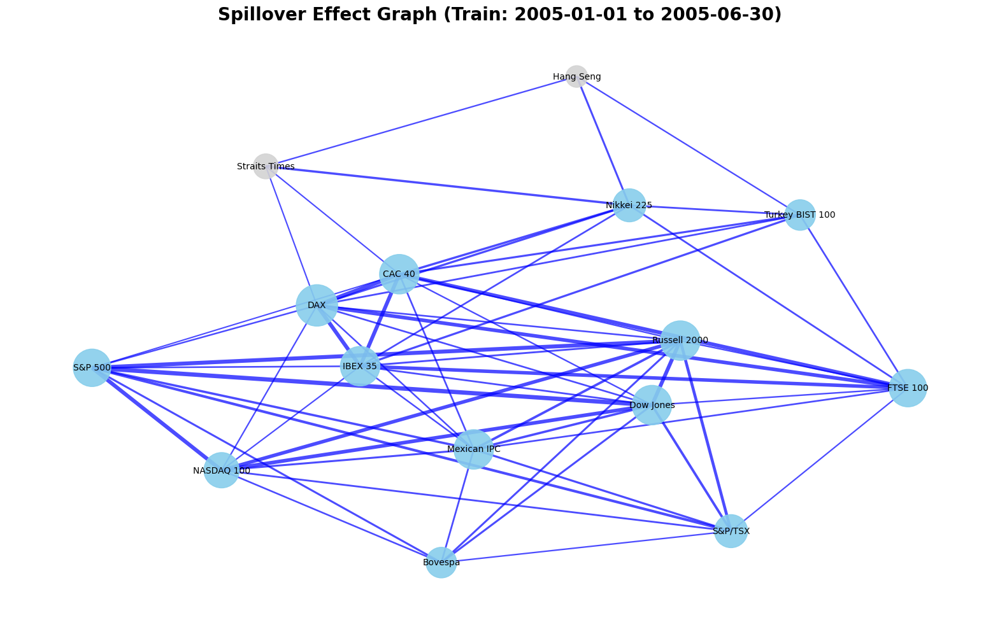

Processing Test 4: Train (2005-07-01 to 2005-12-31), Test (2006-01-01 to 2006-06-30)


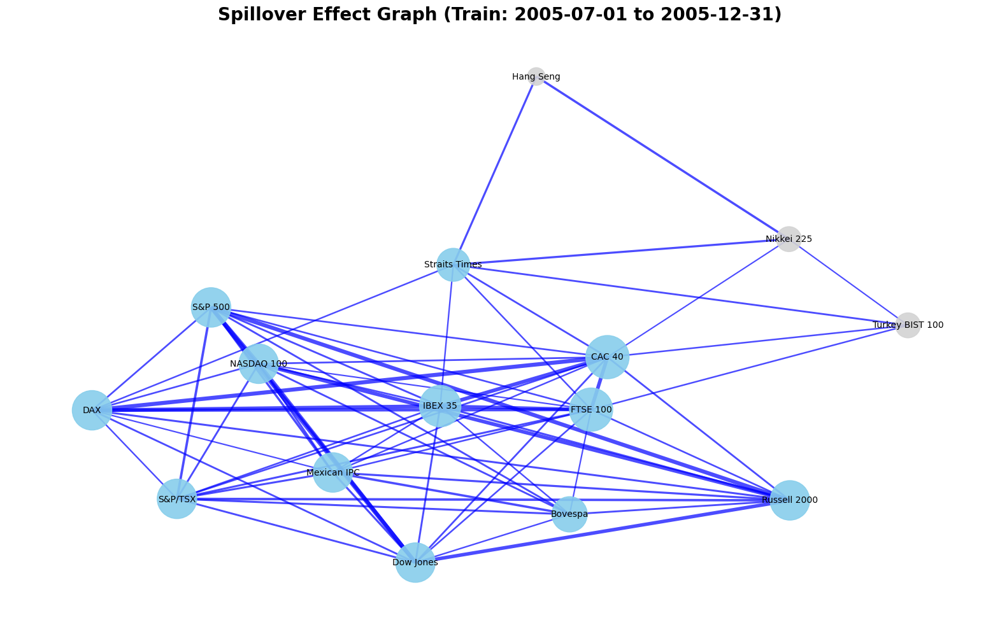

Processing Test 5: Train (2006-01-01 to 2006-06-30), Test (2006-07-01 to 2006-12-31)


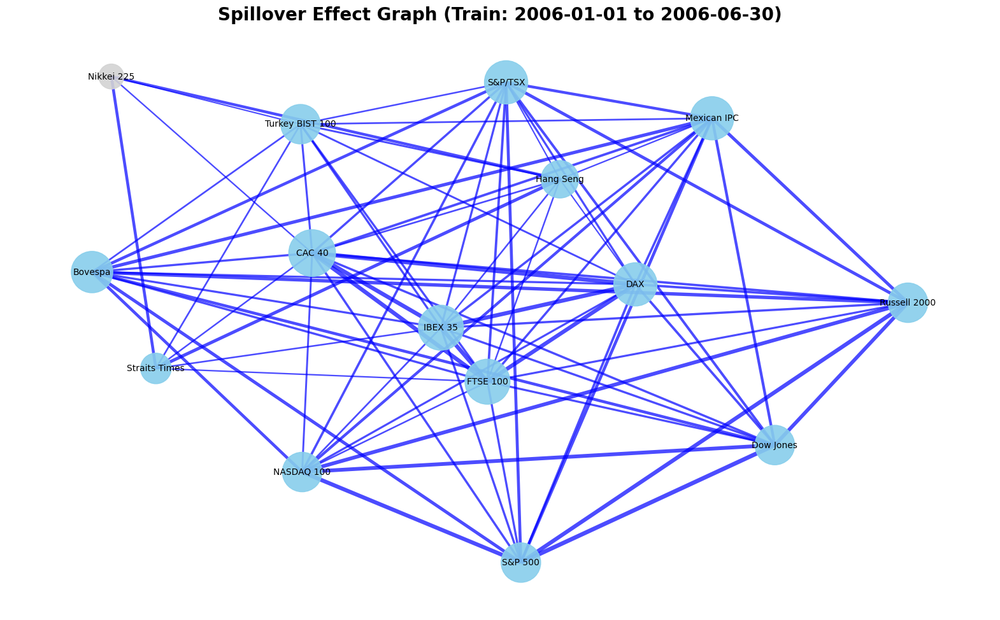

Processing Test 6: Train (2006-07-01 to 2006-12-31), Test (2007-01-01 to 2007-06-30)


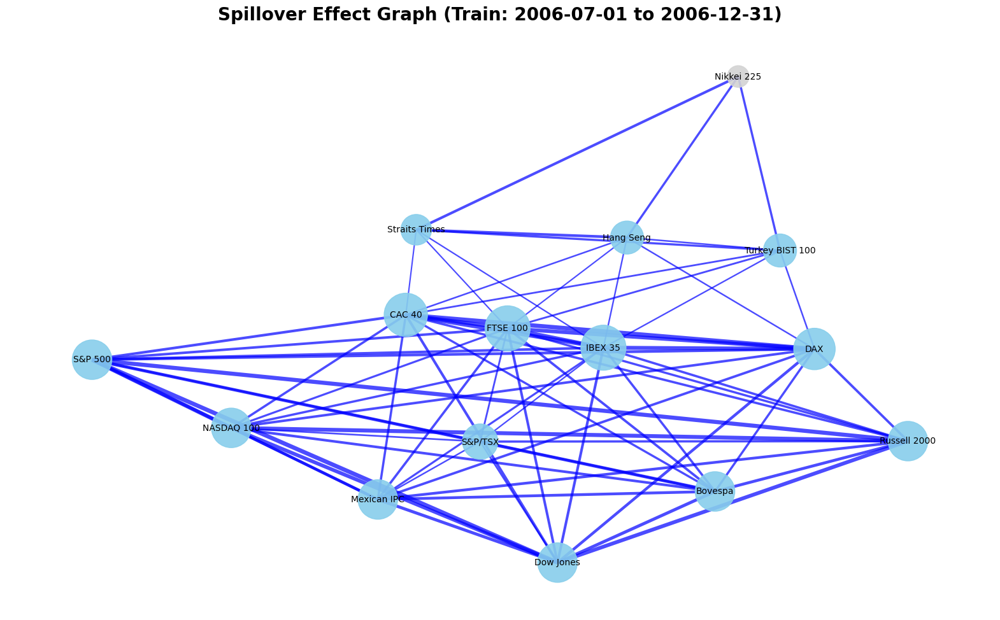

Processing Test 7: Train (2007-01-01 to 2007-06-30), Test (2007-07-01 to 2007-12-31)


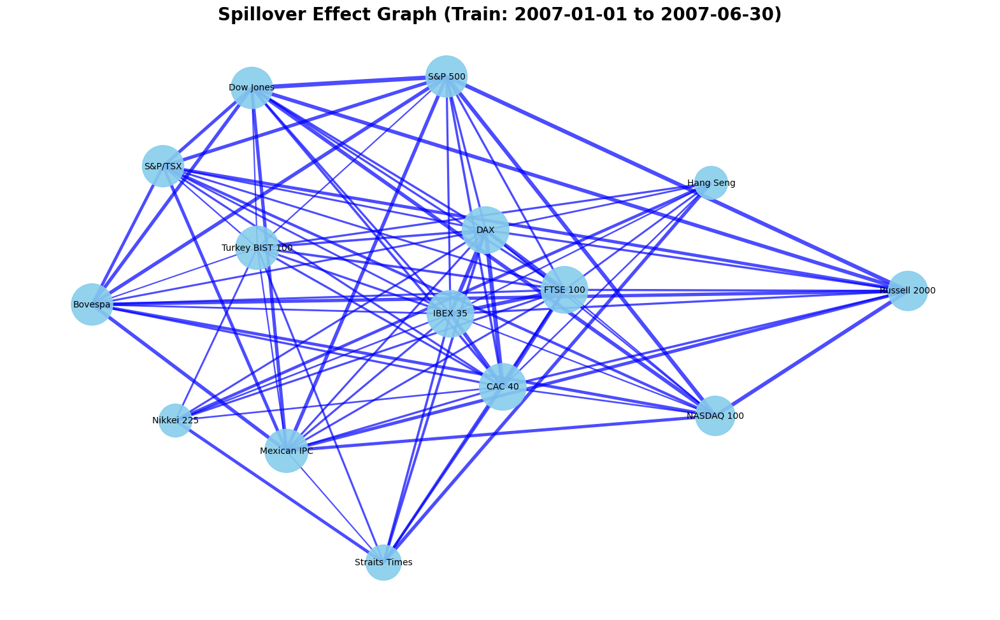

Processing Test 8: Train (2007-07-01 to 2007-12-31), Test (2008-01-01 to 2008-06-30)


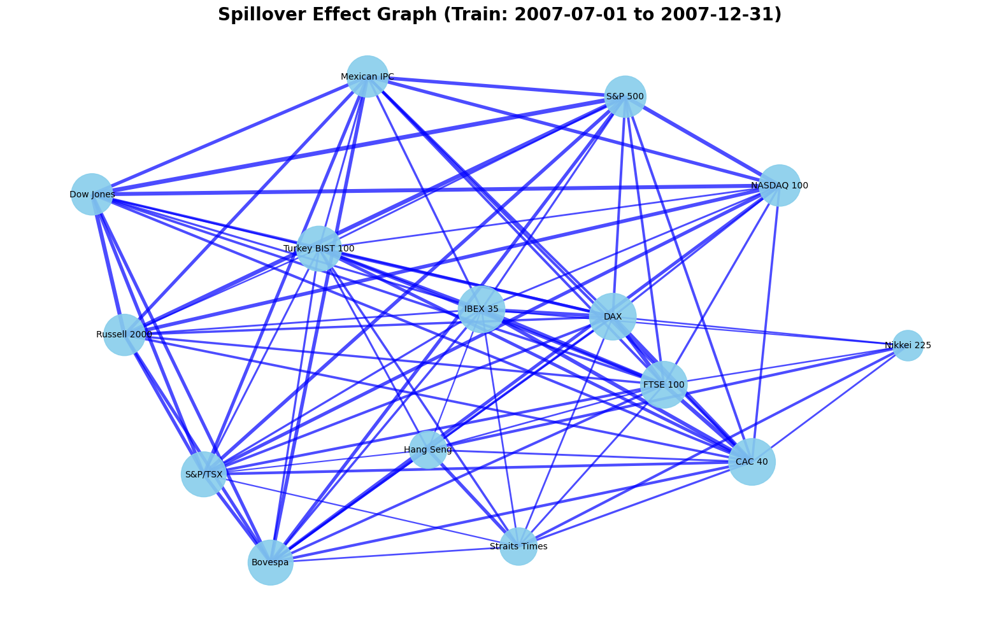

Processing Test 9: Train (2008-01-01 to 2008-06-30), Test (2008-07-01 to 2008-12-31)


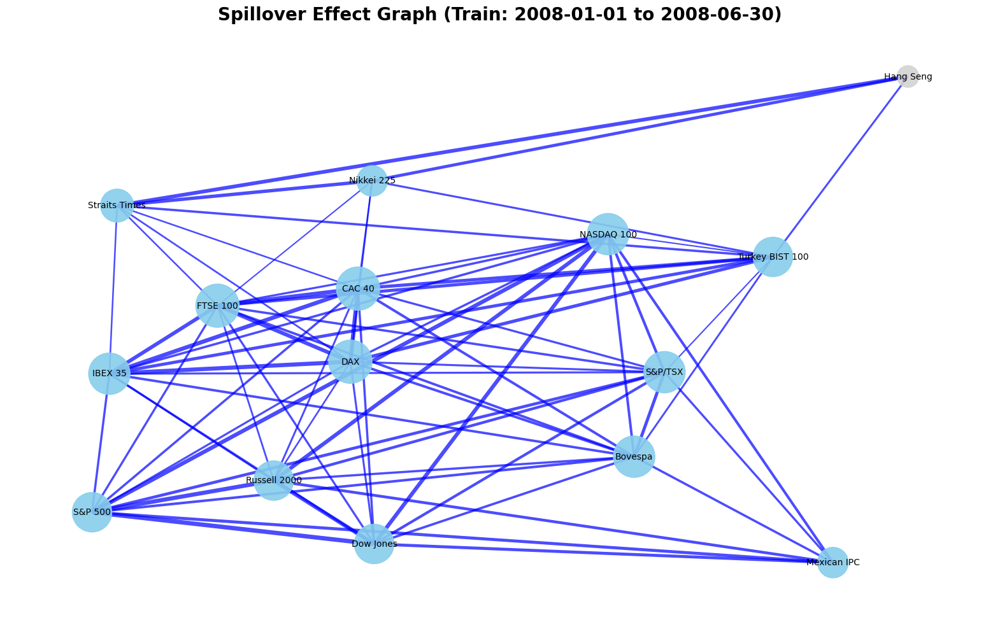

Processing Test 10: Train (2008-07-01 to 2008-12-31), Test (2009-01-01 to 2009-06-30)


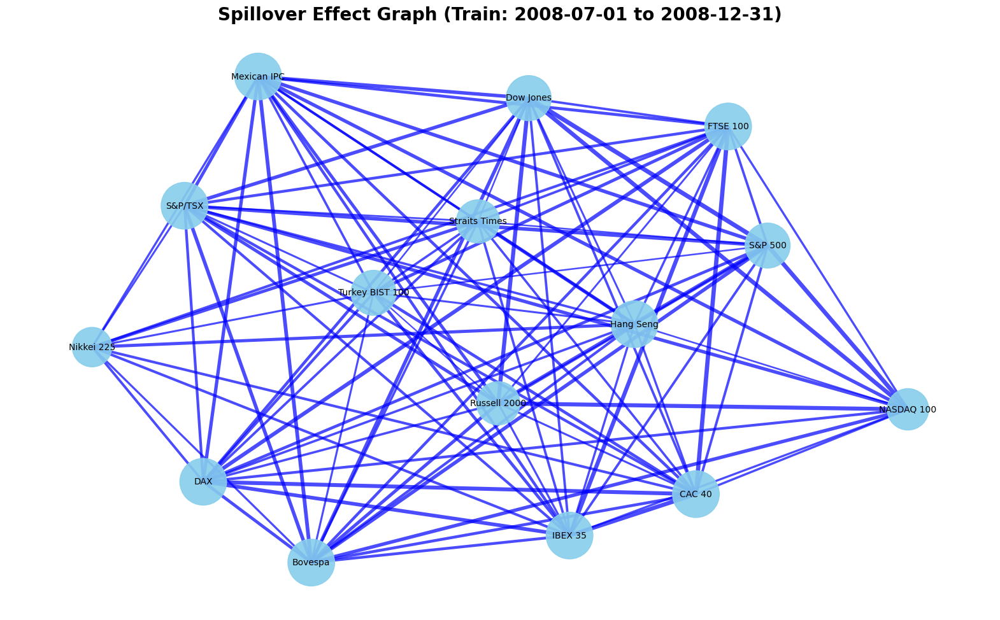

Processing Test 11: Train (2009-01-01 to 2009-06-30), Test (2009-07-01 to 2009-12-31)


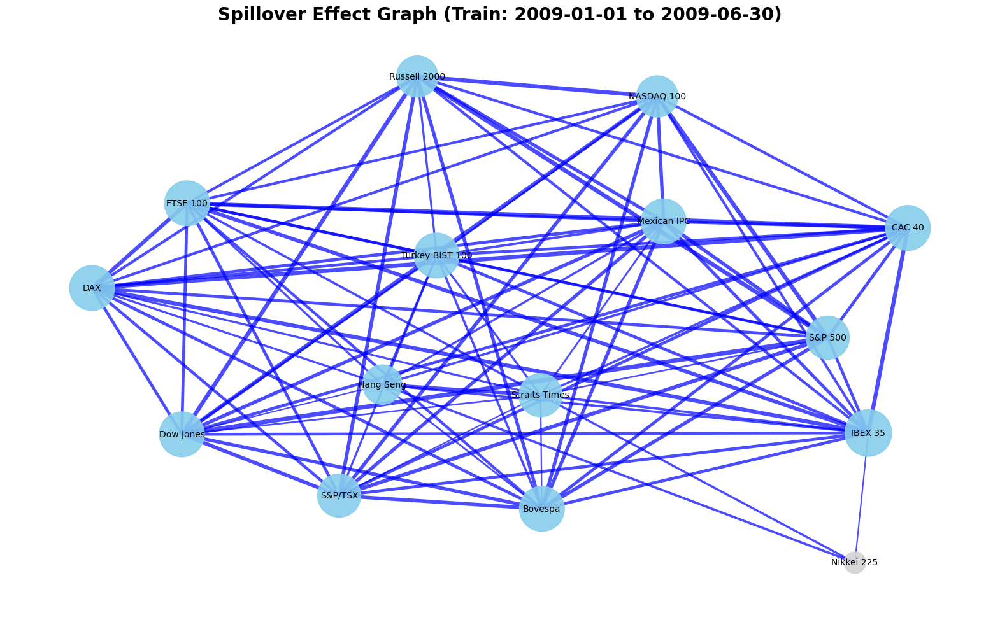

Processing Test 12: Train (2009-07-01 to 2009-12-31), Test (2010-01-01 to 2010-06-30)


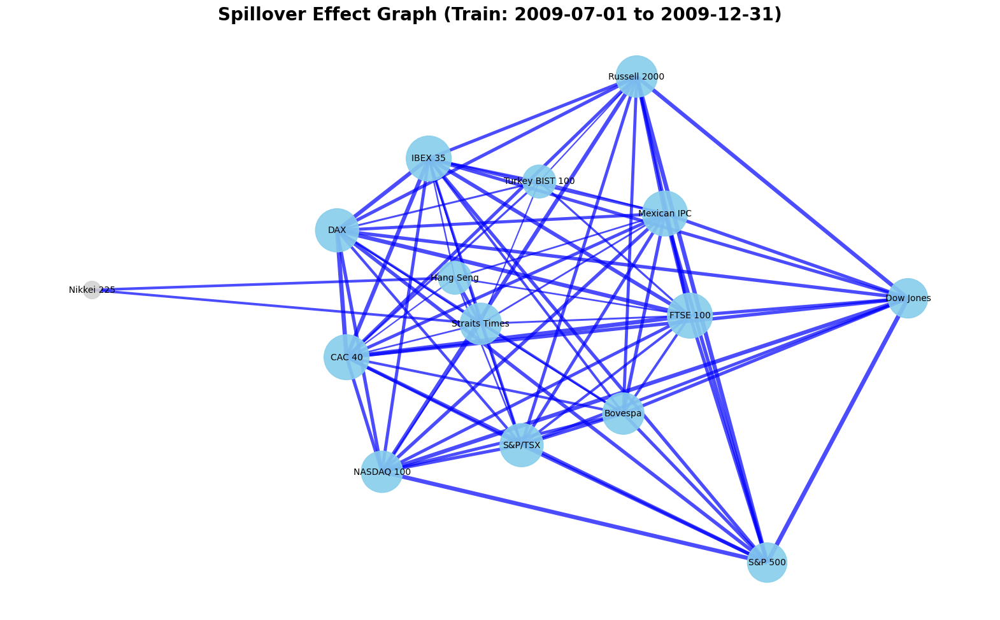

Processing Test 13: Train (2010-01-01 to 2010-06-30), Test (2010-07-01 to 2010-12-31)


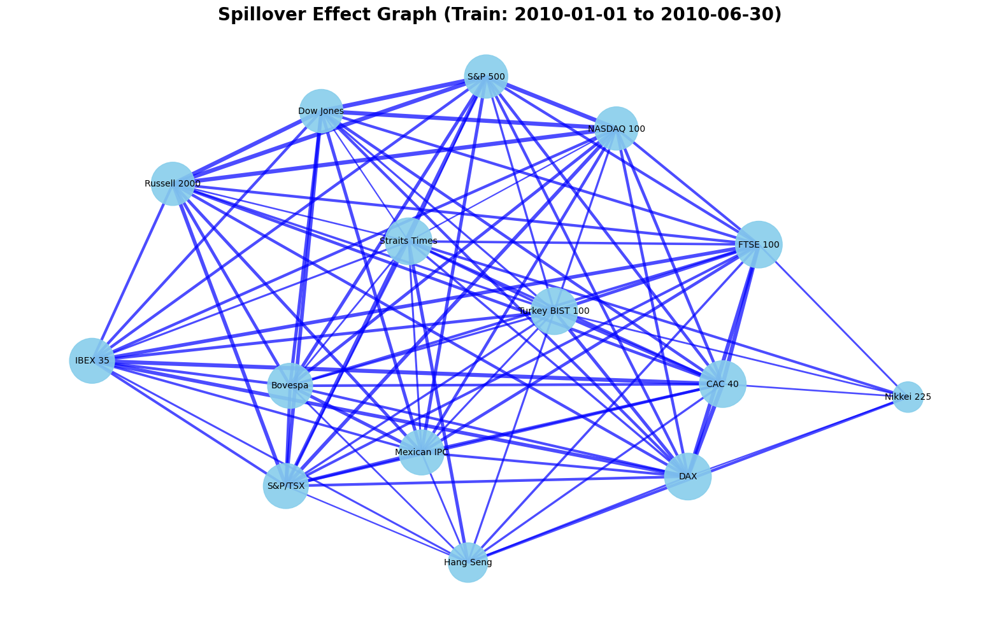

Processing Test 14: Train (2010-07-01 to 2010-12-31), Test (2011-01-01 to 2011-06-30)


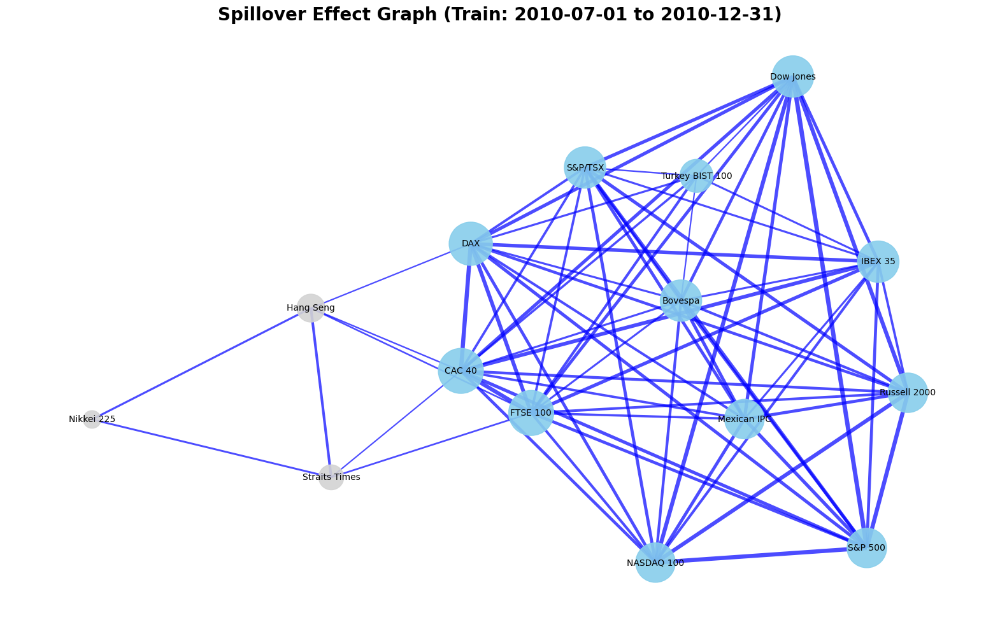

Processing Test 15: Train (2011-01-01 to 2011-06-30), Test (2011-07-01 to 2011-12-31)


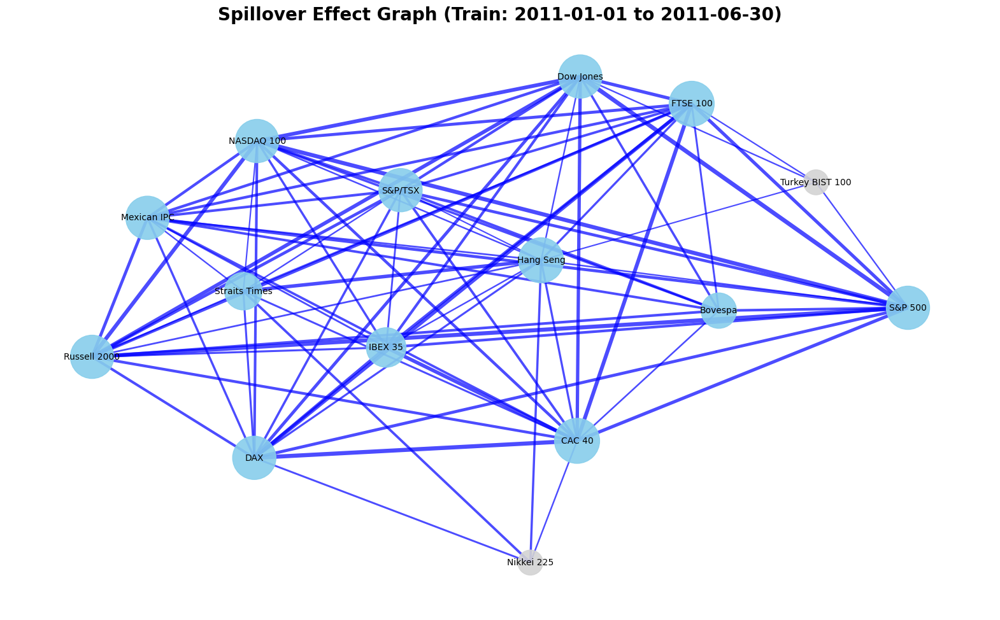

Processing Test 16: Train (2011-07-01 to 2011-12-31), Test (2012-01-01 to 2012-06-30)


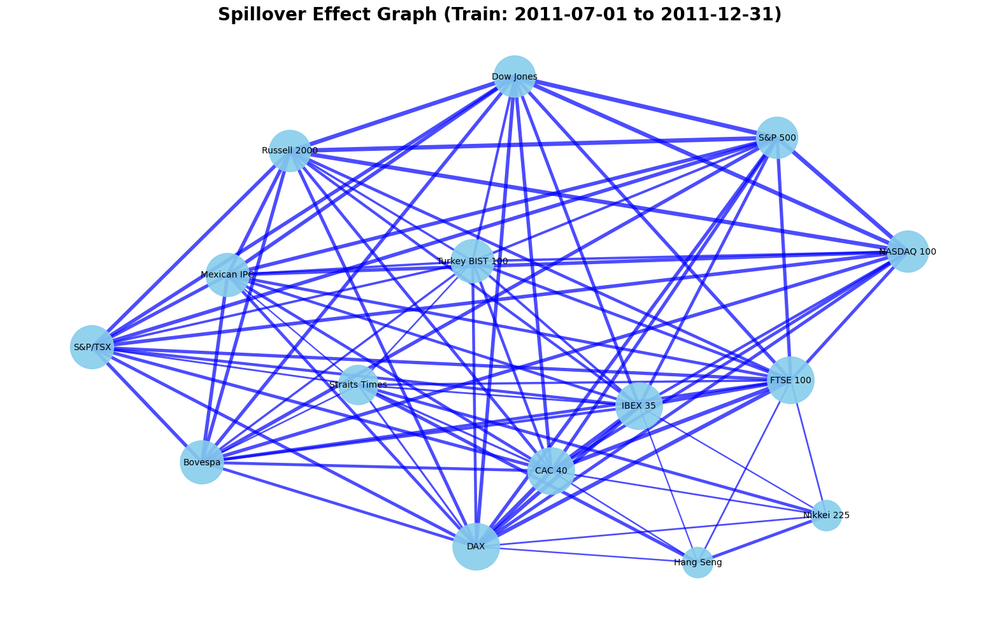

Processing Test 17: Train (2012-01-01 to 2012-06-30), Test (2012-07-01 to 2012-12-31)


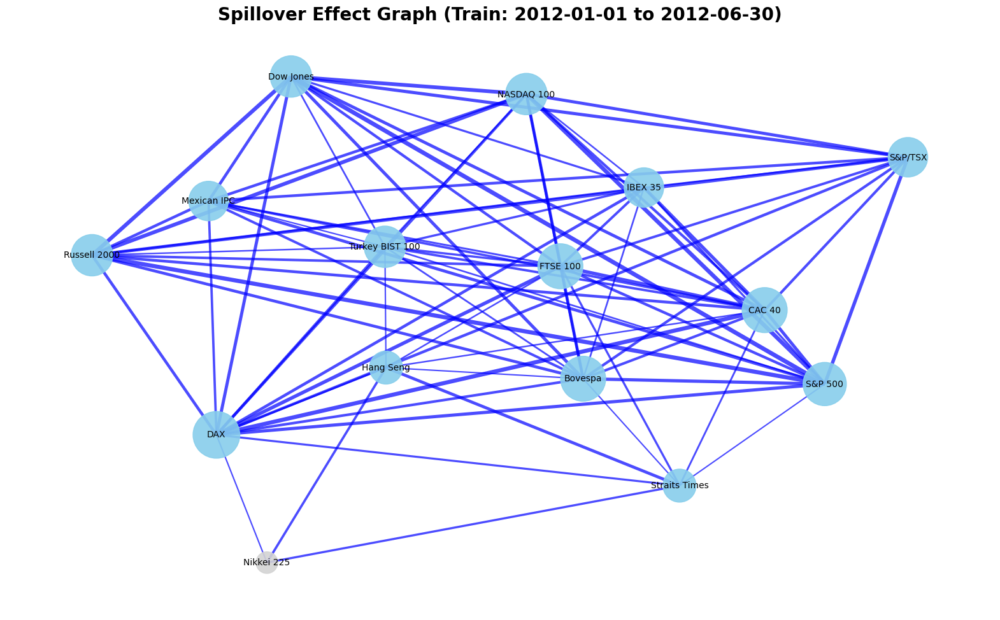

Processing Test 18: Train (2012-07-01 to 2012-12-31), Test (2013-01-01 to 2013-06-30)


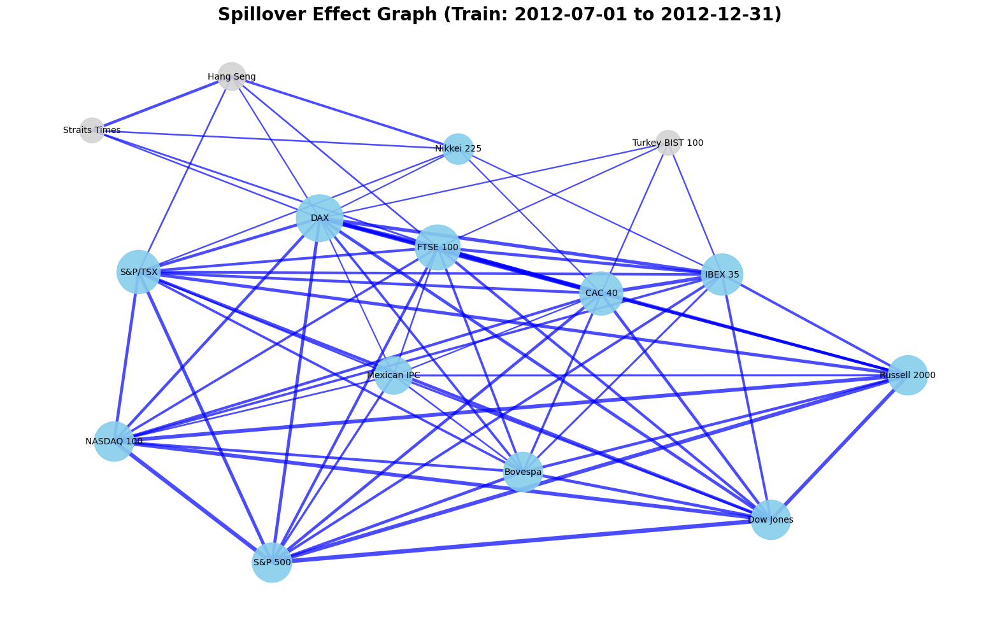

Processing Test 19: Train (2013-01-01 to 2013-06-30), Test (2013-07-01 to 2013-12-31)


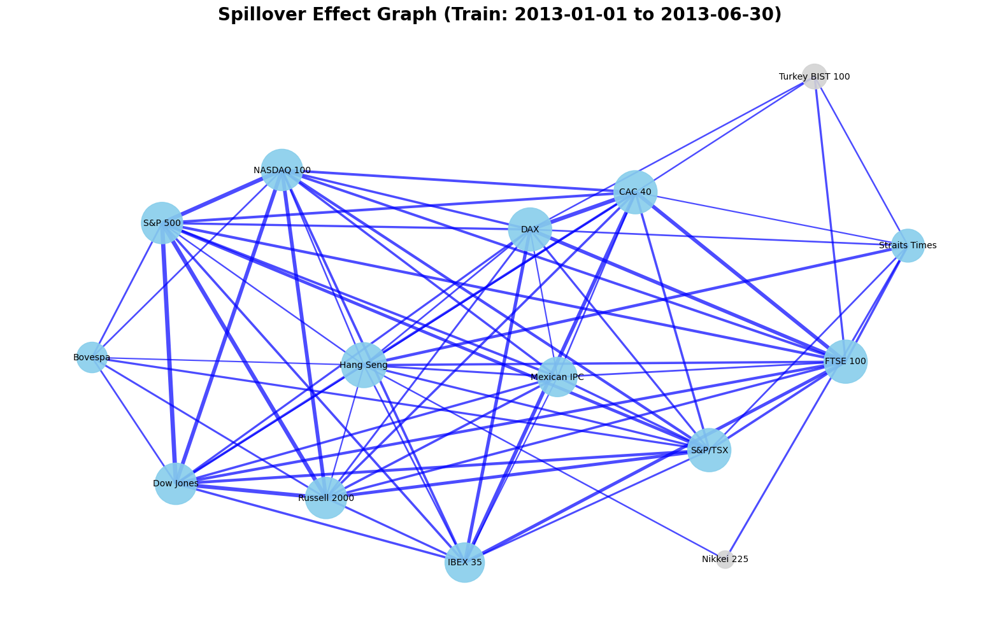

Processing Test 20: Train (2013-07-01 to 2013-12-31), Test (2014-01-01 to 2014-06-30)


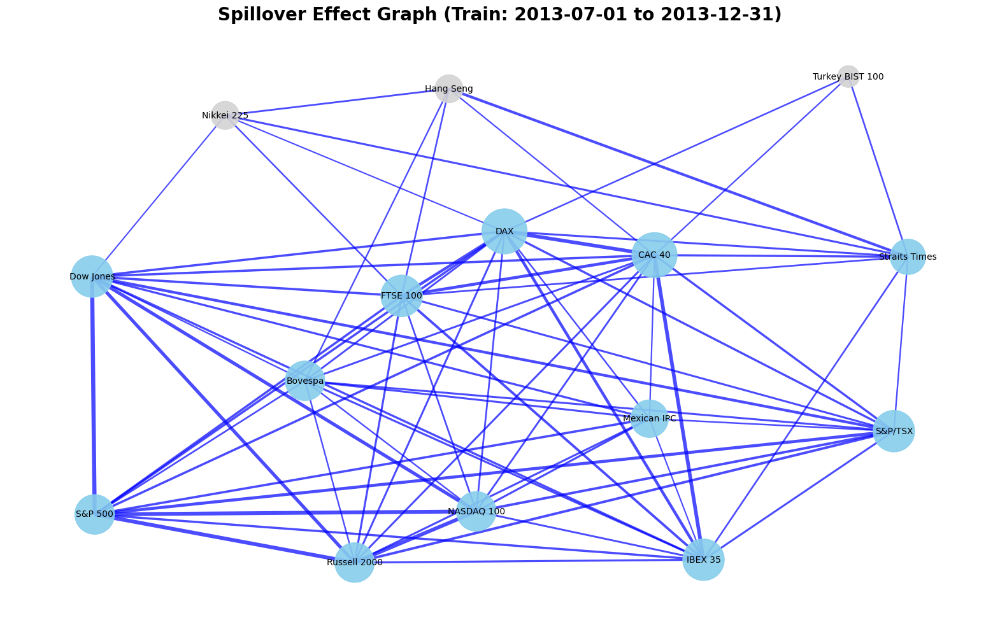

Processing Test 21: Train (2014-01-01 to 2014-06-30), Test (2014-07-01 to 2014-12-31)


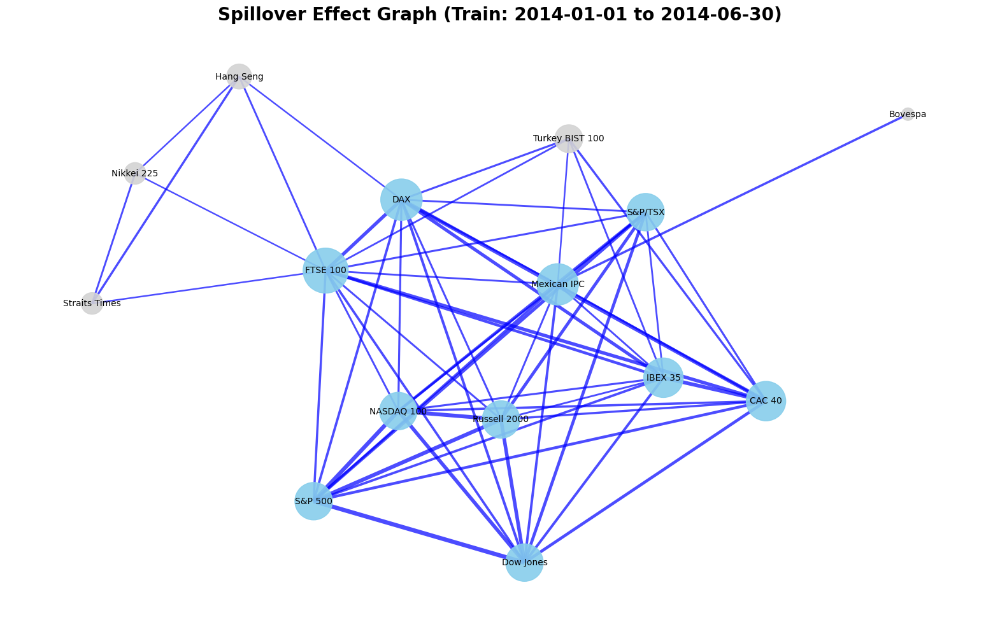

Processing Test 22: Train (2014-07-01 to 2014-12-31), Test (2015-01-01 to 2015-06-30)


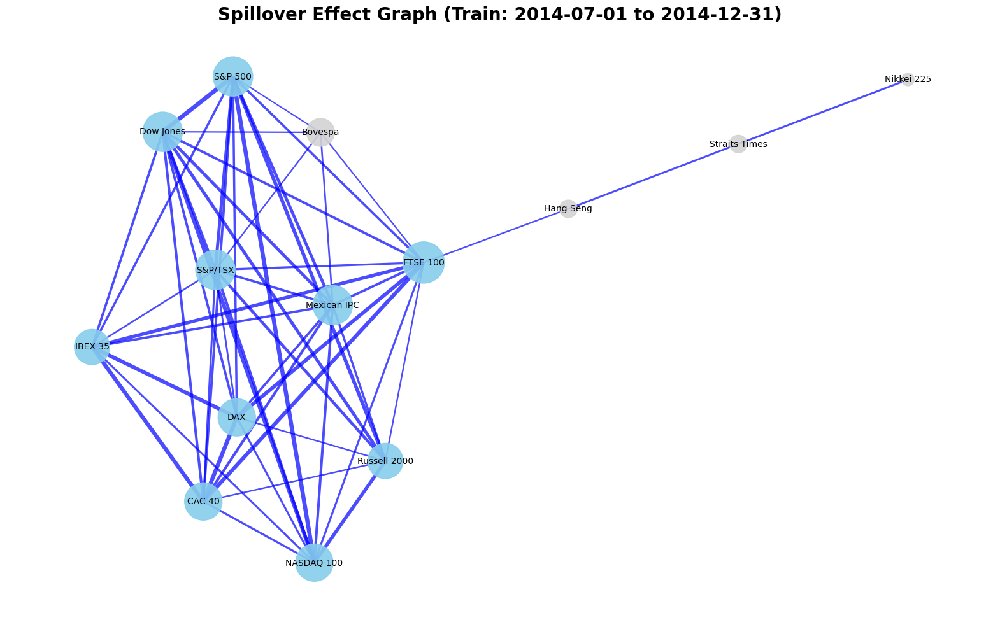

Processing Test 23: Train (2015-01-01 to 2015-06-30), Test (2015-07-01 to 2015-12-31)


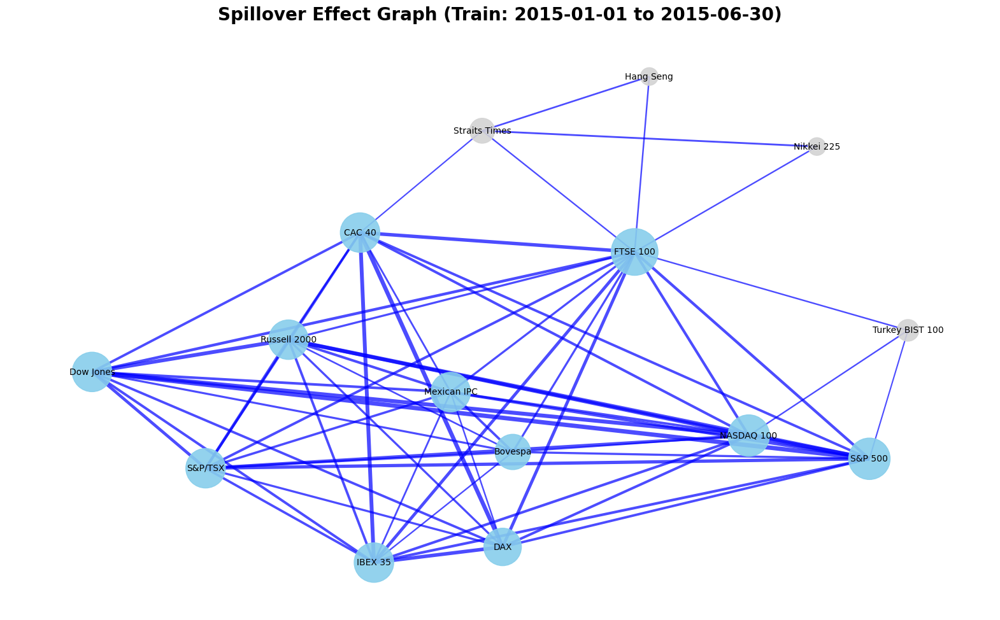

Processing Test 24: Train (2015-07-01 to 2015-12-31), Test (2016-01-01 to 2016-06-30)


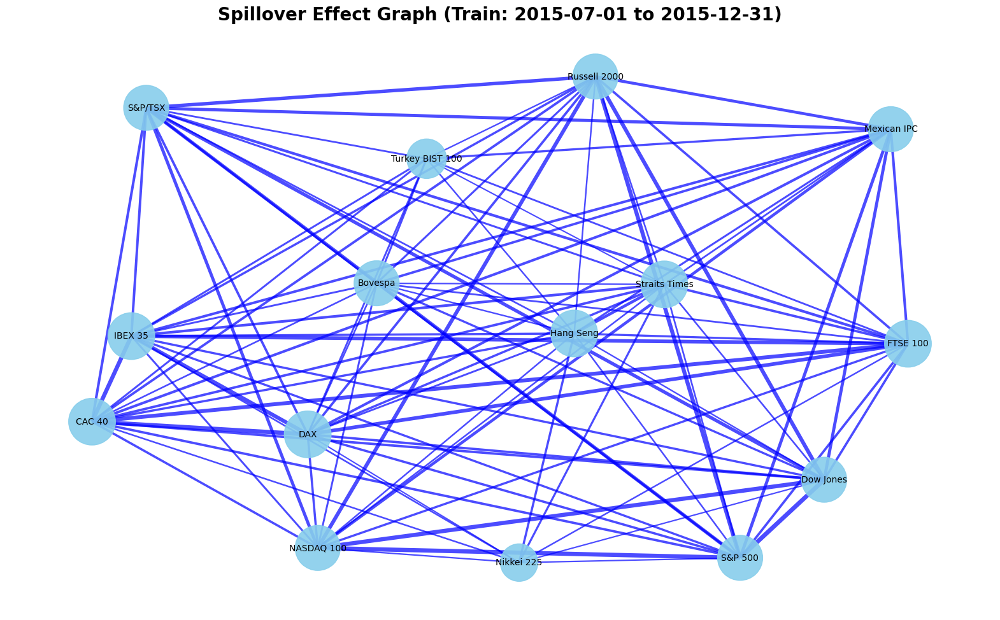

Processing Test 25: Train (2016-01-01 to 2016-06-30), Test (2016-07-01 to 2016-12-31)


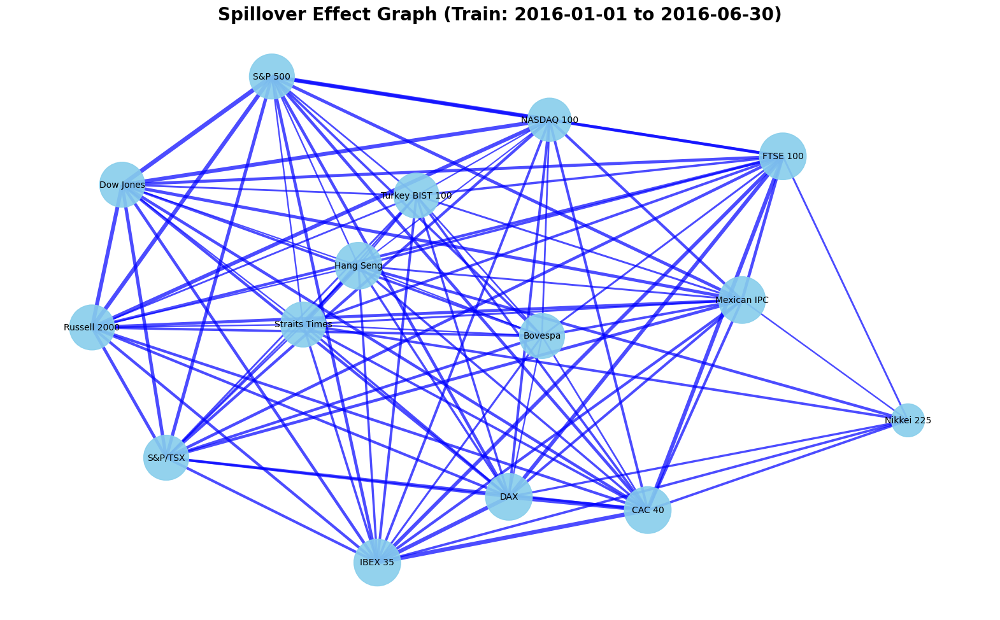

Processing Test 26: Train (2016-07-01 to 2016-12-31), Test (2017-01-01 to 2017-06-30)


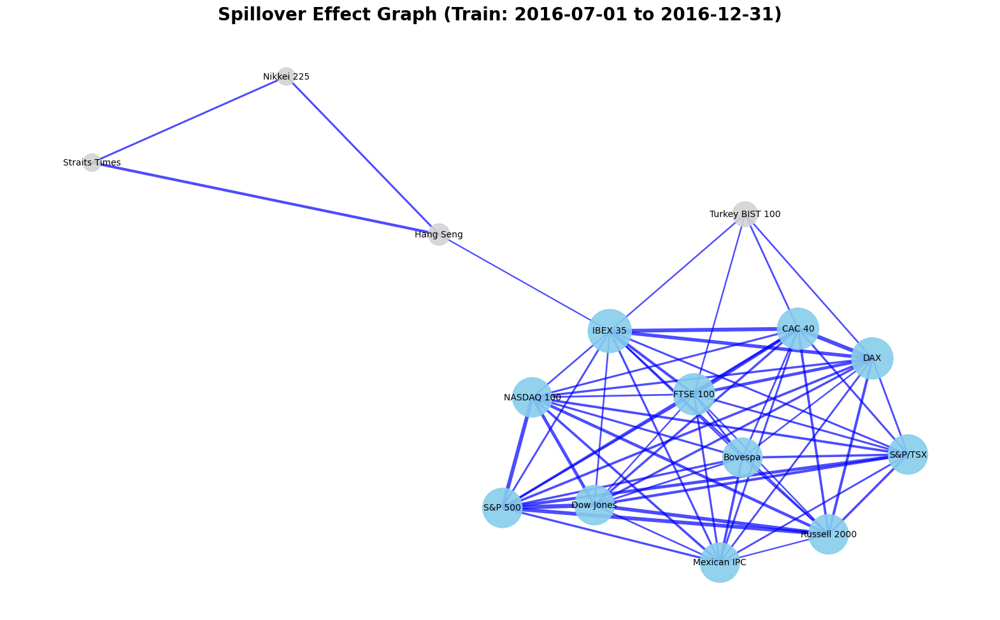

Processing Test 27: Train (2017-01-01 to 2017-06-30), Test (2017-07-01 to 2017-12-31)


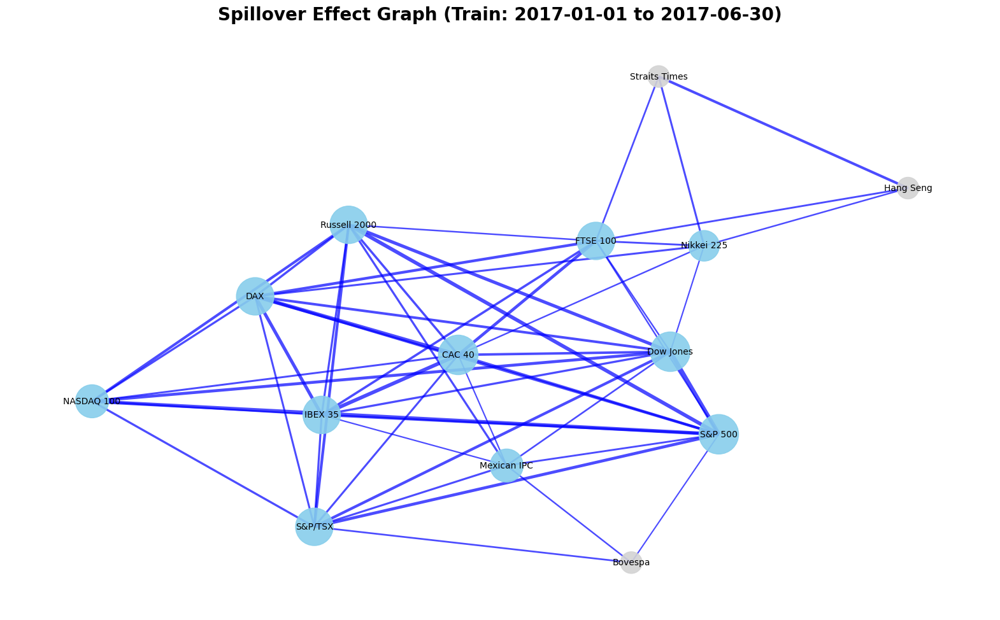

Processing Test 28: Train (2017-07-01 to 2017-12-31), Test (2018-01-01 to 2018-06-30)


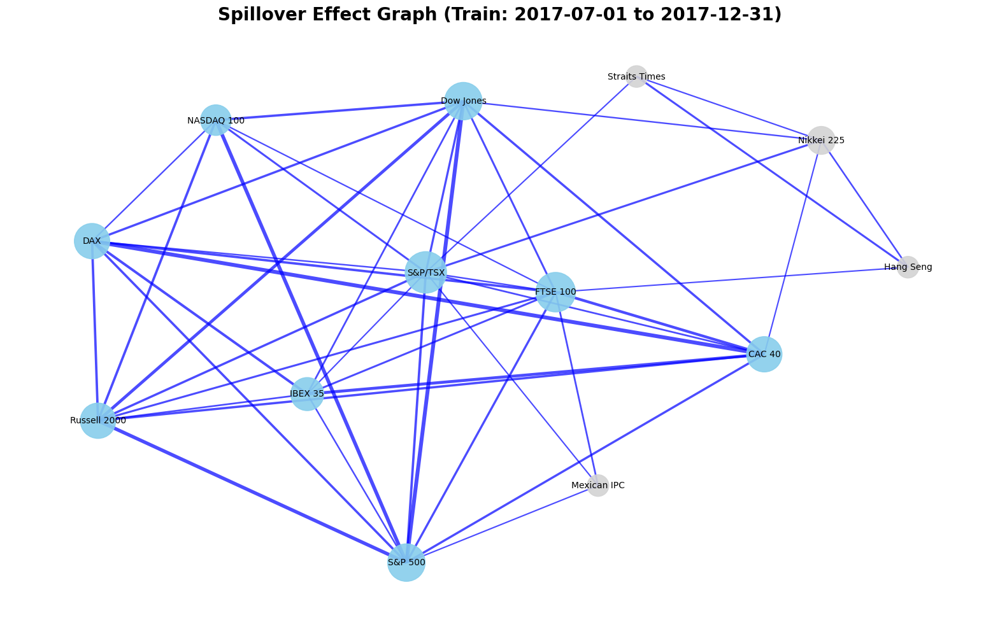

Processing Test 29: Train (2018-01-01 to 2018-06-30), Test (2018-07-01 to 2018-12-31)


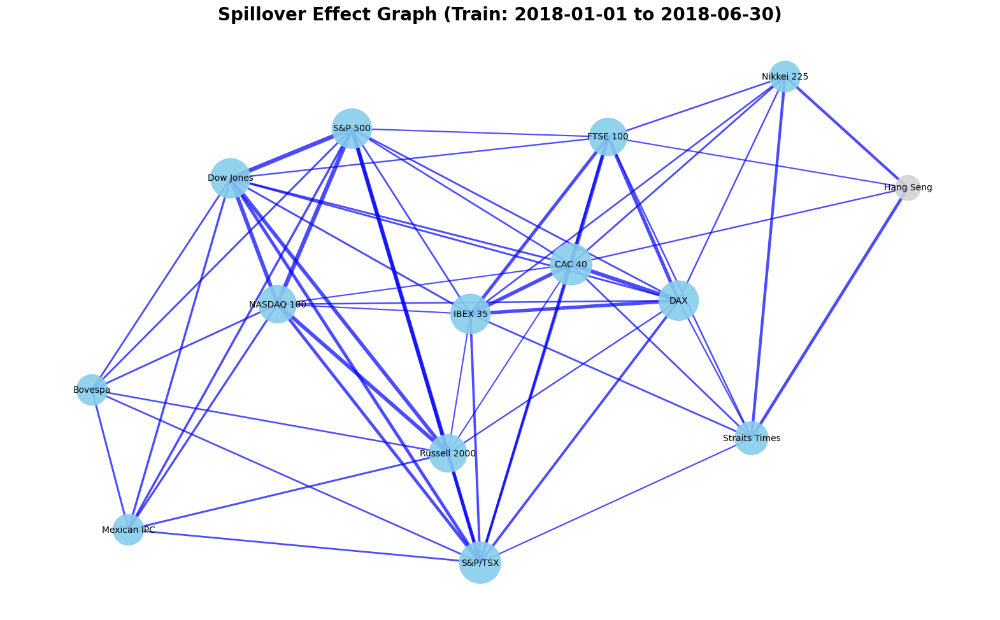

Processing Test 30: Train (2018-07-01 to 2018-12-31), Test (2019-01-01 to 2019-06-30)


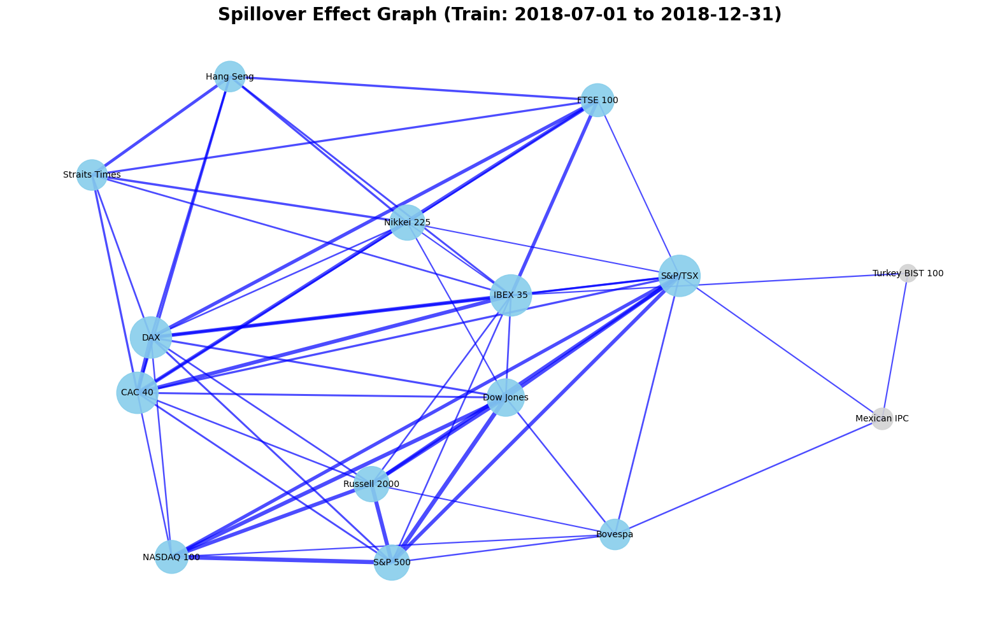

Processing Test 31: Train (2019-01-01 to 2019-06-30), Test (2019-07-01 to 2019-12-31)


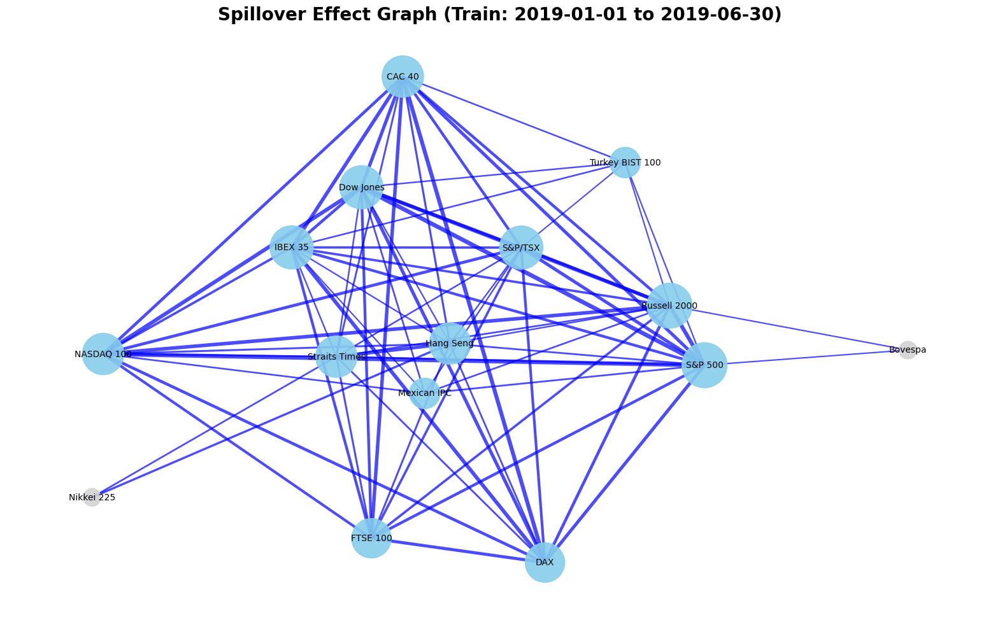

Processing Test 32: Train (2019-07-01 to 2019-12-31), Test (2020-01-01 to 2020-06-30)


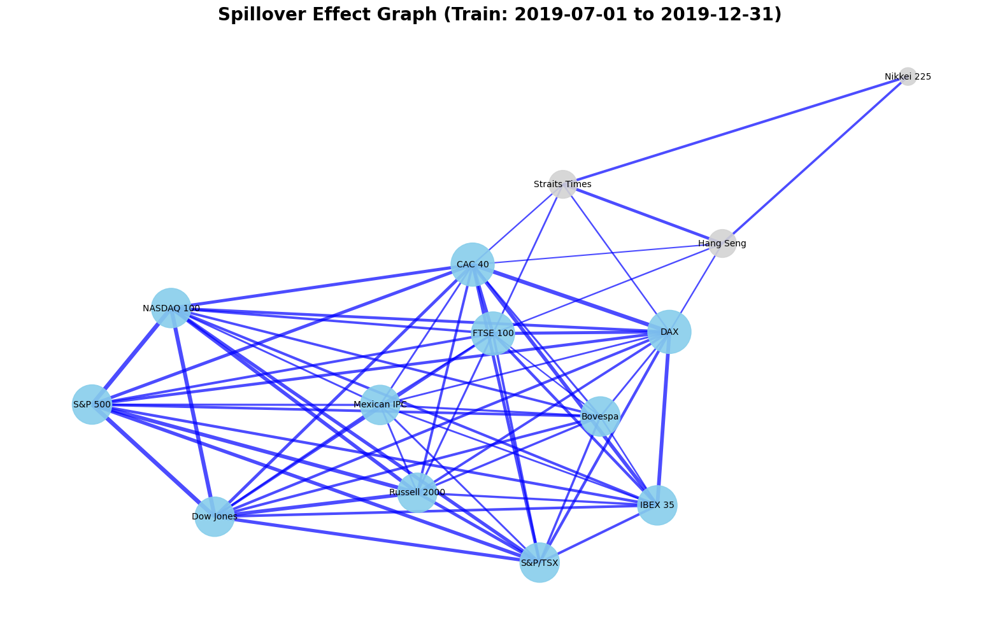

Processing Test 33: Train (2020-01-01 to 2020-06-30), Test (2020-07-01 to 2020-12-31)


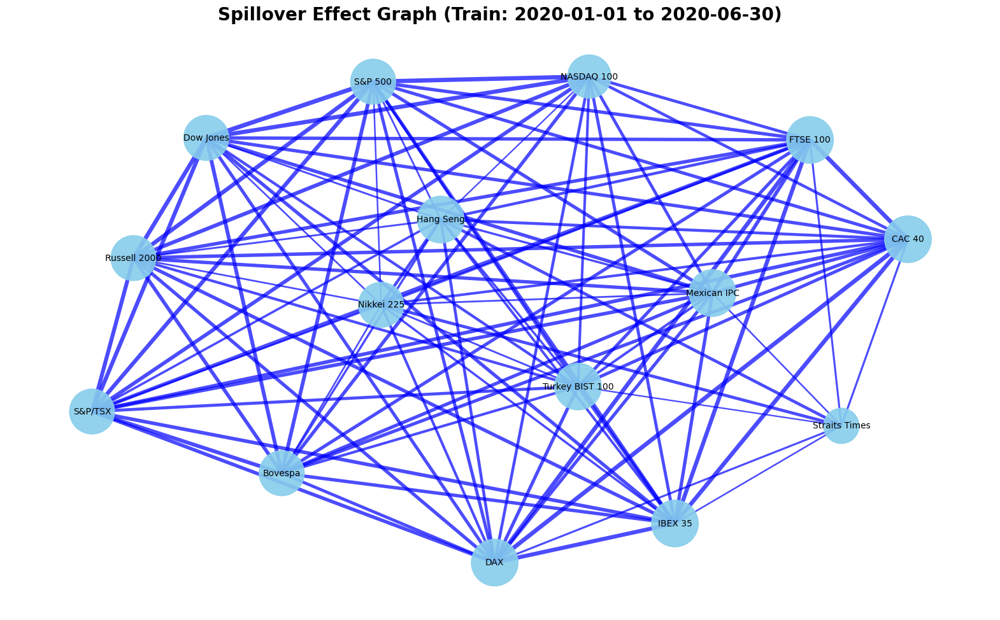

Processing Test 34: Train (2020-07-01 to 2020-12-31), Test (2021-01-01 to 2021-06-30)


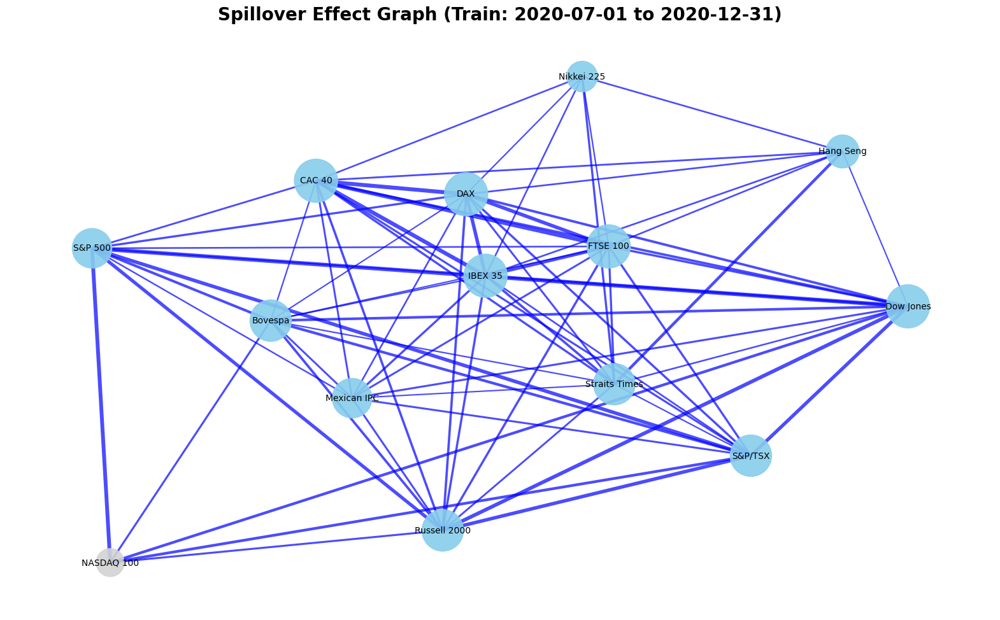

Processing Test 35: Train (2021-01-01 to 2021-06-30), Test (2021-07-01 to 2021-12-31)


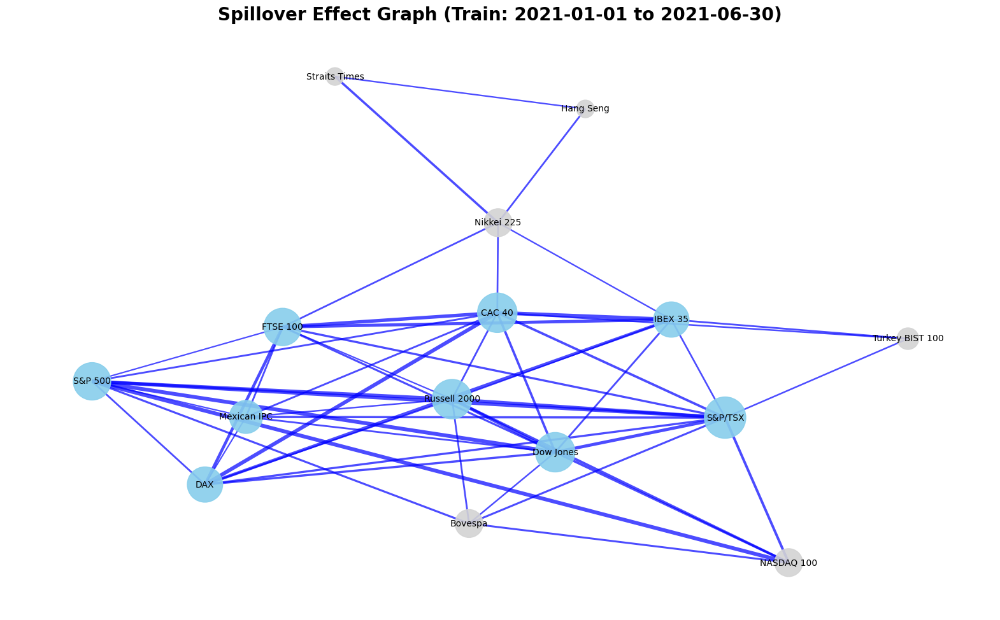

Processing Test 36: Train (2021-07-01 to 2021-12-31), Test (2022-01-01 to 2022-06-30)


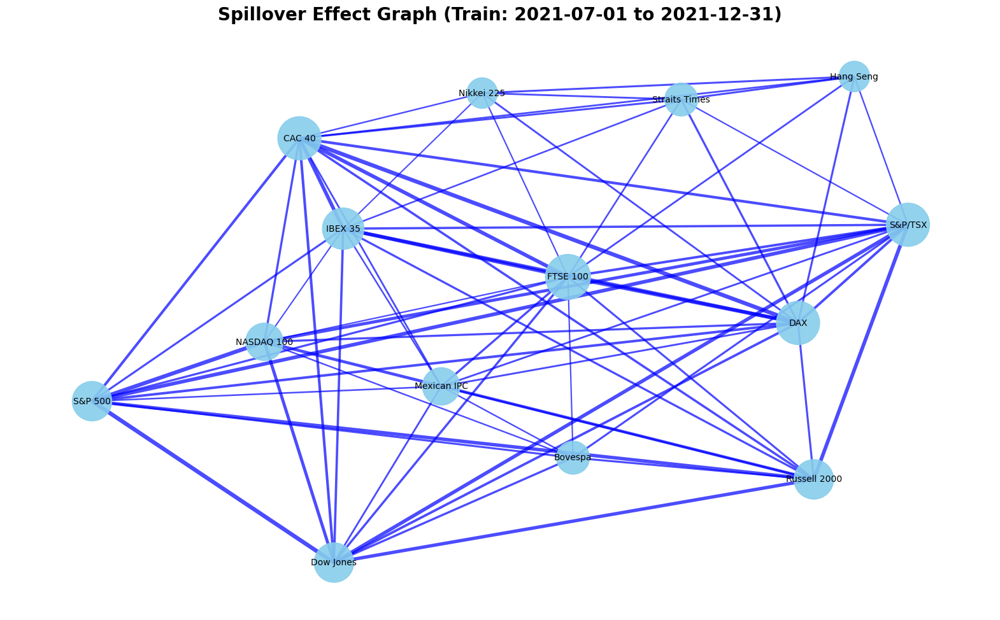

Processing Test 37: Train (2022-01-01 to 2022-06-30), Test (2022-07-01 to 2022-12-31)


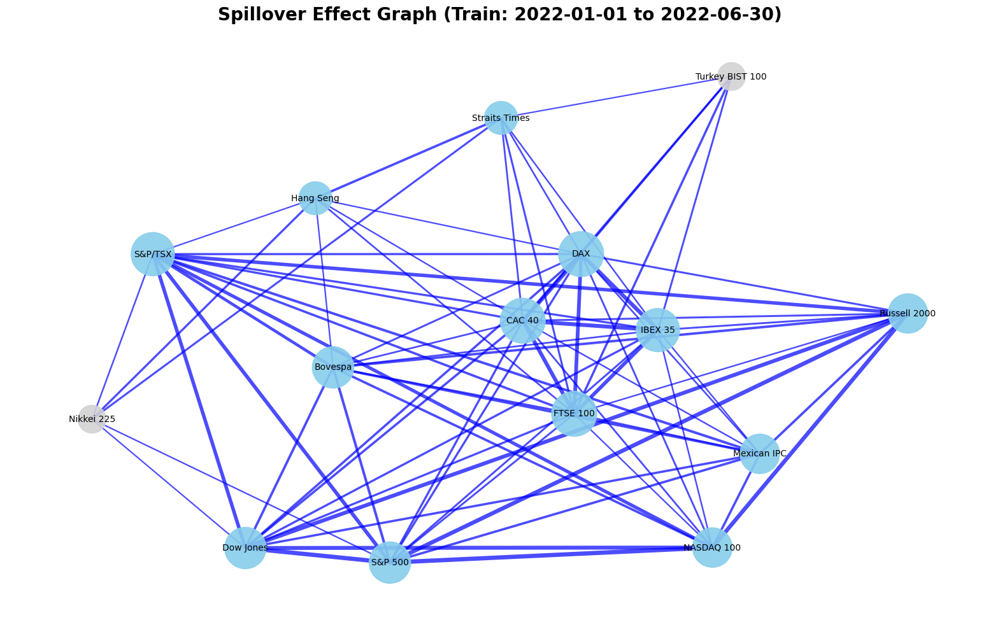

Processing Test 38: Train (2022-07-01 to 2022-12-31), Test (2023-01-01 to 2023-06-30)


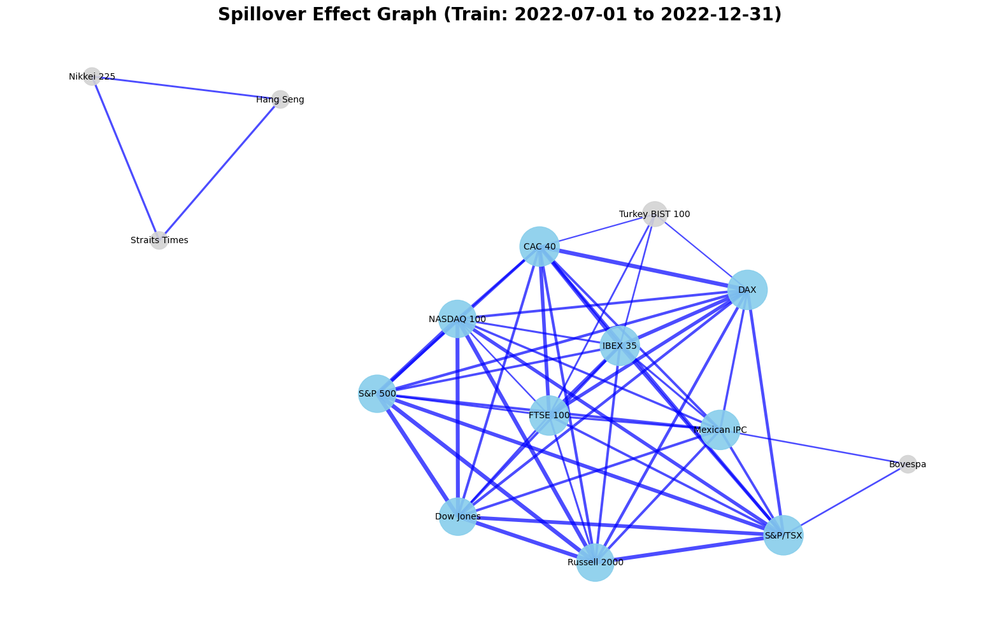

Processing Test 39: Train (2023-01-01 to 2023-06-30), Test (2023-07-01 to 2023-12-31)


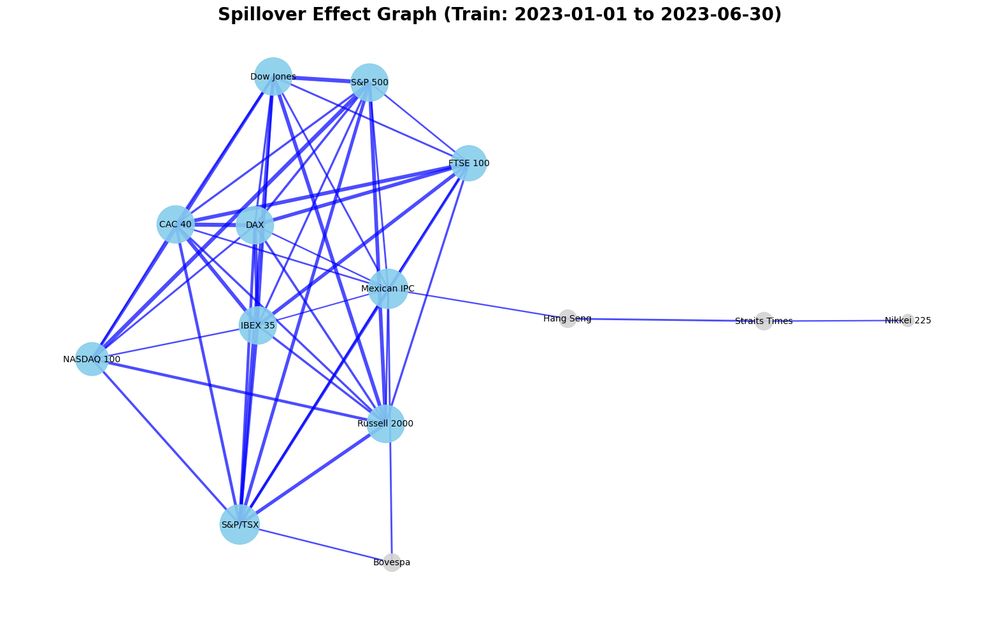

Processing Test 40: Train (2023-07-01 to 2023-12-31), Test (2024-01-01 to 2024-06-30)


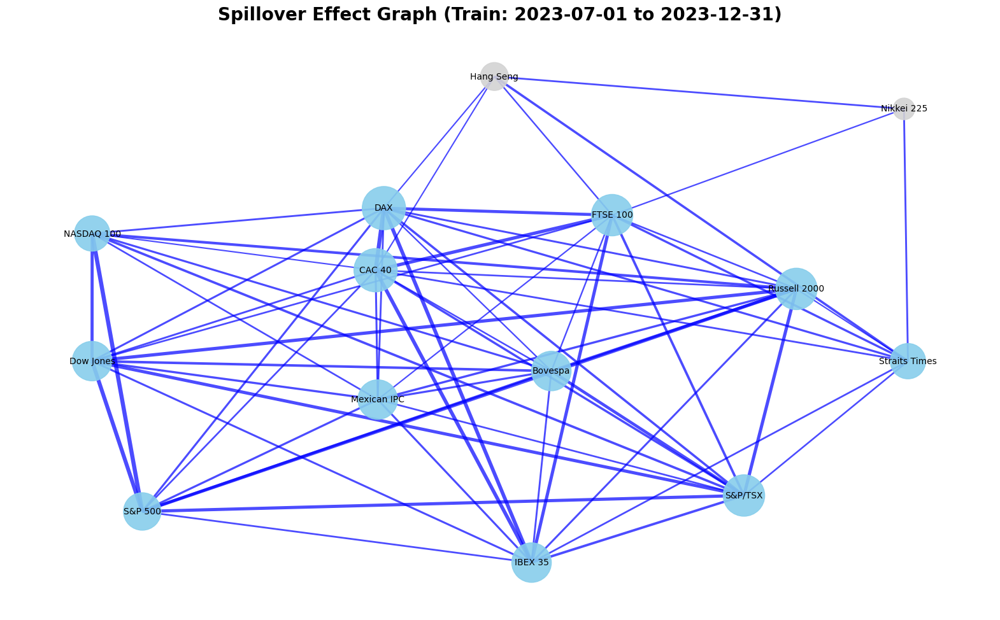

Processing Test 41: Train (2024-01-01 to 2024-06-30), Test (2024-07-01 to 2024-12-31)


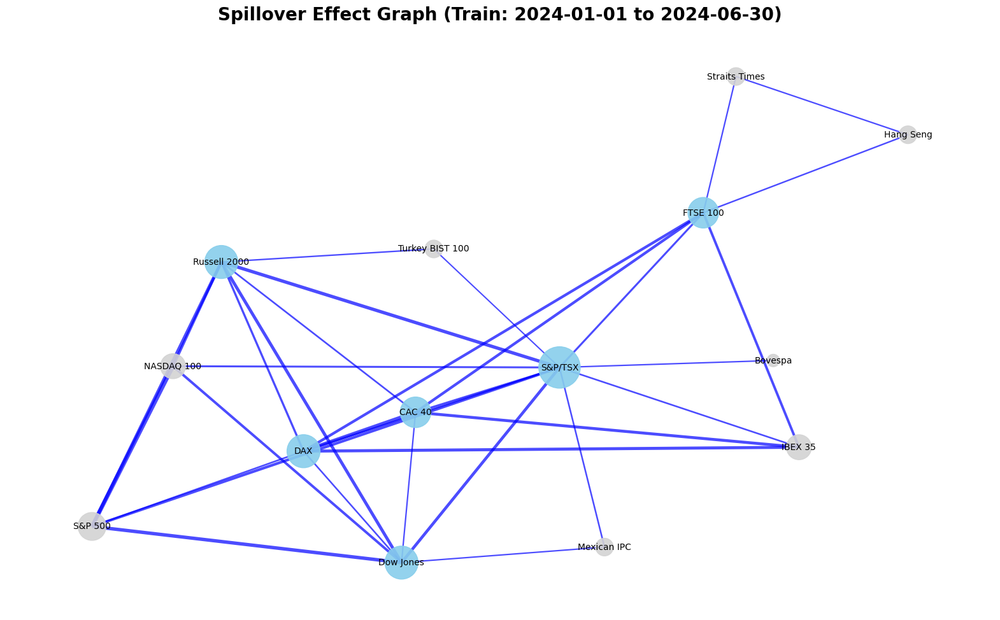

In [7]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd

def create_graph(train_data):
    """
    Create a graph based on the correlation matrix of the train_data.
    """
    correlation_matrix = train_data.corr()
    G = nx.Graph()
    for i in correlation_matrix.columns:
        for j in correlation_matrix.columns:
            if i != j:
                weight = correlation_matrix.loc[i, j]
                if abs(weight) > 0.3:  # correlation threshold
                    G.add_edge(i, j, weight=weight)
    return G

def plot_and_save_graph(G, title, filename):
    """
    Plot the graph using networkx and matplotlib, and save it to a file.
    """
    plt.figure(figsize=(20, 12))
    pos = nx.kamada_kawai_layout(G)
    weights = nx.get_edge_attributes(G, 'weight')
    edge_colors = ['blue' if w > 0 else 'red' for w in weights.values()]
    edge_widths = [abs(w) * 5 for w in weights.values()]  # 상관계수에 비례
    node_sizes = [len(list(G.neighbors(node))) * 200 for node in G.nodes()]
    node_colors = ['skyblue' if len(list(G.neighbors(node))) > 5 else 'lightgray' for node in G.nodes()]

    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=node_colors, alpha=0.9)
    nx.draw_networkx_edges(G, pos, edgelist=weights.keys(), edge_color=edge_colors, width=edge_widths, alpha=0.7)
    nx.draw_networkx_labels(G, pos, font_size=10, font_color='black')

    plt.title(title, fontsize=20, fontweight='bold')
    plt.axis('off')
    plt.savefig(filename, format='png', bbox_inches='tight')
    plt.close()

# Process each test period
for i, (train_start, train_end, test_start, test_end) in enumerate(test_periods):
    print(f"Processing Test {i + 1}: Train ({train_start} to {train_end}), Test ({test_start} to {test_end})")
    
    # Split data into Train and Test
    train_data = returns.loc[train_start:train_end]
    
    # Create graph based on Train data
    G = create_graph(train_data)
    
    # Save the graph with a unique filename
    filename = f"graph_clf_test{i + 1}.png"
    title = f"Spillover Effect Graph (Train: {train_start} to {train_end})"
    plot_and_save_graph(G, title, filename)

print("All graphs have been saved.")


### **4. 기본 데이터를 Tabular Form으로 활용했을 때 성능 평가**

In [8]:
# Pearson Correlation 기반 그래프 생성 함수
n_experiments = 30

def create_correlation_graph(data, threshold=0.3):
    correlation_matrix = data.corr()
    G = nx.Graph()
    for i in correlation_matrix.columns:
        for j in correlation_matrix.columns:
            if i != j:
                weight = correlation_matrix.loc[i, j]
                if abs(weight) > threshold:
                    G.add_edge(i, j, weight=weight)
    return G

def prepare_time_series_data(data_matrix):
    X = data_matrix.iloc[:-1].values
    y = data_matrix.iloc[1:].values
    return X, y

#### 4.1 Random Forest Model 사용

In [9]:
# Initialize Results
final_results = []

for test_id, (train_start, train_end, test_start, test_end) in enumerate(test_periods):
    print(f"Processing Test {test_id + 1}: Train ({train_start} to {train_end}), Test ({test_start} to {test_end})")
    
    # Filter data based on Train/Test periods
    train_data = returns.loc[train_start:train_end]
    test_data = returns.loc[test_start:test_end]
    
    # Create Graph from Train Data
    G = create_correlation_graph(train_data)
    nodes_in_graph = list(G.nodes)
    print(f"Selected Nodes for Test {test_id + 1}: {len(nodes_in_graph)} nodes")

    # Filter nodes for Train/Test data
    filtered_train = train_data[nodes_in_graph]
    filtered_test = test_data[nodes_in_graph]
    
    # Extract features and targets
    X_train = filtered_train.iloc[:-1].values  # Features from Train data
    y_train_set = filtered_train.iloc[1:].values  # Targets for Train data
    X_test = filtered_test.iloc[:-1].values  # Features from Test data
    y_test_set = filtered_test.iloc[1:].values  # Targets for Test data
    
    # Get index names
    index_names = filtered_train.columns.tolist()
    n_indices = len(index_names)

    # Results for current Test
    test_results = []

    for target_idx in tqdm(range(n_indices), desc=f"Target Progress (Test {test_id + 1})"):
        accuracy_scores = []
        f1_scores = []
        confusion_matrices = []

        for _ in range(n_experiments):  # Repeat 30 times for each target
            # Prepare X and y for current target
            y_train = (y_train_set[:, target_idx] > 0).astype(int)
            y_test = (y_test_set[:, target_idx] > 0).astype(int)

            random_seed = np.random.randint(0,10000)

            # Train Gradient Boosting Classifier
            clf = RandomForestClassifier(n_estimators=100, max_depth=None, min_samples_split=5, min_samples_leaf=3, random_state=random_seed)
            clf.fit(X_train, y_train)

            # Predict and evaluate
            y_pred = clf.predict(X_test)
            acc = balanced_accuracy_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred, average='macro')
            cm = confusion_matrix(y_test, y_pred, labels=[1, 0])

            # Collect results
            accuracy_scores.append(acc)
            f1_scores.append(f1)
            confusion_matrices.append(cm)

        # Aggregate results for current target
        avg_accuracy = np.mean(accuracy_scores)
        avg_f1 = np.mean(f1_scores)
        cm_total = np.sum(confusion_matrices, axis=0)

        test_results.append({
            'Test ID': test_id + 1,
            'Target Index': index_names[target_idx],
            'True Positive (TT)': cm_total[0, 0],
            'False Positive (TF)': cm_total[0, 1],
            'False Negative (FT)': cm_total[1, 0],
            'True Negative (FF)': cm_total[1, 1],
            'Accuracy': avg_accuracy,
            'F1 Score': avg_f1
        })

    # Append Test Results
    final_results.extend(test_results)

# Convert final results to DataFrame
results_df_rf_time_based = pd.DataFrame(final_results)

# Display results
print("Final Results with Time-Based Split:")
results_df_rf_time_based


Processing Test 1: Train (2004-01-01 to 2004-06-30), Test (2004-07-01 to 2004-12-31)
Selected Nodes for Test 1: 15 nodes


Target Progress (Test 1): 100%|██████████| 15/15 [00:16<00:00,  1.08s/it]


Processing Test 2: Train (2004-07-01 to 2004-12-31), Test (2005-01-01 to 2005-06-30)
Selected Nodes for Test 2: 14 nodes


Target Progress (Test 2): 100%|██████████| 14/14 [00:15<00:00,  1.08s/it]


Processing Test 3: Train (2005-01-01 to 2005-06-30), Test (2005-07-01 to 2005-12-31)
Selected Nodes for Test 3: 15 nodes


Target Progress (Test 3): 100%|██████████| 15/15 [00:16<00:00,  1.08s/it]


Processing Test 4: Train (2005-07-01 to 2005-12-31), Test (2006-01-01 to 2006-06-30)
Selected Nodes for Test 4: 15 nodes


Target Progress (Test 4): 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Processing Test 5: Train (2006-01-01 to 2006-06-30), Test (2006-07-01 to 2006-12-31)
Selected Nodes for Test 5: 15 nodes


Target Progress (Test 5): 100%|██████████| 15/15 [00:16<00:00,  1.08s/it]


Processing Test 6: Train (2006-07-01 to 2006-12-31), Test (2007-01-01 to 2007-06-30)
Selected Nodes for Test 6: 15 nodes


Target Progress (Test 6): 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Processing Test 7: Train (2007-01-01 to 2007-06-30), Test (2007-07-01 to 2007-12-31)
Selected Nodes for Test 7: 15 nodes


Target Progress (Test 7): 100%|██████████| 15/15 [00:16<00:00,  1.12s/it]


Processing Test 8: Train (2007-07-01 to 2007-12-31), Test (2008-01-01 to 2008-06-30)
Selected Nodes for Test 8: 15 nodes


Target Progress (Test 8): 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Processing Test 9: Train (2008-01-01 to 2008-06-30), Test (2008-07-01 to 2008-12-31)
Selected Nodes for Test 9: 15 nodes


Target Progress (Test 9): 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Processing Test 10: Train (2008-07-01 to 2008-12-31), Test (2009-01-01 to 2009-06-30)
Selected Nodes for Test 10: 15 nodes


Target Progress (Test 10): 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Processing Test 11: Train (2009-01-01 to 2009-06-30), Test (2009-07-01 to 2009-12-31)
Selected Nodes for Test 11: 15 nodes


Target Progress (Test 11): 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Processing Test 12: Train (2009-07-01 to 2009-12-31), Test (2010-01-01 to 2010-06-30)
Selected Nodes for Test 12: 15 nodes


Target Progress (Test 12): 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Processing Test 13: Train (2010-01-01 to 2010-06-30), Test (2010-07-01 to 2010-12-31)
Selected Nodes for Test 13: 15 nodes


Target Progress (Test 13): 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Processing Test 14: Train (2010-07-01 to 2010-12-31), Test (2011-01-01 to 2011-06-30)
Selected Nodes for Test 14: 15 nodes


Target Progress (Test 14): 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Processing Test 15: Train (2011-01-01 to 2011-06-30), Test (2011-07-01 to 2011-12-31)
Selected Nodes for Test 15: 15 nodes


Target Progress (Test 15): 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Processing Test 16: Train (2011-07-01 to 2011-12-31), Test (2012-01-01 to 2012-06-30)
Selected Nodes for Test 16: 15 nodes


Target Progress (Test 16): 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Processing Test 17: Train (2012-01-01 to 2012-06-30), Test (2012-07-01 to 2012-12-31)
Selected Nodes for Test 17: 15 nodes


Target Progress (Test 17): 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Processing Test 18: Train (2012-07-01 to 2012-12-31), Test (2013-01-01 to 2013-06-30)
Selected Nodes for Test 18: 15 nodes


Target Progress (Test 18): 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Processing Test 19: Train (2013-01-01 to 2013-06-30), Test (2013-07-01 to 2013-12-31)
Selected Nodes for Test 19: 15 nodes


Target Progress (Test 19): 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Processing Test 20: Train (2013-07-01 to 2013-12-31), Test (2014-01-01 to 2014-06-30)
Selected Nodes for Test 20: 15 nodes


Target Progress (Test 20): 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Processing Test 21: Train (2014-01-01 to 2014-06-30), Test (2014-07-01 to 2014-12-31)
Selected Nodes for Test 21: 15 nodes


Target Progress (Test 21): 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Processing Test 22: Train (2014-07-01 to 2014-12-31), Test (2015-01-01 to 2015-06-30)
Selected Nodes for Test 22: 14 nodes


Target Progress (Test 22): 100%|██████████| 14/14 [00:15<00:00,  1.11s/it]


Processing Test 23: Train (2015-01-01 to 2015-06-30), Test (2015-07-01 to 2015-12-31)
Selected Nodes for Test 23: 15 nodes


Target Progress (Test 23): 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Processing Test 24: Train (2015-07-01 to 2015-12-31), Test (2016-01-01 to 2016-06-30)
Selected Nodes for Test 24: 15 nodes


Target Progress (Test 24): 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Processing Test 25: Train (2016-01-01 to 2016-06-30), Test (2016-07-01 to 2016-12-31)
Selected Nodes for Test 25: 15 nodes


Target Progress (Test 25): 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Processing Test 26: Train (2016-07-01 to 2016-12-31), Test (2017-01-01 to 2017-06-30)
Selected Nodes for Test 26: 15 nodes


Target Progress (Test 26): 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Processing Test 27: Train (2017-01-01 to 2017-06-30), Test (2017-07-01 to 2017-12-31)
Selected Nodes for Test 27: 14 nodes


Target Progress (Test 27): 100%|██████████| 14/14 [00:15<00:00,  1.10s/it]


Processing Test 28: Train (2017-07-01 to 2017-12-31), Test (2018-01-01 to 2018-06-30)
Selected Nodes for Test 28: 13 nodes


Target Progress (Test 28): 100%|██████████| 13/13 [00:14<00:00,  1.10s/it]


Processing Test 29: Train (2018-01-01 to 2018-06-30), Test (2018-07-01 to 2018-12-31)
Selected Nodes for Test 29: 14 nodes


Target Progress (Test 29): 100%|██████████| 14/14 [00:15<00:00,  1.09s/it]


Processing Test 30: Train (2018-07-01 to 2018-12-31), Test (2019-01-01 to 2019-06-30)
Selected Nodes for Test 30: 15 nodes


Target Progress (Test 30): 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Processing Test 31: Train (2019-01-01 to 2019-06-30), Test (2019-07-01 to 2019-12-31)
Selected Nodes for Test 31: 15 nodes


Target Progress (Test 31): 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Processing Test 32: Train (2019-07-01 to 2019-12-31), Test (2020-01-01 to 2020-06-30)
Selected Nodes for Test 32: 14 nodes


Target Progress (Test 32): 100%|██████████| 14/14 [00:15<00:00,  1.10s/it]


Processing Test 33: Train (2020-01-01 to 2020-06-30), Test (2020-07-01 to 2020-12-31)
Selected Nodes for Test 33: 15 nodes


Target Progress (Test 33): 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Processing Test 34: Train (2020-07-01 to 2020-12-31), Test (2021-01-01 to 2021-06-30)
Selected Nodes for Test 34: 14 nodes


Target Progress (Test 34): 100%|██████████| 14/14 [00:15<00:00,  1.10s/it]


Processing Test 35: Train (2021-01-01 to 2021-06-30), Test (2021-07-01 to 2021-12-31)
Selected Nodes for Test 35: 15 nodes


Target Progress (Test 35): 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Processing Test 36: Train (2021-07-01 to 2021-12-31), Test (2022-01-01 to 2022-06-30)
Selected Nodes for Test 36: 14 nodes


Target Progress (Test 36): 100%|██████████| 14/14 [00:15<00:00,  1.09s/it]


Processing Test 37: Train (2022-01-01 to 2022-06-30), Test (2022-07-01 to 2022-12-31)
Selected Nodes for Test 37: 15 nodes


Target Progress (Test 37): 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Processing Test 38: Train (2022-07-01 to 2022-12-31), Test (2023-01-01 to 2023-06-30)
Selected Nodes for Test 38: 15 nodes


Target Progress (Test 38): 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Processing Test 39: Train (2023-01-01 to 2023-06-30), Test (2023-07-01 to 2023-12-31)
Selected Nodes for Test 39: 14 nodes


Target Progress (Test 39): 100%|██████████| 14/14 [00:15<00:00,  1.09s/it]


Processing Test 40: Train (2023-07-01 to 2023-12-31), Test (2024-01-01 to 2024-06-30)
Selected Nodes for Test 40: 14 nodes


Target Progress (Test 40): 100%|██████████| 14/14 [00:15<00:00,  1.10s/it]


Processing Test 41: Train (2024-01-01 to 2024-06-30), Test (2024-07-01 to 2024-12-31)
Selected Nodes for Test 41: 14 nodes


Target Progress (Test 41): 100%|██████████| 14/14 [00:15<00:00,  1.10s/it]

Final Results with Time-Based Split:


,Test ID,Target Index,True Positive (TT),False Positive (TF),False Negative (FT),True Negative (FF),Accuracy,F1 Score
0,1,Turkey BIST 100,1238,952,839,781,0.523698,0.522293
1,1,Hang Seng,722,1048,590,1450,0.559347,0.553672
2,1,Straits Times,1101,879,830,1000,0.551254,0.550857
3,1,Mexican IPC,1844,436,1114,416,0.540334,0.526410
4,1,FTSE 100,1313,907,691,899,0.578425,0.575274
...,...,...,...,...,...,...,...,...
598,41,DAX,1300,560,1316,604,0.506754,0.485775
599,41,Mexican IPC,775,845,1110,1050,0.482253,0.479610
600,41,IBEX 35,1228,902,626,1024,0.598566,0.594199
601,41,CAC 40,1205,685,1258,632,0.485979,0.473685


#### 4.2 Gradient Boost Classifier (XGBoost) Model 사용

In [10]:
# Initialize Results
final_results = []

for test_id, (train_start, train_end, test_start, test_end) in enumerate(test_periods):
    print(f"Processing Test {test_id + 1}: Train ({train_start} to {train_end}), Test ({test_start} to {test_end})")
    
    # Filter data based on Train/Test periods
    train_data = returns.loc[train_start:train_end]
    test_data = returns.loc[test_start:test_end]
    
    # Create Graph from Train Data
    G = create_correlation_graph(train_data)
    nodes_in_graph = list(G.nodes)
    print(f"Selected Nodes for Test {test_id + 1}: {len(nodes_in_graph)} nodes")

    # Filter nodes for Train/Test data
    filtered_train = train_data[nodes_in_graph]
    filtered_test = test_data[nodes_in_graph]
    
    # Extract features and targets
    X_train = filtered_train.iloc[:-1].values  # Features from Train data
    y_train_set = filtered_train.iloc[1:].values  # Targets for Train data
    X_test = filtered_test.iloc[:-1].values  # Features from Test data
    y_test_set = filtered_test.iloc[1:].values  # Targets for Test data
    
    # Get index names
    index_names = filtered_train.columns.tolist()
    n_indices = len(index_names)

    # Results for current Test
    test_results = []

    for target_idx in tqdm(range(n_indices), desc=f"Target Progress (Test {test_id + 1})"):
        accuracy_scores = []
        f1_scores = []
        confusion_matrices = []

        for _ in range(n_experiments):  # Repeat 30 times for each target
            # Prepare X and y for current target
            y_train = (y_train_set[:, target_idx] > 0).astype(int)
            y_test = (y_test_set[:, target_idx] > 0).astype(int)

            random_seed = np.random.randint(0,10000)
            
            # Train Gradient Boosting Classifier
            clf = GradientBoostingClassifier(n_estimators=100, min_samples_split=5, min_samples_leaf=3, random_state=random_seed)
            clf.fit(X_train, y_train)

            # Predict and evaluate
            y_pred = clf.predict(X_test)
            acc = balanced_accuracy_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred, average='macro')
            cm = confusion_matrix(y_test, y_pred, labels=[1, 0])

            # Collect results
            accuracy_scores.append(acc)
            f1_scores.append(f1)
            confusion_matrices.append(cm)

        # Aggregate results for current target
        avg_accuracy = np.mean(accuracy_scores)
        avg_f1 = np.mean(f1_scores)
        cm_total = np.sum(confusion_matrices, axis=0)

        test_results.append({
            'Test ID': test_id + 1,
            'Target Index': index_names[target_idx],
            'True Positive (TT)': cm_total[0, 0],
            'False Positive (TF)': cm_total[0, 1],
            'False Negative (FT)': cm_total[1, 0],
            'True Negative (FF)': cm_total[1, 1],
            'Accuracy': avg_accuracy,
            'F1 Score': avg_f1
        })

    # Append Test Results
    final_results.extend(test_results)

# Convert final results to DataFrame
results_df_gbc_time_based = pd.DataFrame(final_results)

# Display results
print("Final Results with Time-Based Split:")
results_df_gbc_time_based


Processing Test 1: Train (2004-01-01 to 2004-06-30), Test (2004-07-01 to 2004-12-31)
Selected Nodes for Test 1: 15 nodes


Target Progress (Test 1): 100%|██████████| 15/15 [00:14<00:00,  1.06it/s]


Processing Test 2: Train (2004-07-01 to 2004-12-31), Test (2005-01-01 to 2005-06-30)
Selected Nodes for Test 2: 14 nodes


Target Progress (Test 2): 100%|██████████| 14/14 [00:13<00:00,  1.07it/s]


Processing Test 3: Train (2005-01-01 to 2005-06-30), Test (2005-07-01 to 2005-12-31)
Selected Nodes for Test 3: 15 nodes


Target Progress (Test 3): 100%|██████████| 15/15 [00:14<00:00,  1.06it/s]


Processing Test 4: Train (2005-07-01 to 2005-12-31), Test (2006-01-01 to 2006-06-30)
Selected Nodes for Test 4: 15 nodes


Target Progress (Test 4): 100%|██████████| 15/15 [00:14<00:00,  1.04it/s]


Processing Test 5: Train (2006-01-01 to 2006-06-30), Test (2006-07-01 to 2006-12-31)
Selected Nodes for Test 5: 15 nodes


Target Progress (Test 5): 100%|██████████| 15/15 [00:14<00:00,  1.06it/s]


Processing Test 6: Train (2006-07-01 to 2006-12-31), Test (2007-01-01 to 2007-06-30)
Selected Nodes for Test 6: 15 nodes


Target Progress (Test 6): 100%|██████████| 15/15 [00:14<00:00,  1.05it/s]


Processing Test 7: Train (2007-01-01 to 2007-06-30), Test (2007-07-01 to 2007-12-31)
Selected Nodes for Test 7: 15 nodes


Target Progress (Test 7): 100%|██████████| 15/15 [00:14<00:00,  1.07it/s]


Processing Test 8: Train (2007-07-01 to 2007-12-31), Test (2008-01-01 to 2008-06-30)
Selected Nodes for Test 8: 15 nodes


Target Progress (Test 8): 100%|██████████| 15/15 [00:14<00:00,  1.05it/s]


Processing Test 9: Train (2008-01-01 to 2008-06-30), Test (2008-07-01 to 2008-12-31)
Selected Nodes for Test 9: 15 nodes


Target Progress (Test 9): 100%|██████████| 15/15 [00:14<00:00,  1.05it/s]


Processing Test 10: Train (2008-07-01 to 2008-12-31), Test (2009-01-01 to 2009-06-30)
Selected Nodes for Test 10: 15 nodes


Target Progress (Test 10): 100%|██████████| 15/15 [00:14<00:00,  1.05it/s]


Processing Test 11: Train (2009-01-01 to 2009-06-30), Test (2009-07-01 to 2009-12-31)
Selected Nodes for Test 11: 15 nodes


Target Progress (Test 11): 100%|██████████| 15/15 [00:13<00:00,  1.07it/s]


Processing Test 12: Train (2009-07-01 to 2009-12-31), Test (2010-01-01 to 2010-06-30)
Selected Nodes for Test 12: 15 nodes


Target Progress (Test 12): 100%|██████████| 15/15 [00:14<00:00,  1.05it/s]


Processing Test 13: Train (2010-01-01 to 2010-06-30), Test (2010-07-01 to 2010-12-31)
Selected Nodes for Test 13: 15 nodes


Target Progress (Test 13): 100%|██████████| 15/15 [00:14<00:00,  1.07it/s]


Processing Test 14: Train (2010-07-01 to 2010-12-31), Test (2011-01-01 to 2011-06-30)
Selected Nodes for Test 14: 15 nodes


Target Progress (Test 14): 100%|██████████| 15/15 [00:14<00:00,  1.03it/s]


Processing Test 15: Train (2011-01-01 to 2011-06-30), Test (2011-07-01 to 2011-12-31)
Selected Nodes for Test 15: 15 nodes


Target Progress (Test 15): 100%|██████████| 15/15 [00:14<00:00,  1.06it/s]


Processing Test 16: Train (2011-07-01 to 2011-12-31), Test (2012-01-01 to 2012-06-30)
Selected Nodes for Test 16: 15 nodes


Target Progress (Test 16): 100%|██████████| 15/15 [00:14<00:00,  1.05it/s]


Processing Test 17: Train (2012-01-01 to 2012-06-30), Test (2012-07-01 to 2012-12-31)
Selected Nodes for Test 17: 15 nodes


Target Progress (Test 17): 100%|██████████| 15/15 [00:14<00:00,  1.05it/s]


Processing Test 18: Train (2012-07-01 to 2012-12-31), Test (2013-01-01 to 2013-06-30)
Selected Nodes for Test 18: 15 nodes


Target Progress (Test 18): 100%|██████████| 15/15 [00:14<00:00,  1.05it/s]


Processing Test 19: Train (2013-01-01 to 2013-06-30), Test (2013-07-01 to 2013-12-31)
Selected Nodes for Test 19: 15 nodes


Target Progress (Test 19): 100%|██████████| 15/15 [00:14<00:00,  1.06it/s]


Processing Test 20: Train (2013-07-01 to 2013-12-31), Test (2014-01-01 to 2014-06-30)
Selected Nodes for Test 20: 15 nodes


Target Progress (Test 20): 100%|██████████| 15/15 [00:14<00:00,  1.03it/s]


Processing Test 21: Train (2014-01-01 to 2014-06-30), Test (2014-07-01 to 2014-12-31)
Selected Nodes for Test 21: 15 nodes


Target Progress (Test 21): 100%|██████████| 15/15 [00:14<00:00,  1.06it/s]


Processing Test 22: Train (2014-07-01 to 2014-12-31), Test (2015-01-01 to 2015-06-30)
Selected Nodes for Test 22: 14 nodes


Target Progress (Test 22): 100%|██████████| 14/14 [00:12<00:00,  1.08it/s]


Processing Test 23: Train (2015-01-01 to 2015-06-30), Test (2015-07-01 to 2015-12-31)
Selected Nodes for Test 23: 15 nodes


Target Progress (Test 23): 100%|██████████| 15/15 [00:14<00:00,  1.06it/s]


Processing Test 24: Train (2015-07-01 to 2015-12-31), Test (2016-01-01 to 2016-06-30)
Selected Nodes for Test 24: 15 nodes


Target Progress (Test 24): 100%|██████████| 15/15 [00:14<00:00,  1.04it/s]


Processing Test 25: Train (2016-01-01 to 2016-06-30), Test (2016-07-01 to 2016-12-31)
Selected Nodes for Test 25: 15 nodes


Target Progress (Test 25): 100%|██████████| 15/15 [00:14<00:00,  1.06it/s]


Processing Test 26: Train (2016-07-01 to 2016-12-31), Test (2017-01-01 to 2017-06-30)
Selected Nodes for Test 26: 15 nodes


Target Progress (Test 26): 100%|██████████| 15/15 [00:14<00:00,  1.04it/s]


Processing Test 27: Train (2017-01-01 to 2017-06-30), Test (2017-07-01 to 2017-12-31)
Selected Nodes for Test 27: 14 nodes


Target Progress (Test 27): 100%|██████████| 14/14 [00:12<00:00,  1.09it/s]


Processing Test 28: Train (2017-07-01 to 2017-12-31), Test (2018-01-01 to 2018-06-30)
Selected Nodes for Test 28: 13 nodes


Target Progress (Test 28): 100%|██████████| 13/13 [00:11<00:00,  1.14it/s]


Processing Test 29: Train (2018-01-01 to 2018-06-30), Test (2018-07-01 to 2018-12-31)
Selected Nodes for Test 29: 14 nodes


Target Progress (Test 29): 100%|██████████| 14/14 [00:12<00:00,  1.10it/s]


Processing Test 30: Train (2018-07-01 to 2018-12-31), Test (2019-01-01 to 2019-06-30)
Selected Nodes for Test 30: 15 nodes


Target Progress (Test 30): 100%|██████████| 15/15 [00:14<00:00,  1.05it/s]


Processing Test 31: Train (2019-01-01 to 2019-06-30), Test (2019-07-01 to 2019-12-31)
Selected Nodes for Test 31: 15 nodes


Target Progress (Test 31): 100%|██████████| 15/15 [00:14<00:00,  1.06it/s]


Processing Test 32: Train (2019-07-01 to 2019-12-31), Test (2020-01-01 to 2020-06-30)
Selected Nodes for Test 32: 14 nodes


Target Progress (Test 32): 100%|██████████| 14/14 [00:12<00:00,  1.08it/s]


Processing Test 33: Train (2020-01-01 to 2020-06-30), Test (2020-07-01 to 2020-12-31)
Selected Nodes for Test 33: 15 nodes


Target Progress (Test 33): 100%|██████████| 15/15 [00:14<00:00,  1.07it/s]


Processing Test 34: Train (2020-07-01 to 2020-12-31), Test (2021-01-01 to 2021-06-30)
Selected Nodes for Test 34: 14 nodes


Target Progress (Test 34): 100%|██████████| 14/14 [00:12<00:00,  1.08it/s]


Processing Test 35: Train (2021-01-01 to 2021-06-30), Test (2021-07-01 to 2021-12-31)
Selected Nodes for Test 35: 15 nodes


Target Progress (Test 35): 100%|██████████| 15/15 [00:14<00:00,  1.06it/s]


Processing Test 36: Train (2021-07-01 to 2021-12-31), Test (2022-01-01 to 2022-06-30)
Selected Nodes for Test 36: 14 nodes


Target Progress (Test 36): 100%|██████████| 14/14 [00:13<00:00,  1.07it/s]


Processing Test 37: Train (2022-01-01 to 2022-06-30), Test (2022-07-01 to 2022-12-31)
Selected Nodes for Test 37: 15 nodes


Target Progress (Test 37): 100%|██████████| 15/15 [00:14<00:00,  1.07it/s]


Processing Test 38: Train (2022-07-01 to 2022-12-31), Test (2023-01-01 to 2023-06-30)
Selected Nodes for Test 38: 15 nodes


Target Progress (Test 38): 100%|██████████| 15/15 [00:14<00:00,  1.04it/s]


Processing Test 39: Train (2023-01-01 to 2023-06-30), Test (2023-07-01 to 2023-12-31)
Selected Nodes for Test 39: 14 nodes


Target Progress (Test 39): 100%|██████████| 14/14 [00:12<00:00,  1.11it/s]


Processing Test 40: Train (2023-07-01 to 2023-12-31), Test (2024-01-01 to 2024-06-30)
Selected Nodes for Test 40: 14 nodes


Target Progress (Test 40): 100%|██████████| 14/14 [00:12<00:00,  1.09it/s]


Processing Test 41: Train (2024-01-01 to 2024-06-30), Test (2024-07-01 to 2024-12-31)
Selected Nodes for Test 41: 14 nodes


Target Progress (Test 41): 100%|██████████| 14/14 [00:12<00:00,  1.10it/s]

Final Results with Time-Based Split:


,Test ID,Target Index,True Positive (TT),False Positive (TF),False Negative (FT),True Negative (FF),Accuracy,F1 Score
0,1,Turkey BIST 100,1343,847,898,722,0.529461,0.529290
1,1,Hang Seng,715,1055,738,1302,0.521095,0.517940
2,1,Straits Times,1046,934,853,977,0.531081,0.530492
3,1,Mexican IPC,1427,853,875,655,0.526991,0.526959
4,1,FTSE 100,1181,1039,770,820,0.523853,0.520887
...,...,...,...,...,...,...,...,...
598,41,DAX,1144,716,1245,675,0.483308,0.473076
599,41,Mexican IPC,803,817,1116,1044,0.489506,0.486525
600,41,IBEX 35,1043,1087,623,1027,0.556048,0.547455
601,41,CAC 40,1196,694,1142,748,0.514286,0.507354


#### 4.3. Multi-Layer Perceptron Model 사용

In [11]:
# Initialize Results
final_results = []

for test_id, (train_start, train_end, test_start, test_end) in enumerate(test_periods):
    print(f"Processing Test {test_id + 1}: Train ({train_start} to {train_end}), Test ({test_start} to {test_end})")
    
    # Filter data based on Train/Test periods
    train_data = returns.loc[train_start:train_end]
    test_data = returns.loc[test_start:test_end]
    
    # Create Graph from Train Data
    G = create_correlation_graph(train_data)
    nodes_in_graph = list(G.nodes)
    print(f"Selected Nodes for Test {test_id + 1}: {len(nodes_in_graph)} nodes")

    # Filter nodes for Train/Test data
    filtered_train = train_data[nodes_in_graph]
    filtered_test = test_data[nodes_in_graph]
    
    # Extract features and targets
    X_train = filtered_train.iloc[:-1].values  # Features from Train data
    y_train_set = filtered_train.iloc[1:].values  # Targets for Train data
    X_test = filtered_test.iloc[:-1].values  # Features from Test data
    y_test_set = filtered_test.iloc[1:].values  # Targets for Test data
    
    # Get index names
    index_names = filtered_train.columns.tolist()
    n_indices = len(index_names)

    # Results for current Test
    test_results = []

    for target_idx in tqdm(range(n_indices), desc=f"Target Progress (Test {test_id + 1})"):
        accuracy_scores = []
        f1_scores = []
        confusion_matrices = []

        for _ in range(n_experiments):  # Repeat 30 times for each target
            # Prepare X and y for current target
            y_train = (y_train_set[:, target_idx] > 0).astype(int)
            y_test = (y_test_set[:, target_idx] > 0).astype(int)

            random_seed = np.random.randint(0,10000)

            # Train Gradient Boosting Classifier
            clf = MLPClassifier(hidden_layer_sizes=(100,), max_iter=2000, activation='relu', learning_rate_init=0.001, 
                                early_stopping=True, random_state=random_seed)
            clf.fit(X_train, y_train)

            # Predict and evaluate
            y_pred = clf.predict(X_test)
            acc = balanced_accuracy_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred, average='macro')
            cm = confusion_matrix(y_test, y_pred, labels=[1, 0])

            # Collect results
            accuracy_scores.append(acc)
            f1_scores.append(f1)
            confusion_matrices.append(cm)

        # Aggregate results for current target
        avg_accuracy = np.mean(accuracy_scores)
        avg_f1 = np.mean(f1_scores)
        cm_total = np.sum(confusion_matrices, axis=0)

        test_results.append({
            'Test ID': test_id + 1,
            'Target Index': index_names[target_idx],
            'True Positive (TT)': cm_total[0, 0],
            'False Positive (TF)': cm_total[0, 1],
            'False Negative (FT)': cm_total[1, 0],
            'True Negative (FF)': cm_total[1, 1],
            'Accuracy': avg_accuracy,
            'F1 Score': avg_f1
        })

    # Append Test Results
    final_results.extend(test_results)

# Convert final results to DataFrame
results_df_mlp_time_based = pd.DataFrame(final_results)

# Display results
print("Final Results with Time-Based Split:")
results_df_mlp_time_based


Processing Test 1: Train (2004-01-01 to 2004-06-30), Test (2004-07-01 to 2004-12-31)
Selected Nodes for Test 1: 15 nodes


Target Progress (Test 1): 100%|██████████| 15/15 [00:03<00:00,  4.49it/s]


Processing Test 2: Train (2004-07-01 to 2004-12-31), Test (2005-01-01 to 2005-06-30)
Selected Nodes for Test 2: 14 nodes


Target Progress (Test 2): 100%|██████████| 14/14 [00:03<00:00,  3.69it/s]


Processing Test 3: Train (2005-01-01 to 2005-06-30), Test (2005-07-01 to 2005-12-31)
Selected Nodes for Test 3: 15 nodes


Target Progress (Test 3): 100%|██████████| 15/15 [00:05<00:00,  2.82it/s]


Processing Test 4: Train (2005-07-01 to 2005-12-31), Test (2006-01-01 to 2006-06-30)
Selected Nodes for Test 4: 15 nodes


Target Progress (Test 4): 100%|██████████| 15/15 [00:04<00:00,  3.50it/s]


Processing Test 5: Train (2006-01-01 to 2006-06-30), Test (2006-07-01 to 2006-12-31)
Selected Nodes for Test 5: 15 nodes


Target Progress (Test 5): 100%|██████████| 15/15 [00:04<00:00,  3.47it/s]


Processing Test 6: Train (2006-07-01 to 2006-12-31), Test (2007-01-01 to 2007-06-30)
Selected Nodes for Test 6: 15 nodes


Target Progress (Test 6): 100%|██████████| 15/15 [00:04<00:00,  3.48it/s]


Processing Test 7: Train (2007-01-01 to 2007-06-30), Test (2007-07-01 to 2007-12-31)
Selected Nodes for Test 7: 15 nodes


Target Progress (Test 7): 100%|██████████| 15/15 [00:04<00:00,  3.37it/s]


Processing Test 8: Train (2007-07-01 to 2007-12-31), Test (2008-01-01 to 2008-06-30)
Selected Nodes for Test 8: 15 nodes


Target Progress (Test 8): 100%|██████████| 15/15 [00:04<00:00,  3.29it/s]


Processing Test 9: Train (2008-01-01 to 2008-06-30), Test (2008-07-01 to 2008-12-31)
Selected Nodes for Test 9: 15 nodes


Target Progress (Test 9): 100%|██████████| 15/15 [00:03<00:00,  4.67it/s]


Processing Test 10: Train (2008-07-01 to 2008-12-31), Test (2009-01-01 to 2009-06-30)
Selected Nodes for Test 10: 15 nodes


Target Progress (Test 10): 100%|██████████| 15/15 [00:03<00:00,  4.41it/s]


Processing Test 11: Train (2009-01-01 to 2009-06-30), Test (2009-07-01 to 2009-12-31)
Selected Nodes for Test 11: 15 nodes


Target Progress (Test 11): 100%|██████████| 15/15 [00:03<00:00,  4.13it/s]


Processing Test 12: Train (2009-07-01 to 2009-12-31), Test (2010-01-01 to 2010-06-30)
Selected Nodes for Test 12: 15 nodes


Target Progress (Test 12): 100%|██████████| 15/15 [00:03<00:00,  4.40it/s]


Processing Test 13: Train (2010-01-01 to 2010-06-30), Test (2010-07-01 to 2010-12-31)
Selected Nodes for Test 13: 15 nodes


Target Progress (Test 13): 100%|██████████| 15/15 [00:03<00:00,  4.42it/s]


Processing Test 14: Train (2010-07-01 to 2010-12-31), Test (2011-01-01 to 2011-06-30)
Selected Nodes for Test 14: 15 nodes


Target Progress (Test 14): 100%|██████████| 15/15 [00:03<00:00,  4.68it/s]


Processing Test 15: Train (2011-01-01 to 2011-06-30), Test (2011-07-01 to 2011-12-31)
Selected Nodes for Test 15: 15 nodes


Target Progress (Test 15): 100%|██████████| 15/15 [00:03<00:00,  4.62it/s]


Processing Test 16: Train (2011-07-01 to 2011-12-31), Test (2012-01-01 to 2012-06-30)
Selected Nodes for Test 16: 15 nodes


Target Progress (Test 16): 100%|██████████| 15/15 [00:03<00:00,  4.68it/s]


Processing Test 17: Train (2012-01-01 to 2012-06-30), Test (2012-07-01 to 2012-12-31)
Selected Nodes for Test 17: 15 nodes


Target Progress (Test 17): 100%|██████████| 15/15 [00:03<00:00,  4.39it/s]


Processing Test 18: Train (2012-07-01 to 2012-12-31), Test (2013-01-01 to 2013-06-30)
Selected Nodes for Test 18: 15 nodes


Target Progress (Test 18): 100%|██████████| 15/15 [00:03<00:00,  4.67it/s]


Processing Test 19: Train (2013-01-01 to 2013-06-30), Test (2013-07-01 to 2013-12-31)
Selected Nodes for Test 19: 15 nodes


Target Progress (Test 19): 100%|██████████| 15/15 [00:03<00:00,  4.57it/s]


Processing Test 20: Train (2013-07-01 to 2013-12-31), Test (2014-01-01 to 2014-06-30)
Selected Nodes for Test 20: 15 nodes


Target Progress (Test 20): 100%|██████████| 15/15 [00:03<00:00,  4.50it/s]


Processing Test 21: Train (2014-01-01 to 2014-06-30), Test (2014-07-01 to 2014-12-31)
Selected Nodes for Test 21: 15 nodes


Target Progress (Test 21): 100%|██████████| 15/15 [00:03<00:00,  4.51it/s]


Processing Test 22: Train (2014-07-01 to 2014-12-31), Test (2015-01-01 to 2015-06-30)
Selected Nodes for Test 22: 14 nodes


Target Progress (Test 22): 100%|██████████| 14/14 [00:03<00:00,  4.58it/s]


Processing Test 23: Train (2015-01-01 to 2015-06-30), Test (2015-07-01 to 2015-12-31)
Selected Nodes for Test 23: 15 nodes


Target Progress (Test 23): 100%|██████████| 15/15 [00:03<00:00,  4.57it/s]


Processing Test 24: Train (2015-07-01 to 2015-12-31), Test (2016-01-01 to 2016-06-30)
Selected Nodes for Test 24: 15 nodes


Target Progress (Test 24): 100%|██████████| 15/15 [00:03<00:00,  4.67it/s]


Processing Test 25: Train (2016-01-01 to 2016-06-30), Test (2016-07-01 to 2016-12-31)
Selected Nodes for Test 25: 15 nodes


Target Progress (Test 25): 100%|██████████| 15/15 [00:03<00:00,  4.35it/s]


Processing Test 26: Train (2016-07-01 to 2016-12-31), Test (2017-01-01 to 2017-06-30)
Selected Nodes for Test 26: 15 nodes


Target Progress (Test 26): 100%|██████████| 15/15 [00:03<00:00,  4.78it/s]


Processing Test 27: Train (2017-01-01 to 2017-06-30), Test (2017-07-01 to 2017-12-31)
Selected Nodes for Test 27: 14 nodes


Target Progress (Test 27): 100%|██████████| 14/14 [00:03<00:00,  4.63it/s]


Processing Test 28: Train (2017-07-01 to 2017-12-31), Test (2018-01-01 to 2018-06-30)
Selected Nodes for Test 28: 13 nodes


Target Progress (Test 28): 100%|██████████| 13/13 [00:02<00:00,  4.67it/s]


Processing Test 29: Train (2018-01-01 to 2018-06-30), Test (2018-07-01 to 2018-12-31)
Selected Nodes for Test 29: 14 nodes


Target Progress (Test 29): 100%|██████████| 14/14 [00:03<00:00,  4.48it/s]


Processing Test 30: Train (2018-07-01 to 2018-12-31), Test (2019-01-01 to 2019-06-30)
Selected Nodes for Test 30: 15 nodes


Target Progress (Test 30): 100%|██████████| 15/15 [00:03<00:00,  4.48it/s]


Processing Test 31: Train (2019-01-01 to 2019-06-30), Test (2019-07-01 to 2019-12-31)
Selected Nodes for Test 31: 15 nodes


Target Progress (Test 31): 100%|██████████| 15/15 [00:03<00:00,  4.61it/s]


Processing Test 32: Train (2019-07-01 to 2019-12-31), Test (2020-01-01 to 2020-06-30)
Selected Nodes for Test 32: 14 nodes


Target Progress (Test 32): 100%|██████████| 14/14 [00:03<00:00,  4.50it/s]


Processing Test 33: Train (2020-01-01 to 2020-06-30), Test (2020-07-01 to 2020-12-31)
Selected Nodes for Test 33: 15 nodes


Target Progress (Test 33): 100%|██████████| 15/15 [00:03<00:00,  4.42it/s]


Processing Test 34: Train (2020-07-01 to 2020-12-31), Test (2021-01-01 to 2021-06-30)
Selected Nodes for Test 34: 14 nodes


Target Progress (Test 34): 100%|██████████| 14/14 [00:03<00:00,  4.43it/s]


Processing Test 35: Train (2021-01-01 to 2021-06-30), Test (2021-07-01 to 2021-12-31)
Selected Nodes for Test 35: 15 nodes


Target Progress (Test 35): 100%|██████████| 15/15 [00:03<00:00,  4.47it/s]


Processing Test 36: Train (2021-07-01 to 2021-12-31), Test (2022-01-01 to 2022-06-30)
Selected Nodes for Test 36: 14 nodes


Target Progress (Test 36): 100%|██████████| 14/14 [00:03<00:00,  4.45it/s]


Processing Test 37: Train (2022-01-01 to 2022-06-30), Test (2022-07-01 to 2022-12-31)
Selected Nodes for Test 37: 15 nodes


Target Progress (Test 37): 100%|██████████| 15/15 [00:03<00:00,  4.56it/s]


Processing Test 38: Train (2022-07-01 to 2022-12-31), Test (2023-01-01 to 2023-06-30)
Selected Nodes for Test 38: 15 nodes


Target Progress (Test 38): 100%|██████████| 15/15 [00:03<00:00,  4.02it/s]


Processing Test 39: Train (2023-01-01 to 2023-06-30), Test (2023-07-01 to 2023-12-31)
Selected Nodes for Test 39: 14 nodes


Target Progress (Test 39): 100%|██████████| 14/14 [00:03<00:00,  4.60it/s]


Processing Test 40: Train (2023-07-01 to 2023-12-31), Test (2024-01-01 to 2024-06-30)
Selected Nodes for Test 40: 14 nodes


Target Progress (Test 40): 100%|██████████| 14/14 [00:03<00:00,  4.62it/s]


Processing Test 41: Train (2024-01-01 to 2024-06-30), Test (2024-07-01 to 2024-12-31)
Selected Nodes for Test 41: 14 nodes


Target Progress (Test 41): 100%|██████████| 14/14 [00:03<00:00,  4.52it/s]

Final Results with Time-Based Split:


,Test ID,Target Index,True Positive (TT),False Positive (TF),False Negative (FT),True Negative (FF),Accuracy,F1 Score
0,1,Turkey BIST 100,1526,664,1118,502,0.503340,0.368003
1,1,Hang Seng,687,1083,757,1283,0.508529,0.388742
2,1,Straits Times,1420,560,1315,515,0.499296,0.358198
3,1,Mexican IPC,1598,682,1057,473,0.505014,0.364922
4,1,FTSE 100,1504,716,1077,513,0.500059,0.374403
...,...,...,...,...,...,...,...,...
598,41,DAX,1169,691,1193,727,0.503570,0.357819
599,41,Mexican IPC,623,997,844,1316,0.496914,0.354198
600,41,IBEX 35,1325,805,1009,641,0.505275,0.371413
601,41,CAC 40,1447,443,1432,458,0.503968,0.348126


#### 4.4. K-Nearest Neighbors Model

In [12]:
# Initialize Results
final_results = []

for test_id, (train_start, train_end, test_start, test_end) in enumerate(test_periods):
    print(f"Processing Test {test_id + 1}: Train ({train_start} to {train_end}), Test ({test_start} to {test_end})")
    
    # Filter data based on Train/Test periods
    train_data = returns.loc[train_start:train_end]
    test_data = returns.loc[test_start:test_end]
    
    # Create Graph from Train Data
    G = create_correlation_graph(train_data)
    nodes_in_graph = list(G.nodes)
    print(f"Selected Nodes for Test {test_id + 1}: {len(nodes_in_graph)} nodes")

    # Filter nodes for Train/Test data
    filtered_train = train_data[nodes_in_graph]
    filtered_test = test_data[nodes_in_graph]
    
    # Extract features and targets
    X_train = filtered_train.iloc[:-1].values  # Features from Train data
    y_train_set = filtered_train.iloc[1:].values  # Targets for Train data
    X_test = filtered_test.iloc[:-1].values  # Features from Test data
    y_test_set = filtered_test.iloc[1:].values  # Targets for Test data
    
    # Get index names
    index_names = filtered_train.columns.tolist()
    n_indices = len(index_names)

    # Results for current Test
    test_results = []

    for target_idx in tqdm(range(n_indices), desc=f"Target Progress (Test {test_id + 1})"):
        accuracy_scores = []
        f1_scores = []
        confusion_matrices = []

        for _ in range(n_experiments):  # Repeat 30 times for each target
            # Prepare X and y for current target
            y_train = (y_train_set[:, target_idx] > 0).astype(int)
            y_test = (y_test_set[:, target_idx] > 0).astype(int)

            random_nneighbors = np.random.randint(3,8)

            # Train 
            clf = KNeighborsClassifier(n_neighbors=random_nneighbors, leaf_size=30, n_jobs=None)
            clf.fit(X_train, y_train)

            # Predict and evaluate
            y_pred = clf.predict(X_test)
            acc = balanced_accuracy_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred, average='macro')
            cm = confusion_matrix(y_test, y_pred, labels=[1, 0])

            # Collect results
            accuracy_scores.append(acc)
            f1_scores.append(f1)
            confusion_matrices.append(cm)

        # Aggregate results for current target
        avg_accuracy = np.mean(accuracy_scores)
        avg_f1 = np.mean(f1_scores)
        cm_total = np.sum(confusion_matrices, axis=0)

        test_results.append({
            'Test ID': test_id + 1,
            'Target Index': index_names[target_idx],
            'True Positive (TT)': cm_total[0, 0],
            'False Positive (TF)': cm_total[0, 1],
            'False Negative (FT)': cm_total[1, 0],
            'True Negative (FF)': cm_total[1, 1],
            'Accuracy': avg_accuracy,
            'F1 Score': avg_f1
        })

    # Append Test Results
    final_results.extend(test_results)

# Convert final results to DataFrame
results_df_knn_time_based = pd.DataFrame(final_results)

# Display results
print("Final Results with Time-Based Split:")
results_df_knn_time_based


Processing Test 1: Train (2004-01-01 to 2004-06-30), Test (2004-07-01 to 2004-12-31)
Selected Nodes for Test 1: 15 nodes


Target Progress (Test 1): 100%|██████████| 15/15 [00:00<00:00, 19.04it/s]


Processing Test 2: Train (2004-07-01 to 2004-12-31), Test (2005-01-01 to 2005-06-30)
Selected Nodes for Test 2: 14 nodes


Target Progress (Test 2): 100%|██████████| 14/14 [00:00<00:00, 19.67it/s]


Processing Test 3: Train (2005-01-01 to 2005-06-30), Test (2005-07-01 to 2005-12-31)
Selected Nodes for Test 3: 15 nodes


Target Progress (Test 3): 100%|██████████| 15/15 [00:00<00:00, 21.89it/s]


Processing Test 4: Train (2005-07-01 to 2005-12-31), Test (2006-01-01 to 2006-06-30)
Selected Nodes for Test 4: 15 nodes


Target Progress (Test 4): 100%|██████████| 15/15 [00:00<00:00, 22.16it/s]


Processing Test 5: Train (2006-01-01 to 2006-06-30), Test (2006-07-01 to 2006-12-31)
Selected Nodes for Test 5: 15 nodes


Target Progress (Test 5): 100%|██████████| 15/15 [00:00<00:00, 21.97it/s]


Processing Test 6: Train (2006-07-01 to 2006-12-31), Test (2007-01-01 to 2007-06-30)
Selected Nodes for Test 6: 15 nodes


Target Progress (Test 6): 100%|██████████| 15/15 [00:00<00:00, 22.25it/s]


Processing Test 7: Train (2007-01-01 to 2007-06-30), Test (2007-07-01 to 2007-12-31)
Selected Nodes for Test 7: 15 nodes


Target Progress (Test 7): 100%|██████████| 15/15 [00:00<00:00, 21.85it/s]


Processing Test 8: Train (2007-07-01 to 2007-12-31), Test (2008-01-01 to 2008-06-30)
Selected Nodes for Test 8: 15 nodes


Target Progress (Test 8): 100%|██████████| 15/15 [00:00<00:00, 22.06it/s]


Processing Test 9: Train (2008-01-01 to 2008-06-30), Test (2008-07-01 to 2008-12-31)
Selected Nodes for Test 9: 15 nodes


Target Progress (Test 9): 100%|██████████| 15/15 [00:00<00:00, 21.59it/s]


Processing Test 10: Train (2008-07-01 to 2008-12-31), Test (2009-01-01 to 2009-06-30)
Selected Nodes for Test 10: 15 nodes


Target Progress (Test 10): 100%|██████████| 15/15 [00:00<00:00, 22.15it/s]


Processing Test 11: Train (2009-01-01 to 2009-06-30), Test (2009-07-01 to 2009-12-31)
Selected Nodes for Test 11: 15 nodes


Target Progress (Test 11): 100%|██████████| 15/15 [00:00<00:00, 21.73it/s]


Processing Test 12: Train (2009-07-01 to 2009-12-31), Test (2010-01-01 to 2010-06-30)
Selected Nodes for Test 12: 15 nodes


Target Progress (Test 12): 100%|██████████| 15/15 [00:00<00:00, 22.06it/s]


Processing Test 13: Train (2010-01-01 to 2010-06-30), Test (2010-07-01 to 2010-12-31)
Selected Nodes for Test 13: 15 nodes


Target Progress (Test 13): 100%|██████████| 15/15 [00:00<00:00, 21.84it/s]


Processing Test 14: Train (2010-07-01 to 2010-12-31), Test (2011-01-01 to 2011-06-30)
Selected Nodes for Test 14: 15 nodes


Target Progress (Test 14): 100%|██████████| 15/15 [00:00<00:00, 19.60it/s]


Processing Test 15: Train (2011-01-01 to 2011-06-30), Test (2011-07-01 to 2011-12-31)
Selected Nodes for Test 15: 15 nodes


Target Progress (Test 15): 100%|██████████| 15/15 [00:00<00:00, 21.76it/s]


Processing Test 16: Train (2011-07-01 to 2011-12-31), Test (2012-01-01 to 2012-06-30)
Selected Nodes for Test 16: 15 nodes


Target Progress (Test 16): 100%|██████████| 15/15 [00:00<00:00, 22.06it/s]


Processing Test 17: Train (2012-01-01 to 2012-06-30), Test (2012-07-01 to 2012-12-31)
Selected Nodes for Test 17: 15 nodes


Target Progress (Test 17): 100%|██████████| 15/15 [00:00<00:00, 22.09it/s]


Processing Test 18: Train (2012-07-01 to 2012-12-31), Test (2013-01-01 to 2013-06-30)
Selected Nodes for Test 18: 15 nodes


Target Progress (Test 18): 100%|██████████| 15/15 [00:00<00:00, 22.05it/s]


Processing Test 19: Train (2013-01-01 to 2013-06-30), Test (2013-07-01 to 2013-12-31)
Selected Nodes for Test 19: 15 nodes


Target Progress (Test 19): 100%|██████████| 15/15 [00:00<00:00, 21.80it/s]


Processing Test 20: Train (2013-07-01 to 2013-12-31), Test (2014-01-01 to 2014-06-30)
Selected Nodes for Test 20: 15 nodes


Target Progress (Test 20): 100%|██████████| 15/15 [00:00<00:00, 22.10it/s]


Processing Test 21: Train (2014-01-01 to 2014-06-30), Test (2014-07-01 to 2014-12-31)
Selected Nodes for Test 21: 15 nodes


Target Progress (Test 21): 100%|██████████| 15/15 [00:00<00:00, 21.59it/s]


Processing Test 22: Train (2014-07-01 to 2014-12-31), Test (2015-01-01 to 2015-06-30)
Selected Nodes for Test 22: 14 nodes


Target Progress (Test 22): 100%|██████████| 14/14 [00:00<00:00, 19.71it/s]


Processing Test 23: Train (2015-01-01 to 2015-06-30), Test (2015-07-01 to 2015-12-31)
Selected Nodes for Test 23: 15 nodes


Target Progress (Test 23): 100%|██████████| 15/15 [00:00<00:00, 21.78it/s]


Processing Test 24: Train (2015-07-01 to 2015-12-31), Test (2016-01-01 to 2016-06-30)
Selected Nodes for Test 24: 15 nodes


Target Progress (Test 24): 100%|██████████| 15/15 [00:00<00:00, 22.00it/s]


Processing Test 25: Train (2016-01-01 to 2016-06-30), Test (2016-07-01 to 2016-12-31)
Selected Nodes for Test 25: 15 nodes


Target Progress (Test 25): 100%|██████████| 15/15 [00:00<00:00, 21.95it/s]


Processing Test 26: Train (2016-07-01 to 2016-12-31), Test (2017-01-01 to 2017-06-30)
Selected Nodes for Test 26: 15 nodes


Target Progress (Test 26): 100%|██████████| 15/15 [00:00<00:00, 22.00it/s]


Processing Test 27: Train (2017-01-01 to 2017-06-30), Test (2017-07-01 to 2017-12-31)
Selected Nodes for Test 27: 14 nodes


Target Progress (Test 27): 100%|██████████| 14/14 [00:00<00:00, 22.06it/s]


Processing Test 28: Train (2017-07-01 to 2017-12-31), Test (2018-01-01 to 2018-06-30)
Selected Nodes for Test 28: 13 nodes


Target Progress (Test 28): 100%|██████████| 13/13 [00:00<00:00, 22.29it/s]


Processing Test 29: Train (2018-01-01 to 2018-06-30), Test (2018-07-01 to 2018-12-31)
Selected Nodes for Test 29: 14 nodes


Target Progress (Test 29): 100%|██████████| 14/14 [00:00<00:00, 22.06it/s]


Processing Test 30: Train (2018-07-01 to 2018-12-31), Test (2019-01-01 to 2019-06-30)
Selected Nodes for Test 30: 15 nodes


Target Progress (Test 30): 100%|██████████| 15/15 [00:00<00:00, 22.10it/s]


Processing Test 31: Train (2019-01-01 to 2019-06-30), Test (2019-07-01 to 2019-12-31)
Selected Nodes for Test 31: 15 nodes


Target Progress (Test 31): 100%|██████████| 15/15 [00:00<00:00, 21.81it/s]


Processing Test 32: Train (2019-07-01 to 2019-12-31), Test (2020-01-01 to 2020-06-30)
Selected Nodes for Test 32: 14 nodes


Target Progress (Test 32): 100%|██████████| 14/14 [00:00<00:00, 22.00it/s]


Processing Test 33: Train (2020-01-01 to 2020-06-30), Test (2020-07-01 to 2020-12-31)
Selected Nodes for Test 33: 15 nodes


Target Progress (Test 33): 100%|██████████| 15/15 [00:00<00:00, 21.84it/s]


Processing Test 34: Train (2020-07-01 to 2020-12-31), Test (2021-01-01 to 2021-06-30)
Selected Nodes for Test 34: 14 nodes


Target Progress (Test 34): 100%|██████████| 14/14 [00:00<00:00, 19.68it/s]


Processing Test 35: Train (2021-01-01 to 2021-06-30), Test (2021-07-01 to 2021-12-31)
Selected Nodes for Test 35: 15 nodes


Target Progress (Test 35): 100%|██████████| 15/15 [00:00<00:00, 21.73it/s]


Processing Test 36: Train (2021-07-01 to 2021-12-31), Test (2022-01-01 to 2022-06-30)
Selected Nodes for Test 36: 14 nodes


Target Progress (Test 36): 100%|██████████| 14/14 [00:00<00:00, 22.16it/s]


Processing Test 37: Train (2022-01-01 to 2022-06-30), Test (2022-07-01 to 2022-12-31)
Selected Nodes for Test 37: 15 nodes


Target Progress (Test 37): 100%|██████████| 15/15 [00:00<00:00, 21.97it/s]


Processing Test 38: Train (2022-07-01 to 2022-12-31), Test (2023-01-01 to 2023-06-30)
Selected Nodes for Test 38: 15 nodes


Target Progress (Test 38): 100%|██████████| 15/15 [00:00<00:00, 22.10it/s]


Processing Test 39: Train (2023-01-01 to 2023-06-30), Test (2023-07-01 to 2023-12-31)
Selected Nodes for Test 39: 14 nodes


Target Progress (Test 39): 100%|██████████| 14/14 [00:00<00:00, 22.05it/s]


Processing Test 40: Train (2023-07-01 to 2023-12-31), Test (2024-01-01 to 2024-06-30)
Selected Nodes for Test 40: 14 nodes


Target Progress (Test 40): 100%|██████████| 14/14 [00:00<00:00, 22.36it/s]


Processing Test 41: Train (2024-01-01 to 2024-06-30), Test (2024-07-01 to 2024-12-31)
Selected Nodes for Test 41: 14 nodes


Target Progress (Test 41): 100%|██████████| 14/14 [00:00<00:00, 21.93it/s]

Final Results with Time-Based Split:


,Test ID,Target Index,True Positive (TT),False Positive (TF),False Negative (FT),True Negative (FF),Accuracy,F1 Score
0,1,Turkey BIST 100,1290,900,921,699,0.510261,0.506752
1,1,Hang Seng,746,1024,791,1249,0.516862,0.513307
2,1,Straits Times,997,983,815,1015,0.529090,0.525702
3,1,Mexican IPC,1476,804,945,585,0.514861,0.509398
4,1,FTSE 100,1124,1096,650,940,0.548751,0.538217
...,...,...,...,...,...,...,...,...
598,41,DAX,1006,854,1044,876,0.498555,0.492915
599,41,Mexican IPC,636,984,992,1168,0.466667,0.461816
600,41,IBEX 35,1046,1084,730,920,0.524328,0.515625
601,41,CAC 40,864,1026,911,979,0.487566,0.484705


#### 4.5. Support Vector Machine

In [13]:
# Initialize Results
final_results = []

for test_id, (train_start, train_end, test_start, test_end) in enumerate(test_periods):
    print(f"Processing Test {test_id + 1}: Train ({train_start} to {train_end}), Test ({test_start} to {test_end})")
    
    # Filter data based on Train/Test periods
    train_data = returns.loc[train_start:train_end]
    test_data = returns.loc[test_start:test_end]
    
    # Create Graph from Train Data
    G = create_correlation_graph(train_data)
    nodes_in_graph = list(G.nodes)
    print(f"Selected Nodes for Test {test_id + 1}: {len(nodes_in_graph)} nodes")

    # Filter nodes for Train/Test data
    filtered_train = train_data[nodes_in_graph]
    filtered_test = test_data[nodes_in_graph]
    
    # Extract features and targets
    X_train = filtered_train.iloc[:-1].values  # Features from Train data
    y_train_set = filtered_train.iloc[1:].values  # Targets for Train data
    X_test = filtered_test.iloc[:-1].values  # Features from Test data
    y_test_set = filtered_test.iloc[1:].values  # Targets for Test data
    
    # Get index names
    index_names = filtered_train.columns.tolist()
    n_indices = len(index_names)

    # Results for current Test
    test_results = []

    for target_idx in tqdm(range(n_indices), desc=f"Target Progress (Test {test_id + 1})"):
        accuracy_scores = []
        f1_scores = []
        confusion_matrices = []

        for _ in range(n_experiments):  # Repeat 30 times for each target
            # Prepare X and y for current target
            y_train = (y_train_set[:, target_idx] > 0).astype(int)
            y_test = (y_test_set[:, target_idx] > 0).astype(int)

            random_seed = np.random.randint(0,10000)

            # Train 
            clf = SVC(kernel='rbf', probability=True, random_state=random_seed)
            clf.fit(X_train, y_train)

            # Predict and evaluate
            y_pred = clf.predict(X_test)
            acc = balanced_accuracy_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred, average='macro')
            cm = confusion_matrix(y_test, y_pred, labels=[1, 0])

            # Collect results
            accuracy_scores.append(acc)
            f1_scores.append(f1)
            confusion_matrices.append(cm)

        # Aggregate results for current target
        avg_accuracy = np.mean(accuracy_scores)
        avg_f1 = np.mean(f1_scores)
        cm_total = np.sum(confusion_matrices, axis=0)

        test_results.append({
            'Test ID': test_id + 1,
            'Target Index': index_names[target_idx],
            'True Positive (TT)': cm_total[0, 0],
            'False Positive (TF)': cm_total[0, 1],
            'False Negative (FT)': cm_total[1, 0],
            'True Negative (FF)': cm_total[1, 1],
            'Accuracy': avg_accuracy,
            'F1 Score': avg_f1
        })

    # Append Test Results
    final_results.extend(test_results)

# Convert final results to DataFrame
results_df_svc_time_based = pd.DataFrame(final_results)

# Display results
print("Final Results with Time-Based Split:")
results_df_svc_time_based


Processing Test 1: Train (2004-01-01 to 2004-06-30), Test (2004-07-01 to 2004-12-31)
Selected Nodes for Test 1: 15 nodes


Target Progress (Test 1): 100%|██████████| 15/15 [00:01<00:00, 13.43it/s]


Processing Test 2: Train (2004-07-01 to 2004-12-31), Test (2005-01-01 to 2005-06-30)
Selected Nodes for Test 2: 14 nodes


Target Progress (Test 2): 100%|██████████| 14/14 [00:01<00:00, 12.50it/s]


Processing Test 3: Train (2005-01-01 to 2005-06-30), Test (2005-07-01 to 2005-12-31)
Selected Nodes for Test 3: 15 nodes


Target Progress (Test 3): 100%|██████████| 15/15 [00:01<00:00, 13.34it/s]


Processing Test 4: Train (2005-07-01 to 2005-12-31), Test (2006-01-01 to 2006-06-30)
Selected Nodes for Test 4: 15 nodes


Target Progress (Test 4): 100%|██████████| 15/15 [00:01<00:00, 13.10it/s]


Processing Test 5: Train (2006-01-01 to 2006-06-30), Test (2006-07-01 to 2006-12-31)
Selected Nodes for Test 5: 15 nodes


Target Progress (Test 5): 100%|██████████| 15/15 [00:01<00:00, 13.49it/s]


Processing Test 6: Train (2006-07-01 to 2006-12-31), Test (2007-01-01 to 2007-06-30)
Selected Nodes for Test 6: 15 nodes


Target Progress (Test 6): 100%|██████████| 15/15 [00:01<00:00, 13.48it/s]


Processing Test 7: Train (2007-01-01 to 2007-06-30), Test (2007-07-01 to 2007-12-31)
Selected Nodes for Test 7: 15 nodes


Target Progress (Test 7): 100%|██████████| 15/15 [00:01<00:00, 13.79it/s]


Processing Test 8: Train (2007-07-01 to 2007-12-31), Test (2008-01-01 to 2008-06-30)
Selected Nodes for Test 8: 15 nodes


Target Progress (Test 8): 100%|██████████| 15/15 [00:01<00:00, 13.32it/s]


Processing Test 9: Train (2008-01-01 to 2008-06-30), Test (2008-07-01 to 2008-12-31)
Selected Nodes for Test 9: 15 nodes


Target Progress (Test 9): 100%|██████████| 15/15 [00:01<00:00, 13.60it/s]


Processing Test 10: Train (2008-07-01 to 2008-12-31), Test (2009-01-01 to 2009-06-30)
Selected Nodes for Test 10: 15 nodes


Target Progress (Test 10): 100%|██████████| 15/15 [00:01<00:00, 12.66it/s]


Processing Test 11: Train (2009-01-01 to 2009-06-30), Test (2009-07-01 to 2009-12-31)
Selected Nodes for Test 11: 15 nodes


Target Progress (Test 11): 100%|██████████| 15/15 [00:01<00:00, 13.66it/s]


Processing Test 12: Train (2009-07-01 to 2009-12-31), Test (2010-01-01 to 2010-06-30)
Selected Nodes for Test 12: 15 nodes


Target Progress (Test 12): 100%|██████████| 15/15 [00:01<00:00, 13.22it/s]


Processing Test 13: Train (2010-01-01 to 2010-06-30), Test (2010-07-01 to 2010-12-31)
Selected Nodes for Test 13: 15 nodes


Target Progress (Test 13): 100%|██████████| 15/15 [00:01<00:00, 13.73it/s]


Processing Test 14: Train (2010-07-01 to 2010-12-31), Test (2011-01-01 to 2011-06-30)
Selected Nodes for Test 14: 15 nodes


Target Progress (Test 14): 100%|██████████| 15/15 [00:01<00:00, 13.05it/s]


Processing Test 15: Train (2011-01-01 to 2011-06-30), Test (2011-07-01 to 2011-12-31)
Selected Nodes for Test 15: 15 nodes


Target Progress (Test 15): 100%|██████████| 15/15 [00:01<00:00, 13.46it/s]


Processing Test 16: Train (2011-07-01 to 2011-12-31), Test (2012-01-01 to 2012-06-30)
Selected Nodes for Test 16: 15 nodes


Target Progress (Test 16): 100%|██████████| 15/15 [00:01<00:00, 13.40it/s]


Processing Test 17: Train (2012-01-01 to 2012-06-30), Test (2012-07-01 to 2012-12-31)
Selected Nodes for Test 17: 15 nodes


Target Progress (Test 17): 100%|██████████| 15/15 [00:01<00:00, 13.40it/s]


Processing Test 18: Train (2012-07-01 to 2012-12-31), Test (2013-01-01 to 2013-06-30)
Selected Nodes for Test 18: 15 nodes


Target Progress (Test 18): 100%|██████████| 15/15 [00:01<00:00, 13.51it/s]


Processing Test 19: Train (2013-01-01 to 2013-06-30), Test (2013-07-01 to 2013-12-31)
Selected Nodes for Test 19: 15 nodes


Target Progress (Test 19): 100%|██████████| 15/15 [00:01<00:00, 12.69it/s]


Processing Test 20: Train (2013-07-01 to 2013-12-31), Test (2014-01-01 to 2014-06-30)
Selected Nodes for Test 20: 15 nodes


Target Progress (Test 20): 100%|██████████| 15/15 [00:01<00:00, 13.10it/s]


Processing Test 21: Train (2014-01-01 to 2014-06-30), Test (2014-07-01 to 2014-12-31)
Selected Nodes for Test 21: 15 nodes


Target Progress (Test 21): 100%|██████████| 15/15 [00:01<00:00, 13.43it/s]


Processing Test 22: Train (2014-07-01 to 2014-12-31), Test (2015-01-01 to 2015-06-30)
Selected Nodes for Test 22: 14 nodes


Target Progress (Test 22): 100%|██████████| 14/14 [00:01<00:00, 13.42it/s]


Processing Test 23: Train (2015-01-01 to 2015-06-30), Test (2015-07-01 to 2015-12-31)
Selected Nodes for Test 23: 15 nodes


Target Progress (Test 23): 100%|██████████| 15/15 [00:01<00:00, 13.44it/s]


Processing Test 24: Train (2015-07-01 to 2015-12-31), Test (2016-01-01 to 2016-06-30)
Selected Nodes for Test 24: 15 nodes


Target Progress (Test 24): 100%|██████████| 15/15 [00:01<00:00, 13.18it/s]


Processing Test 25: Train (2016-01-01 to 2016-06-30), Test (2016-07-01 to 2016-12-31)
Selected Nodes for Test 25: 15 nodes


Target Progress (Test 25): 100%|██████████| 15/15 [00:01<00:00, 13.34it/s]


Processing Test 26: Train (2016-07-01 to 2016-12-31), Test (2017-01-01 to 2017-06-30)
Selected Nodes for Test 26: 15 nodes


Target Progress (Test 26): 100%|██████████| 15/15 [00:01<00:00, 13.08it/s]


Processing Test 27: Train (2017-01-01 to 2017-06-30), Test (2017-07-01 to 2017-12-31)
Selected Nodes for Test 27: 14 nodes


Target Progress (Test 27): 100%|██████████| 14/14 [00:01<00:00, 13.75it/s]


Processing Test 28: Train (2017-07-01 to 2017-12-31), Test (2018-01-01 to 2018-06-30)
Selected Nodes for Test 28: 13 nodes


Target Progress (Test 28): 100%|██████████| 13/13 [00:00<00:00, 13.94it/s]


Processing Test 29: Train (2018-01-01 to 2018-06-30), Test (2018-07-01 to 2018-12-31)
Selected Nodes for Test 29: 14 nodes


Target Progress (Test 29): 100%|██████████| 14/14 [00:01<00:00, 12.80it/s]


Processing Test 30: Train (2018-07-01 to 2018-12-31), Test (2019-01-01 to 2019-06-30)
Selected Nodes for Test 30: 15 nodes


Target Progress (Test 30): 100%|██████████| 15/15 [00:01<00:00, 13.27it/s]


Processing Test 31: Train (2019-01-01 to 2019-06-30), Test (2019-07-01 to 2019-12-31)
Selected Nodes for Test 31: 15 nodes


Target Progress (Test 31): 100%|██████████| 15/15 [00:01<00:00, 13.49it/s]


Processing Test 32: Train (2019-07-01 to 2019-12-31), Test (2020-01-01 to 2020-06-30)
Selected Nodes for Test 32: 14 nodes


Target Progress (Test 32): 100%|██████████| 14/14 [00:01<00:00, 13.47it/s]


Processing Test 33: Train (2020-01-01 to 2020-06-30), Test (2020-07-01 to 2020-12-31)
Selected Nodes for Test 33: 15 nodes


Target Progress (Test 33): 100%|██████████| 15/15 [00:01<00:00, 13.53it/s]


Processing Test 34: Train (2020-07-01 to 2020-12-31), Test (2021-01-01 to 2021-06-30)
Selected Nodes for Test 34: 14 nodes


Target Progress (Test 34): 100%|██████████| 14/14 [00:01<00:00, 13.44it/s]


Processing Test 35: Train (2021-01-01 to 2021-06-30), Test (2021-07-01 to 2021-12-31)
Selected Nodes for Test 35: 15 nodes


Target Progress (Test 35): 100%|██████████| 15/15 [00:01<00:00, 13.38it/s]


Processing Test 36: Train (2021-07-01 to 2021-12-31), Test (2022-01-01 to 2022-06-30)
Selected Nodes for Test 36: 14 nodes


Target Progress (Test 36): 100%|██████████| 14/14 [00:01<00:00, 13.58it/s]


Processing Test 37: Train (2022-01-01 to 2022-06-30), Test (2022-07-01 to 2022-12-31)
Selected Nodes for Test 37: 15 nodes


Target Progress (Test 37): 100%|██████████| 15/15 [00:01<00:00, 13.78it/s]


Processing Test 38: Train (2022-07-01 to 2022-12-31), Test (2023-01-01 to 2023-06-30)
Selected Nodes for Test 38: 15 nodes


Target Progress (Test 38): 100%|██████████| 15/15 [00:01<00:00, 12.58it/s]


Processing Test 39: Train (2023-01-01 to 2023-06-30), Test (2023-07-01 to 2023-12-31)
Selected Nodes for Test 39: 14 nodes


Target Progress (Test 39): 100%|██████████| 14/14 [00:01<00:00, 13.79it/s]


Processing Test 40: Train (2023-07-01 to 2023-12-31), Test (2024-01-01 to 2024-06-30)
Selected Nodes for Test 40: 14 nodes


Target Progress (Test 40): 100%|██████████| 14/14 [00:01<00:00, 13.63it/s]


Processing Test 41: Train (2024-01-01 to 2024-06-30), Test (2024-07-01 to 2024-12-31)
Selected Nodes for Test 41: 14 nodes


Target Progress (Test 41): 100%|██████████| 14/14 [00:01<00:00, 13.72it/s]

Final Results with Time-Based Split:


,Test ID,Target Index,True Positive (TT),False Positive (TF),False Negative (FT),True Negative (FF),Accuracy,F1 Score
0,1,Turkey BIST 100,1530,660,990,630,0.543760,0.541336
1,1,Hang Seng,690,1080,690,1350,0.525798,0.521061
2,1,Straits Times,1050,930,870,960,0.527447,0.527295
3,1,Mexican IPC,1950,330,1230,300,0.525671,0.496032
4,1,FTSE 100,1650,570,930,660,0.579169,0.577793
...,...,...,...,...,...,...,...,...
598,41,DAX,1320,540,1020,900,0.589214,0.582143
599,41,Mexican IPC,720,900,930,1230,0.506944,0.506897
600,41,IBEX 35,1410,720,540,1110,0.667350,0.664554
601,41,CAC 40,1140,750,1020,870,0.531746,0.529345


### **5. 그래프 임베딩 후 성능 변화 관찰**

#### 5.1. GCN Model 임베딩

In [14]:
class GCN(torch.nn.Module):
    def __init__(self, num_features, hidden_dim1, hidden_dim2, embedding_dim):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(int(num_features), hidden_dim1)
        self.conv2 = GCNConv(hidden_dim1, hidden_dim2)
        self.conv3 = GCNConv(hidden_dim2, embedding_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        x = F.relu(x)
        x = self.conv3(x, edge_index)
        return x

# 결과 저장용 변수
final_results = []

# 고정된 하이퍼파라미터 설정
hidden_dim1 = 64
hidden_dim2 = 64
embedding_dim = 32
lr = 0.01

# GCN 평가
for test_id, (train_start, train_end, test_start, test_end) in enumerate(test_periods):
    print(f"\n=== Processing Test {test_id + 1}: Train ({train_start} to {train_end}), Test ({test_start} to {test_end}) ===")

    # Train/Test 데이터 분리
    train_data = returns.loc[train_start:train_end]
    test_data = returns.loc[test_start:test_end]

    # 그래프 생성 (Train 데이터 기준)
    G = create_correlation_graph(train_data)
    nodes_in_graph = list(G.nodes)
    node_to_idx = {node: idx for idx, node in enumerate(nodes_in_graph)}
    edge_index = torch.tensor(
        [[node_to_idx[edge[0]], node_to_idx[edge[1]]] for edge in G.edges],
        dtype=torch.long
    ).t()

    # Train/Test 데이터 준비
    X_train, y_train_set = prepare_time_series_data(train_data[nodes_in_graph])
    X_test, y_test_set = prepare_time_series_data(test_data[nodes_in_graph])

    # GCN 모델 평가
    for target_idx in tqdm(range(len(nodes_in_graph)), desc=f"Processing Target Nodes (Test {test_id + 1})"):
        acc_for_target = []
        f1_for_target = []
        cm_list = []

        for _ in range(n_experiments):  # 30번 반복 실험
            y_train = (y_train_set[:, target_idx] > 0).astype(int)
            y_test = (y_test_set[:, target_idx] > 0).astype(int)

            data_train = Data(
                x=torch.tensor(X_train, dtype=torch.float32),
                y=torch.tensor(y_train, dtype=torch.long),
                edge_index=edge_index
            )
            data_test = Data(
                x=torch.tensor(X_test, dtype=torch.float32),
                y=torch.tensor(y_test, dtype=torch.long),
                edge_index=edge_index
            )

            # Initialize GCN
            model = GCN(
                num_features=X_train.shape[1],
                hidden_dim1=hidden_dim1,
                hidden_dim2=hidden_dim2,
                embedding_dim=embedding_dim
            )
            optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=5e-4)
            criterion = torch.nn.CrossEntropyLoss()

            # Train the model
            model.train()
            for epoch in range(100):  # 100 epoch로 학습
                optimizer.zero_grad()
                out = model(data_train)
                loss = criterion(out, data_train.y)
                loss.backward()
                optimizer.step()

            # Evaluate on Test Data
            model.eval()
            with torch.no_grad():
                y_pred = model(data_test).argmax(dim=1).cpu().numpy()
                y_true = data_test.y.cpu().numpy()

                acc = balanced_accuracy_score(y_true, y_pred)
                f1 = f1_score(y_true, y_pred, average='macro')
                cm = confusion_matrix(y_true, y_pred, labels=[1, 0])

                acc_for_target.append(acc)
                f1_for_target.append(f1)
                cm_list.append(cm)

        # Aggregate results for this target
        avg_accuracy = np.mean(acc_for_target)
        avg_f1 = np.mean(f1_for_target)
        cm_total = np.sum(cm_list, axis=0)

        final_results.append({
            'Test ID': test_id + 1,
            'Target Index': nodes_in_graph[target_idx],
            'True Positive (TT)': cm_total[0, 0],
            'False Positive (TF)': cm_total[0, 1],
            'False Negative (FT)': cm_total[1, 0],
            'True Negative (FF)': cm_total[1, 1],
            'Accuracy': avg_accuracy,
            'F1 Score': avg_f1
        })

# 결과를 DataFrame으로 정리
results_df_gcn_time_based = pd.DataFrame(final_results)

print("\nFinal Results with Time-Based Split:")
results_df_gcn_time_based



=== Processing Test 1: Train (2004-01-01 to 2004-06-30), Test (2004-07-01 to 2004-12-31) ===


Processing Target Nodes (Test 1): 100%|██████████| 15/15 [00:26<00:00,  1.79s/it]



=== Processing Test 2: Train (2004-07-01 to 2004-12-31), Test (2005-01-01 to 2005-06-30) ===


Processing Target Nodes (Test 2): 100%|██████████| 14/14 [00:25<00:00,  1.81s/it]



=== Processing Test 3: Train (2005-01-01 to 2005-06-30), Test (2005-07-01 to 2005-12-31) ===


Processing Target Nodes (Test 3): 100%|██████████| 15/15 [00:27<00:00,  1.80s/it]



=== Processing Test 4: Train (2005-07-01 to 2005-12-31), Test (2006-01-01 to 2006-06-30) ===


Processing Target Nodes (Test 4): 100%|██████████| 15/15 [00:27<00:00,  1.83s/it]



=== Processing Test 5: Train (2006-01-01 to 2006-06-30), Test (2006-07-01 to 2006-12-31) ===


Processing Target Nodes (Test 5): 100%|██████████| 15/15 [00:27<00:00,  1.86s/it]



=== Processing Test 6: Train (2006-07-01 to 2006-12-31), Test (2007-01-01 to 2007-06-30) ===


Processing Target Nodes (Test 6): 100%|██████████| 15/15 [00:27<00:00,  1.86s/it]



=== Processing Test 7: Train (2007-01-01 to 2007-06-30), Test (2007-07-01 to 2007-12-31) ===


Processing Target Nodes (Test 7): 100%|██████████| 15/15 [00:28<00:00,  1.88s/it]



=== Processing Test 8: Train (2007-07-01 to 2007-12-31), Test (2008-01-01 to 2008-06-30) ===


Processing Target Nodes (Test 8): 100%|██████████| 15/15 [00:28<00:00,  1.89s/it]



=== Processing Test 9: Train (2008-01-01 to 2008-06-30), Test (2008-07-01 to 2008-12-31) ===


Processing Target Nodes (Test 9): 100%|██████████| 15/15 [00:27<00:00,  1.86s/it]



=== Processing Test 10: Train (2008-07-01 to 2008-12-31), Test (2009-01-01 to 2009-06-30) ===


Processing Target Nodes (Test 10): 100%|██████████| 15/15 [00:28<00:00,  1.92s/it]



=== Processing Test 11: Train (2009-01-01 to 2009-06-30), Test (2009-07-01 to 2009-12-31) ===


Processing Target Nodes (Test 11): 100%|██████████| 15/15 [00:28<00:00,  1.89s/it]



=== Processing Test 12: Train (2009-07-01 to 2009-12-31), Test (2010-01-01 to 2010-06-30) ===


Processing Target Nodes (Test 12): 100%|██████████| 15/15 [00:28<00:00,  1.89s/it]



=== Processing Test 13: Train (2010-01-01 to 2010-06-30), Test (2010-07-01 to 2010-12-31) ===


Processing Target Nodes (Test 13): 100%|██████████| 15/15 [00:28<00:00,  1.92s/it]



=== Processing Test 14: Train (2010-07-01 to 2010-12-31), Test (2011-01-01 to 2011-06-30) ===


Processing Target Nodes (Test 14): 100%|██████████| 15/15 [00:28<00:00,  1.88s/it]



=== Processing Test 15: Train (2011-01-01 to 2011-06-30), Test (2011-07-01 to 2011-12-31) ===


Processing Target Nodes (Test 15): 100%|██████████| 15/15 [00:28<00:00,  1.90s/it]



=== Processing Test 16: Train (2011-07-01 to 2011-12-31), Test (2012-01-01 to 2012-06-30) ===


Processing Target Nodes (Test 16): 100%|██████████| 15/15 [00:28<00:00,  1.92s/it]



=== Processing Test 17: Train (2012-01-01 to 2012-06-30), Test (2012-07-01 to 2012-12-31) ===


Processing Target Nodes (Test 17): 100%|██████████| 15/15 [00:28<00:00,  1.91s/it]



=== Processing Test 18: Train (2012-07-01 to 2012-12-31), Test (2013-01-01 to 2013-06-30) ===


Processing Target Nodes (Test 18): 100%|██████████| 15/15 [00:28<00:00,  1.89s/it]



=== Processing Test 19: Train (2013-01-01 to 2013-06-30), Test (2013-07-01 to 2013-12-31) ===


Processing Target Nodes (Test 19): 100%|██████████| 15/15 [00:28<00:00,  1.90s/it]



=== Processing Test 20: Train (2013-07-01 to 2013-12-31), Test (2014-01-01 to 2014-06-30) ===


Processing Target Nodes (Test 20): 100%|██████████| 15/15 [00:28<00:00,  1.93s/it]



=== Processing Test 21: Train (2014-01-01 to 2014-06-30), Test (2014-07-01 to 2014-12-31) ===


Processing Target Nodes (Test 21): 100%|██████████| 15/15 [00:29<00:00,  1.98s/it]



=== Processing Test 22: Train (2014-07-01 to 2014-12-31), Test (2015-01-01 to 2015-06-30) ===


Processing Target Nodes (Test 22): 100%|██████████| 14/14 [00:28<00:00,  2.01s/it]



=== Processing Test 23: Train (2015-01-01 to 2015-06-30), Test (2015-07-01 to 2015-12-31) ===


Processing Target Nodes (Test 23): 100%|██████████| 15/15 [00:30<00:00,  2.02s/it]



=== Processing Test 24: Train (2015-07-01 to 2015-12-31), Test (2016-01-01 to 2016-06-30) ===


Processing Target Nodes (Test 24): 100%|██████████| 15/15 [00:31<00:00,  2.09s/it]



=== Processing Test 25: Train (2016-01-01 to 2016-06-30), Test (2016-07-01 to 2016-12-31) ===


Processing Target Nodes (Test 25): 100%|██████████| 15/15 [00:30<00:00,  2.06s/it]



=== Processing Test 26: Train (2016-07-01 to 2016-12-31), Test (2017-01-01 to 2017-06-30) ===


Processing Target Nodes (Test 26): 100%|██████████| 15/15 [00:30<00:00,  2.05s/it]



=== Processing Test 27: Train (2017-01-01 to 2017-06-30), Test (2017-07-01 to 2017-12-31) ===


Processing Target Nodes (Test 27): 100%|██████████| 14/14 [00:27<00:00,  2.00s/it]



=== Processing Test 28: Train (2017-07-01 to 2017-12-31), Test (2018-01-01 to 2018-06-30) ===


Processing Target Nodes (Test 28): 100%|██████████| 13/13 [00:25<00:00,  1.99s/it]



=== Processing Test 29: Train (2018-01-01 to 2018-06-30), Test (2018-07-01 to 2018-12-31) ===


Processing Target Nodes (Test 29): 100%|██████████| 14/14 [00:28<00:00,  2.03s/it]



=== Processing Test 30: Train (2018-07-01 to 2018-12-31), Test (2019-01-01 to 2019-06-30) ===


Processing Target Nodes (Test 30): 100%|██████████| 15/15 [00:30<00:00,  2.03s/it]



=== Processing Test 31: Train (2019-01-01 to 2019-06-30), Test (2019-07-01 to 2019-12-31) ===


Processing Target Nodes (Test 31): 100%|██████████| 15/15 [00:30<00:00,  2.06s/it]



=== Processing Test 32: Train (2019-07-01 to 2019-12-31), Test (2020-01-01 to 2020-06-30) ===


Processing Target Nodes (Test 32): 100%|██████████| 14/14 [00:29<00:00,  2.08s/it]



=== Processing Test 33: Train (2020-01-01 to 2020-06-30), Test (2020-07-01 to 2020-12-31) ===


Processing Target Nodes (Test 33): 100%|██████████| 15/15 [00:31<00:00,  2.13s/it]



=== Processing Test 34: Train (2020-07-01 to 2020-12-31), Test (2021-01-01 to 2021-06-30) ===


Processing Target Nodes (Test 34): 100%|██████████| 14/14 [00:29<00:00,  2.08s/it]



=== Processing Test 35: Train (2021-01-01 to 2021-06-30), Test (2021-07-01 to 2021-12-31) ===


Processing Target Nodes (Test 35): 100%|██████████| 15/15 [00:30<00:00,  2.05s/it]



=== Processing Test 36: Train (2021-07-01 to 2021-12-31), Test (2022-01-01 to 2022-06-30) ===


Processing Target Nodes (Test 36): 100%|██████████| 14/14 [00:29<00:00,  2.08s/it]



=== Processing Test 37: Train (2022-01-01 to 2022-06-30), Test (2022-07-01 to 2022-12-31) ===


Processing Target Nodes (Test 37): 100%|██████████| 15/15 [00:31<00:00,  2.08s/it]



=== Processing Test 38: Train (2022-07-01 to 2022-12-31), Test (2023-01-01 to 2023-06-30) ===


Processing Target Nodes (Test 38): 100%|██████████| 15/15 [00:30<00:00,  2.06s/it]



=== Processing Test 39: Train (2023-01-01 to 2023-06-30), Test (2023-07-01 to 2023-12-31) ===


Processing Target Nodes (Test 39): 100%|██████████| 14/14 [00:28<00:00,  2.04s/it]



=== Processing Test 40: Train (2023-07-01 to 2023-12-31), Test (2024-01-01 to 2024-06-30) ===


Processing Target Nodes (Test 40): 100%|██████████| 14/14 [00:29<00:00,  2.09s/it]



=== Processing Test 41: Train (2024-01-01 to 2024-06-30), Test (2024-07-01 to 2024-12-31) ===


Processing Target Nodes (Test 41): 100%|██████████| 14/14 [00:28<00:00,  2.02s/it]


Final Results with Time-Based Split:


,Test ID,Target Index,True Positive (TT),False Positive (TF),False Negative (FT),True Negative (FF),Accuracy,F1 Score
0,1,Turkey BIST 100,1373,817,814,806,0.562236,0.559043
1,1,Hang Seng,739,1031,574,1466,0.568071,0.561805
2,1,Straits Times,1150,830,904,926,0.543410,0.541801
3,1,Mexican IPC,1897,383,1282,248,0.497055,0.453872
4,1,FTSE 100,1547,673,986,604,0.538361,0.535871
...,...,...,...,...,...,...,...,...
598,41,DAX,1532,328,1410,510,0.544640,0.497084
599,41,Mexican IPC,211,1409,377,1783,0.477855,0.400106
600,41,IBEX 35,1591,539,955,695,0.584080,0.578432
601,41,CAC 40,1364,526,1290,600,0.519577,0.494081


#### 5.2. GAT Model 임베딩

In [15]:
class GAT(torch.nn.Module):
    def __init__(self, num_features, hidden_dim1, hidden_dim2, embedding_dim, heads=1):
        super(GAT, self).__init__()
        self.conv1 = GATConv(num_features, hidden_dim1, heads=heads)
        self.conv2 = GATConv(hidden_dim1 * heads, hidden_dim2, heads=heads)
        self.conv3 = GATConv(hidden_dim2 * heads, embedding_dim, heads=heads, concat=False)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = F.elu(x)
        x = self.conv2(x, edge_index)
        x = F.elu(x)
        x = self.conv3(x, edge_index)
        return x

# 결과 저장용 변수
final_results = []

# 고정된 하이퍼파라미터 설정
hidden_dim1 = 64
hidden_dim2 = 64
embedding_dim = 32
gat_heads = 4
lr = 0.01

# GAT 평가
for test_id, (train_start, train_end, test_start, test_end) in enumerate(test_periods):
    print(f"\n=== Processing Test {test_id + 1}: Train ({train_start} to {train_end}), Test ({test_start} to {test_end}) ===")

    # Train/Test 데이터 분리
    train_data = returns.loc[train_start:train_end]
    test_data = returns.loc[test_start:test_end]

    # 그래프 생성 (Train 데이터 기준)
    G = create_correlation_graph(train_data)
    nodes_in_graph = list(G.nodes)
    node_to_idx = {node: idx for idx, node in enumerate(nodes_in_graph)}
    edge_index = torch.tensor(
        [[node_to_idx[edge[0]], node_to_idx[edge[1]]] for edge in G.edges],
        dtype=torch.long
    ).t()

    # Train/Test 데이터 준비
    X_train, y_train_set = prepare_time_series_data(train_data[nodes_in_graph])
    X_test, y_test_set = prepare_time_series_data(test_data[nodes_in_graph])

    # GAT 모델 평가
    for target_idx in tqdm(range(len(nodes_in_graph)), desc=f"Processing Target Nodes (Test {test_id + 1})"):
        acc_for_target = []
        f1_for_target = []
        cm_list = []

        for _ in range(30):  # 30번 반복 실험
            y_train = (y_train_set[:, target_idx] > 0).astype(int)
            y_test = (y_test_set[:, target_idx] > 0).astype(int)

            data_train = Data(
                x=torch.tensor(X_train, dtype=torch.float32),
                y=torch.tensor(y_train, dtype=torch.long),
                edge_index=edge_index
            )
            data_test = Data(
                x=torch.tensor(X_test, dtype=torch.float32),
                y=torch.tensor(y_test, dtype=torch.long),
                edge_index=edge_index
            )

            # Initialize GAT
            model = GAT(
                num_features=X_train.shape[1],
                hidden_dim1=hidden_dim1,
                hidden_dim2=hidden_dim2,
                embedding_dim=embedding_dim,
                heads=gat_heads
            )
            optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=5e-4)
            criterion = torch.nn.CrossEntropyLoss()

            # Train the model
            model.train()
            for epoch in range(100):  # 100 epoch로 학습
                optimizer.zero_grad()
                out = model(data_train)
                loss = criterion(out, data_train.y)
                loss.backward()
                optimizer.step()

            # Evaluate on Test Data
            model.eval()
            with torch.no_grad():
                y_pred = model(data_test).argmax(dim=1).cpu().numpy()
                y_true = data_test.y.cpu().numpy()

                acc = balanced_accuracy_score(y_true, y_pred)
                f1 = f1_score(y_true, y_pred, average='macro')
                cm = confusion_matrix(y_true, y_pred, labels=[1, 0])

                acc_for_target.append(acc)
                f1_for_target.append(f1)
                cm_list.append(cm)

        # Aggregate results for this target
        avg_accuracy = np.mean(acc_for_target)
        avg_f1 = np.mean(f1_for_target)
        cm_total = np.sum(cm_list, axis=0)

        final_results.append({
            'Test ID': test_id + 1,
            'Target Index': nodes_in_graph[target_idx],
            'True Positive (TT)': cm_total[0, 0],
            'False Positive (TF)': cm_total[0, 1],
            'False Negative (FT)': cm_total[1, 0],
            'True Negative (FF)': cm_total[1, 1],
            'Accuracy': avg_accuracy,
            'F1 Score': avg_f1
        })

# 결과를 DataFrame으로 정리
results_df_gat_time_based = pd.DataFrame(final_results)

print("\nFinal Results with Time-Based Split:")
results_df_gat_time_based



=== Processing Test 1: Train (2004-01-01 to 2004-06-30), Test (2004-07-01 to 2004-12-31) ===


Processing Target Nodes (Test 1): 100%|██████████| 15/15 [01:49<00:00,  7.31s/it]



=== Processing Test 2: Train (2004-07-01 to 2004-12-31), Test (2005-01-01 to 2005-06-30) ===


Processing Target Nodes (Test 2): 100%|██████████| 14/14 [01:39<00:00,  7.14s/it]



=== Processing Test 3: Train (2005-01-01 to 2005-06-30), Test (2005-07-01 to 2005-12-31) ===


Processing Target Nodes (Test 3): 100%|██████████| 15/15 [01:46<00:00,  7.10s/it]



=== Processing Test 4: Train (2005-07-01 to 2005-12-31), Test (2006-01-01 to 2006-06-30) ===


Processing Target Nodes (Test 4): 100%|██████████| 15/15 [01:48<00:00,  7.22s/it]



=== Processing Test 5: Train (2006-01-01 to 2006-06-30), Test (2006-07-01 to 2006-12-31) ===


Processing Target Nodes (Test 5): 100%|██████████| 15/15 [01:50<00:00,  7.39s/it]



=== Processing Test 6: Train (2006-07-01 to 2006-12-31), Test (2007-01-01 to 2007-06-30) ===


Processing Target Nodes (Test 6): 100%|██████████| 15/15 [01:50<00:00,  7.34s/it]



=== Processing Test 7: Train (2007-01-01 to 2007-06-30), Test (2007-07-01 to 2007-12-31) ===


Processing Target Nodes (Test 7): 100%|██████████| 15/15 [01:51<00:00,  7.43s/it]



=== Processing Test 8: Train (2007-07-01 to 2007-12-31), Test (2008-01-01 to 2008-06-30) ===


Processing Target Nodes (Test 8): 100%|██████████| 15/15 [01:53<00:00,  7.55s/it]



=== Processing Test 9: Train (2008-01-01 to 2008-06-30), Test (2008-07-01 to 2008-12-31) ===


Processing Target Nodes (Test 9): 100%|██████████| 15/15 [01:51<00:00,  7.43s/it]



=== Processing Test 10: Train (2008-07-01 to 2008-12-31), Test (2009-01-01 to 2009-06-30) ===


Processing Target Nodes (Test 10): 100%|██████████| 15/15 [01:55<00:00,  7.67s/it]



=== Processing Test 11: Train (2009-01-01 to 2009-06-30), Test (2009-07-01 to 2009-12-31) ===


Processing Target Nodes (Test 11): 100%|██████████| 15/15 [01:53<00:00,  7.54s/it]



=== Processing Test 12: Train (2009-07-01 to 2009-12-31), Test (2010-01-01 to 2010-06-30) ===


Processing Target Nodes (Test 12): 100%|██████████| 15/15 [01:53<00:00,  7.55s/it]



=== Processing Test 13: Train (2010-01-01 to 2010-06-30), Test (2010-07-01 to 2010-12-31) ===


Processing Target Nodes (Test 13): 100%|██████████| 15/15 [01:55<00:00,  7.67s/it]



=== Processing Test 14: Train (2010-07-01 to 2010-12-31), Test (2011-01-01 to 2011-06-30) ===


Processing Target Nodes (Test 14): 100%|██████████| 15/15 [01:52<00:00,  7.51s/it]



=== Processing Test 15: Train (2011-01-01 to 2011-06-30), Test (2011-07-01 to 2011-12-31) ===


Processing Target Nodes (Test 15): 100%|██████████| 15/15 [01:53<00:00,  7.55s/it]



=== Processing Test 16: Train (2011-07-01 to 2011-12-31), Test (2012-01-01 to 2012-06-30) ===


Processing Target Nodes (Test 16): 100%|██████████| 15/15 [01:54<00:00,  7.62s/it]



=== Processing Test 17: Train (2012-01-01 to 2012-06-30), Test (2012-07-01 to 2012-12-31) ===


Processing Target Nodes (Test 17): 100%|██████████| 15/15 [01:53<00:00,  7.53s/it]



=== Processing Test 18: Train (2012-07-01 to 2012-12-31), Test (2013-01-01 to 2013-06-30) ===


Processing Target Nodes (Test 18): 100%|██████████| 15/15 [01:52<00:00,  7.49s/it]



=== Processing Test 19: Train (2013-01-01 to 2013-06-30), Test (2013-07-01 to 2013-12-31) ===


Processing Target Nodes (Test 19): 100%|██████████| 15/15 [01:52<00:00,  7.49s/it]



=== Processing Test 20: Train (2013-07-01 to 2013-12-31), Test (2014-01-01 to 2014-06-30) ===


Processing Target Nodes (Test 20): 100%|██████████| 15/15 [01:53<00:00,  7.58s/it]



=== Processing Test 21: Train (2014-01-01 to 2014-06-30), Test (2014-07-01 to 2014-12-31) ===


Processing Target Nodes (Test 21): 100%|██████████| 15/15 [01:50<00:00,  7.35s/it]



=== Processing Test 22: Train (2014-07-01 to 2014-12-31), Test (2015-01-01 to 2015-06-30) ===


Processing Target Nodes (Test 22): 100%|██████████| 14/14 [01:43<00:00,  7.38s/it]



=== Processing Test 23: Train (2015-01-01 to 2015-06-30), Test (2015-07-01 to 2015-12-31) ===


Processing Target Nodes (Test 23): 100%|██████████| 15/15 [01:50<00:00,  7.37s/it]



=== Processing Test 24: Train (2015-07-01 to 2015-12-31), Test (2016-01-01 to 2016-06-30) ===


Processing Target Nodes (Test 24): 100%|██████████| 15/15 [01:56<00:00,  7.80s/it]



=== Processing Test 25: Train (2016-01-01 to 2016-06-30), Test (2016-07-01 to 2016-12-31) ===


Processing Target Nodes (Test 25): 100%|██████████| 15/15 [01:56<00:00,  7.76s/it]



=== Processing Test 26: Train (2016-07-01 to 2016-12-31), Test (2017-01-01 to 2017-06-30) ===


Processing Target Nodes (Test 26): 100%|██████████| 15/15 [01:51<00:00,  7.45s/it]



=== Processing Test 27: Train (2017-01-01 to 2017-06-30), Test (2017-07-01 to 2017-12-31) ===


Processing Target Nodes (Test 27): 100%|██████████| 14/14 [01:42<00:00,  7.36s/it]



=== Processing Test 28: Train (2017-07-01 to 2017-12-31), Test (2018-01-01 to 2018-06-30) ===


Processing Target Nodes (Test 28): 100%|██████████| 13/13 [01:34<00:00,  7.30s/it]



=== Processing Test 29: Train (2018-01-01 to 2018-06-30), Test (2018-07-01 to 2018-12-31) ===


Processing Target Nodes (Test 29): 100%|██████████| 14/14 [01:43<00:00,  7.40s/it]



=== Processing Test 30: Train (2018-07-01 to 2018-12-31), Test (2019-01-01 to 2019-06-30) ===


Processing Target Nodes (Test 30): 100%|██████████| 15/15 [01:52<00:00,  7.49s/it]



=== Processing Test 31: Train (2019-01-01 to 2019-06-30), Test (2019-07-01 to 2019-12-31) ===


Processing Target Nodes (Test 31): 100%|██████████| 15/15 [01:52<00:00,  7.53s/it]



=== Processing Test 32: Train (2019-07-01 to 2019-12-31), Test (2020-01-01 to 2020-06-30) ===


Processing Target Nodes (Test 32): 100%|██████████| 14/14 [01:44<00:00,  7.47s/it]



=== Processing Test 33: Train (2020-01-01 to 2020-06-30), Test (2020-07-01 to 2020-12-31) ===


Processing Target Nodes (Test 33): 100%|██████████| 15/15 [02:04<00:00,  8.31s/it]



=== Processing Test 34: Train (2020-07-01 to 2020-12-31), Test (2021-01-01 to 2021-06-30) ===


Processing Target Nodes (Test 34): 100%|██████████| 14/14 [02:03<00:00,  8.80s/it]



=== Processing Test 35: Train (2021-01-01 to 2021-06-30), Test (2021-07-01 to 2021-12-31) ===


Processing Target Nodes (Test 35): 100%|██████████| 15/15 [02:03<00:00,  8.22s/it]



=== Processing Test 36: Train (2021-07-01 to 2021-12-31), Test (2022-01-01 to 2022-06-30) ===


Processing Target Nodes (Test 36): 100%|██████████| 14/14 [01:58<00:00,  8.48s/it]



=== Processing Test 37: Train (2022-01-01 to 2022-06-30), Test (2022-07-01 to 2022-12-31) ===


Processing Target Nodes (Test 37): 100%|██████████| 15/15 [02:05<00:00,  8.38s/it]



=== Processing Test 38: Train (2022-07-01 to 2022-12-31), Test (2023-01-01 to 2023-06-30) ===


Processing Target Nodes (Test 38): 100%|██████████| 15/15 [02:04<00:00,  8.28s/it]



=== Processing Test 39: Train (2023-01-01 to 2023-06-30), Test (2023-07-01 to 2023-12-31) ===


Processing Target Nodes (Test 39): 100%|██████████| 14/14 [01:52<00:00,  8.06s/it]



=== Processing Test 40: Train (2023-07-01 to 2023-12-31), Test (2024-01-01 to 2024-06-30) ===


Processing Target Nodes (Test 40): 100%|██████████| 14/14 [01:55<00:00,  8.26s/it]



=== Processing Test 41: Train (2024-01-01 to 2024-06-30), Test (2024-07-01 to 2024-12-31) ===


Processing Target Nodes (Test 41): 100%|██████████| 14/14 [01:51<00:00,  7.96s/it]


Final Results with Time-Based Split:


,Test ID,Target Index,True Positive (TT),False Positive (TF),False Negative (FT),True Negative (FF),Accuracy,F1 Score
0,1,Turkey BIST 100,1358,832,900,720,0.532268,0.517565
1,1,Hang Seng,883,887,716,1324,0.573945,0.568920
2,1,Straits Times,1105,875,856,974,0.545161,0.541363
3,1,Mexican IPC,1818,462,1228,302,0.497377,0.467674
4,1,FTSE 100,1454,766,911,679,0.540999,0.535228
...,...,...,...,...,...,...,...,...
598,41,DAX,1374,486,1164,756,0.566230,0.542874
599,41,Mexican IPC,24,1596,103,2057,0.483565,0.365960
600,41,IBEX 35,1523,607,900,750,0.584784,0.569365
601,41,CAC 40,1279,611,1182,708,0.525661,0.509956


### 6. 통계 검정

#### 6.1. 모델별로 Accuracy와 F1 Score에 대해 기초통계량 추출

In [16]:
rf_results = results_df_rf_time_based
gbc_results = results_df_gbc_time_based
mlp_results = results_df_mlp_time_based
knn_results = results_df_knn_time_based
svc_results = results_df_svc_time_based
gcn_results = results_df_gcn_time_based
gat_results = results_df_gat_time_based

In [17]:
# Function to calculate statistics for a single model and test_id
def calculate_statistics(model_name, results_df):
    accuracy_values = results_df['Accuracy']
    f1_values = results_df['F1 Score']

    # Calculate mean and standard deviation
    accuracy_mean = np.mean(accuracy_values)
    accuracy_std = np.std(accuracy_values, ddof=1)
    f1_mean = np.mean(f1_values)
    f1_std = np.std(f1_values, ddof=1)

    # Combine mean and std into one string
    accuracy_summary = f"{accuracy_mean:.4f}±{accuracy_std:.4f}"
    f1_summary = f"{f1_mean:.4f}±{f1_std:.4f}"

    return {
        "Model": model_name,
        "Mean Accuracy" : accuracy_mean,
        "Accuracy Summary": accuracy_summary,
        "Mean F1 Score" : f1_mean,
        "F1 Score Summary": f1_summary
    }

# Ensure models list contains DataFrames
models = [
    ("Random Forest", rf_results),
    ("XGBoost", gbc_results),
    ("MLP", mlp_results),
    ("KNN", knn_results),
    ("SVM", svc_results),
    ("GCN", gcn_results),
    ("GAT", gat_results)
]

# Initialize empty list to hold all results
all_test_results = []

# Iterate over all test_ids
for test_id in range(1, 42):  # Assuming test IDs range from 1 to 41
    test_results = []
    for model_name, results_df in models:
        # Ensure results_df is a DataFrame
        if not isinstance(results_df, pd.DataFrame):
            raise TypeError(f"Results for {model_name} must be a DataFrame, got {type(results_df)}")

        # Filter results for the current test_id
        test_df = results_df[results_df['Test ID'] == test_id]
        
        # Calculate statistics and append
        stats = calculate_statistics(model_name, test_df)
        stats["Test ID"] = test_id  # Add test_id to the stats dictionary
        test_results.append(stats)

    # Append all stats for the current test_id to the final results
    all_test_results.extend(test_results)

# Convert to a DataFrame
final_stats_df = pd.DataFrame(all_test_results)

# Display the combined DataFrame
final_stats_df = final_stats_df[['Test ID', 'Model', 'Mean Accuracy',  'Accuracy Summary', 'Mean F1 Score', 'F1 Score Summary']]

# Save to CSV for later analysis
final_stats_df.to_csv("clf_model_statistics_summary.csv", index=False)
final_stats_df


,Test ID,Model,Mean Accuracy,Accuracy Summary,Mean F1 Score,F1 Score Summary
0,1,Random Forest,0.562381,0.5624±0.0280,0.555542,0.5555±0.0292
1,1,XGBoost,0.542877,0.5429±0.0363,0.540490,0.5405±0.0353
2,1,MLP,0.502900,0.5029±0.0059,0.365867,0.3659±0.0134
3,1,KNN,0.529885,0.5299±0.0362,0.523016,0.5230±0.0369
4,1,SVM,0.550657,0.5507±0.0548,0.533109,0.5331±0.0682
...,...,...,...,...,...,...
282,41,MLP,0.503237,0.5032±0.0069,0.364207,0.3642±0.0233
283,41,KNN,0.495046,0.4950±0.0290,0.489230,0.4892±0.0287
284,41,SVM,0.530876,0.5309±0.0611,0.509004,0.5090±0.0781
285,41,GCN,0.526777,0.5268±0.0351,0.454971,0.4550±0.0921


#### 6.2. GCN과 Benchmark Accuracy 성능 비교

In [18]:
# Initialize final results list
final_ttest_results = []

# Loop over all test IDs
for test_id in range(1, 42):  # Assuming test IDs range from 1 to 41
    # Filter data for the current test ID
    rf_accuracy_test = rf_results[rf_results['Test ID'] == test_id]['Accuracy']
    gbc_accuracy_test = gbc_results[gbc_results['Test ID'] == test_id]['Accuracy']
    mlp_accuracy_test = mlp_results[mlp_results['Test ID'] == test_id]['Accuracy']
    knn_accuracy_test = knn_results[knn_results['Test ID'] == test_id]['Accuracy']
    svc_accuracy_test = svc_results[svc_results['Test ID'] == test_id]['Accuracy']
    gcn_accuracy_test = gcn_results[gcn_results['Test ID'] == test_id]['Accuracy']

    # Combine accuracies into a single DataFrame for easier processing
    acc_stats = pd.concat(
        [rf_accuracy_test, gbc_accuracy_test, mlp_accuracy_test, knn_accuracy_test, svc_accuracy_test, gcn_accuracy_test],
        axis=1,
        ignore_index=True
    )
    acc_stats.columns = ['RF', 'XGB', 'MLP', 'KNN', 'SVM', 'GCN']

    # Extract GCN column
    gcn_values = acc_stats['GCN']

    # Perform t-tests comparing GCN with each of the other models
    t_test_results = []
    models = ['RF', 'XGB', 'MLP', 'KNN', 'SVM']

    for model in models:
        other_values = acc_stats[model]

        # Perform t-test (양측 검정)
        t_stat, p_value_two_sided = ttest_ind(gcn_values, other_values, equal_var=False)

        # 단측 검정으로 p-value 변환
        if t_stat > 0:
            p_value_one_sided = p_value_two_sided / 2
        else:
            p_value_one_sided = 1 - (p_value_two_sided / 2)

        # Store results
        t_test_results.append({
            'Test ID': test_id,
            'Comparison Model': model,
            'T-Statistic': t_stat,
            'Significance (10%)': p_value_one_sided < 0.1,
            'Significance (5%)': p_value_one_sided < 0.05,
            'Significance (1%)': p_value_one_sided < 0.01,
            'P-Value (One-Sided)': p_value_one_sided
        })

    # Append t-test results for this test ID
    final_ttest_results.extend(t_test_results)

# Convert final results to a DataFrame
final_gcn_ttest_results_df = pd.DataFrame(final_ttest_results)

# Display the final results
print("T-Test Results Across All Test Periods:")
final_gcn_ttest_results_df

# Save to CSV for later analysis
#final_gcn_ttest_results_df.to_csv("clf_gcn_ttest_results.csv", index=False)


T-Test Results Across All Test Periods:


,Test ID,Comparison Model,T-Statistic,Significance (10%),Significance (5%),Significance (1%),P-Value (One-Sided)
0,1,RF,-2.240092,False,False,False,0.982280
1,1,XGB,-0.842061,False,False,False,0.796239
2,1,MLP,2.076235,True,True,False,0.028117
3,1,KNN,-0.020766,False,False,False,0.508204
4,1,SVM,-1.107776,False,False,False,0.861257
...,...,...,...,...,...,...,...
200,41,RF,0.626936,False,False,False,0.268709
201,41,XGB,2.203811,True,True,False,0.018305
202,41,MLP,2.460039,True,True,False,0.013746
203,41,KNN,2.605935,True,True,True,0.007595


#### 6.3. GAT와 Benchmark Accuracy 성능 비교

In [19]:
# Initialize final results list
final_ttest_results = []

# Loop over all test IDs
for test_id in range(1, 42):  # Assuming test IDs range from 1 to 41
    # Filter data for the current test ID
    rf_accuracy_test = rf_results[rf_results['Test ID'] == test_id]['Accuracy']
    gbc_accuracy_test = gbc_results[gbc_results['Test ID'] == test_id]['Accuracy']
    mlp_accuracy_test = mlp_results[mlp_results['Test ID'] == test_id]['Accuracy']
    knn_accuracy_test = knn_results[knn_results['Test ID'] == test_id]['Accuracy']
    svc_accuracy_test = svc_results[svc_results['Test ID'] == test_id]['Accuracy']
    gat_accuracy_test = gat_results[gat_results['Test ID'] == test_id]['Accuracy']

    # Combine accuracies into a single DataFrame for easier processing
    acc_stats = pd.concat(
        [rf_accuracy_test, gbc_accuracy_test, mlp_accuracy_test, knn_accuracy_test, svc_accuracy_test, gat_accuracy_test],
        axis=1,
        ignore_index=True
    )
    acc_stats.columns = ['RF', 'XGB', 'MLP', 'KNN', 'SVM', 'GAT']

    # Extract GAT column
    gat_values = acc_stats['GAT']

    # Perform t-tests comparing GAT with each of the other models
    t_test_results = []
    models = ['RF', 'XGB', 'MLP', 'KNN', 'SVM']

    for model in models:
        other_values = acc_stats[model]

        # Perform t-test (양측 검정)
        t_stat, p_value_two_sided = ttest_ind(gat_values, other_values, equal_var=False)

        # 단측 검정으로 p-value 변환
        if t_stat > 0:
            p_value_one_sided = p_value_two_sided / 2
        else:
            p_value_one_sided = 1 - (p_value_two_sided / 2)

        # Store results
        t_test_results.append({
            'Test ID': test_id,
            'Comparison Model': model,
            'T-Statistic': t_stat,
            'Significance (10%)': p_value_one_sided < 0.1,
            'Significance (5%)': p_value_one_sided < 0.05,
            'Significance (1%)': p_value_one_sided < 0.01,
            'P-Value (One-Sided)': p_value_one_sided
        })

    # Append t-test results for this test ID
    final_ttest_results.extend(t_test_results)

# Convert final results to a DataFrame
final_gat_ttest_results_df = pd.DataFrame(final_ttest_results)

# Display the final results
print("T-Test Results Across All Test Periods:")
final_gat_ttest_results_df

# Save to CSV for later analysis
#final_gat_ttest_results_df.to_csv("clf_gat_ttest_results.csv", index=False)


T-Test Results Across All Test Periods:


,Test ID,Comparison Model,T-Statistic,Significance (10%),Significance (5%),Significance (1%),P-Value (One-Sided)
0,1,RF,-2.499259,False,False,False,0.990183
1,1,XGB,-0.927641,False,False,False,0.819138
2,1,MLP,2.390214,True,True,False,0.015436
3,1,KNN,-0.028851,False,False,False,0.511403
4,1,SVM,-1.181693,False,False,False,0.876069
...,...,...,...,...,...,...,...
200,41,RF,0.575596,False,False,False,0.285550
201,41,XGB,2.163113,True,True,False,0.019954
202,41,MLP,2.433685,True,True,False,0.014420
203,41,KNN,2.573927,True,True,True,0.008130
